In [169]:
import os
import json
import pandas as pd
import numpy as np

pd.set_option('display.max_columns', 100)   # Show up to 100 columns

# User Clustering on Food Patterns

In [170]:
user_items_df = pd.read_csv('/Users/vince/Salk/mCC_Analysis/data/compliant_user_items.csv')

# Load JSON file containing food corrections
with open('/Users/vince/Salk/mCC_Analysis/food_corrections.json', 'r') as f:
    food_corrections = json.load(f)

# Create a new column with corrected food names
user_items_df['food_name'] = user_items_df['parsing_result'].map(food_corrections).str.lower()

In [171]:
user_items_df

,pid,compliance_days_passed,food_type,original_logtime,log_date,time,compliance_date,parsing_result,food_name
0,alqt150211047,0,b,2021-10-28 09:45:59,2021-10-28,9.766389,2021-10-28,nespresso,nespresso
1,alqt150211047,0,f,2021-10-28 09:45:59,2021-10-28,9.766389,2021-10-28,oatmeal,oatmeal
2,alqt150211047,0,b,2021-10-28 09:45:59,2021-10-28,9.766389,2021-10-28,milk,milk
3,alqt150211047,0,f,2021-10-28 11:57:00,2021-10-28,11.950000,2021-10-28,eggplant,eggplant
4,alqt150211047,0,f,2021-10-28 11:57:00,2021-10-28,11.950000,2021-10-28,lasagna,lasagna
...,...,...,...,...,...,...,...,...,...
3184274,alqt230941256543,13,b,2023-09-21 16:32:00,2023-09-21,16.533333,2023-09-21,hibiscus tea,hibiscus tea
3184275,alqt230941256543,13,f,2023-09-21 16:32:00,2023-09-21,16.533333,2023-09-21,blueberry,blueberry
3184276,alqt230941256543,13,f,2023-09-21 19:25:00,2023-09-21,19.416667,2023-09-21,baked chicken,baked chicken
3184277,alqt230941256543,13,f,2023-09-21 19:25:00,2023-09-21,19.416667,2023-09-21,mashed potato,mashed potato


In [172]:
user_food_df = pd.read_csv("user_food_usda_df.csv",index_col=0)
user_food_df

,pid,original_logtime,time,food_name,food_name_safe,main_category,secondary_category,third_category
0,alqt150211047,2021-10-28 09:45:59,9.766389,nespresso,nespresso,BEVERAGES,Coffee and Tea,Coffee
1,alqt150211047,2021-10-28 09:45:59,9.766389,oatmeal,oatmeal,GRAINS,Cooked Cereals,Oatmeal
2,alqt150211047,2021-10-28 09:45:59,9.766389,milk,milk,MILK AND DAIRY,Milk,"Milk, whole"
3,alqt150211047,2021-10-28 11:57:00,11.950000,eggplant,eggplant,VEGETABLES,"Vegetables, excluding potatoes",Other vegetables and combinations
4,alqt150211047,2021-10-28 11:57:00,11.950000,lasagna,lasagna,MIXED DISHES,Mixed Dishes – Grain-based,"Pasta mixed dishes, excludes macaroni & cheese"
...,...,...,...,...,...,...,...,...
3184274,alqt230941256543,2023-09-21 16:32:00,16.533333,hibiscus tea,hibiscus_tea,BEVERAGES,Coffee and Tea,Tea
3184275,alqt230941256543,2023-09-21 16:32:00,16.533333,blueberry,blueberry,FRUIT,Fruits,Blueberries and other berries
3184276,alqt230941256543,2023-09-21 19:25:00,19.416667,baked chicken,baked_chicken,PROTEIN FOODS,Poultry,"Chicken, whole pieces"
3184277,alqt230941256543,2023-09-21 19:25:00,19.416667,mashed potato,mashed_potato,VEGETABLES,White Potatoes,Mashed potatoes and potato mixtures


In [173]:
food_usda_df = user_food_df[[ 'food_name',
       'main_category', 'secondary_category', 'third_category']].drop_duplicates()

In [174]:
food_df = user_items_df.merge(food_usda_df)

In [175]:
food_df = food_df[['pid',  'time', 'compliance_date',  'food_name',
       'main_category', 'secondary_category', 'third_category']]

In [176]:
food_df

,pid,time,compliance_date,food_name,main_category,secondary_category,third_category
0,alqt150211047,9.766389,2021-10-28,nespresso,BEVERAGES,Coffee and Tea,Coffee
1,alqt150211047,9.766389,2021-10-28,oatmeal,GRAINS,Cooked Cereals,Oatmeal
2,alqt150211047,9.766389,2021-10-28,milk,MILK AND DAIRY,Milk,"Milk, whole"
3,alqt150211047,11.950000,2021-10-28,eggplant,VEGETABLES,"Vegetables, excluding potatoes",Other vegetables and combinations
4,alqt150211047,11.950000,2021-10-28,lasagna,MIXED DISHES,Mixed Dishes – Grain-based,"Pasta mixed dishes, excludes macaroni & cheese"
...,...,...,...,...,...,...,...
3184274,alqt230941256543,16.533333,2023-09-21,hibiscus tea,BEVERAGES,Coffee and Tea,Tea
3184275,alqt230941256543,16.533333,2023-09-21,blueberry,FRUIT,Fruits,Blueberries and other berries
3184276,alqt230941256543,19.416667,2023-09-21,baked chicken,PROTEIN FOODS,Poultry,"Chicken, whole pieces"
3184277,alqt230941256543,19.416667,2023-09-21,mashed potato,VEGETABLES,White Potatoes,Mashed potatoes and potato mixtures


In [177]:
eligible_users = pd.read_csv("new_eligible_users.csv")
food_df = food_df[food_df['pid'].isin(eligible_users['pid'])]

In [178]:
food_df.shape

(2711919, 7)

## Exploration

In [179]:
# Check data types and basic info
food_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2711919 entries, 0 to 3184278
Data columns (total 7 columns):
 #   Column              Dtype  
---  ------              -----  
 0   pid                 object 
 1   time                float64
 2   compliance_date     object 
 3   food_name           object 
 4   main_category       object 
 5   secondary_category  object 
 6   third_category      object 
dtypes: float64(1), object(6)
memory usage: 165.5+ MB


In [180]:
# View basic statistics
food_df.describe(include='all')

,pid,time,compliance_date,food_name,main_category,secondary_category,third_category
count,2711919,2.711919e+06,2711919,2711919,2711919,2711919,2711919
unique,17409,NaN,3033,2651,14,44,154
top,alqt2002114862,NaN,2018-09-10,coffee,PROTEIN FOODS,"Vegetables, excluding potatoes",Coffee
freq,828,NaN,4494,162376,444158,363074,220806
mean,NaN,1.431498e+01,NaN,NaN,NaN,NaN,NaN
std,NaN,4.432749e+00,NaN,NaN,NaN,NaN,NaN
min,NaN,4.000000e+00,NaN,NaN,NaN,NaN,NaN
25%,NaN,1.070000e+01,NaN,NaN,NaN,NaN,NaN
50%,NaN,1.391111e+01,NaN,NaN,NaN,NaN,NaN
75%,NaN,1.823333e+01,NaN,NaN,NaN,NaN,NaN


In [181]:
# Check for missing values
print("Missing values per column:")
print(food_df.isnull().sum())

Missing values per column:
pid                   0
time                  0
compliance_date       0
food_name             0
main_category         0
secondary_category    0
third_category        0
dtype: int64


In [182]:
# Check unique users and foods
num_users = food_df['pid'].nunique()
num_foods = food_df['food_name'].nunique()
num_main_categories = food_df['main_category'].nunique()
num_secondary_categories = food_df['secondary_category'].nunique()

print(f"Number of unique users: {num_users}")
print(f"Number of unique foods: {num_foods}")
print(f"Number of unique main categories: {num_main_categories}")
print(f"Number of unique secondary categories: {num_secondary_categories}")

Number of unique users: 17409
Number of unique foods: 2651
Number of unique main categories: 14
Number of unique secondary categories: 44


In [183]:
# View distribution of main food categories
category_counts = food_df['main_category'].value_counts()
print("\nMain Category Distribution:")
print(category_counts)


Main Category Distribution:
main_category
PROTEIN FOODS            444158
BEVERAGES                426229
VEGETABLES               402500
GRAINS                   264161
MILK AND DAIRY           221218
FRUIT                    219077
SNACKS AND SWEETS        211886
MIXED DISHES             172439
FATS AND OILS             90576
CONDIMENTS AND SAUCES     78754
ALCOHOLIC BEVERAGES       74244
OTHER                     59817
SUGARS                    41647
WATER                      5213
Name: count, dtype: int64


## Temporal Distribution Analysis

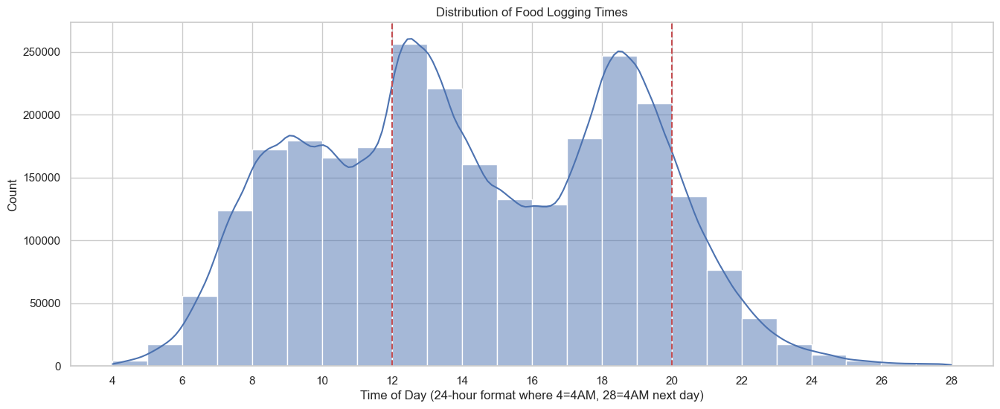

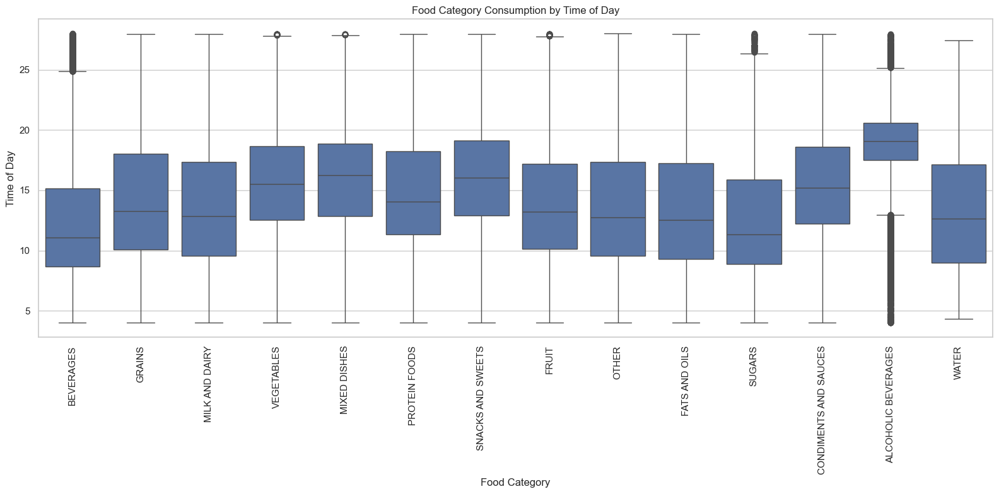

In [202]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Just use seaborn's set_style without plt.style.use
sns.set_theme()  # Use default seaborn theme
sns.set_style("whitegrid")  # Set seaborn whitegrid style

plt.figure(figsize=(16, 6))

# Distribution of food logging times throughout the day
sns.histplot(food_df['time'], bins=24, kde=True)
plt.title('Distribution of Food Logging Times')
plt.xlabel('Time of Day (24-hour format where 4=4AM, 28=4AM next day)')
plt.ylabel('Count')
plt.xticks(np.arange(4, 29, 2))
plt.axvline(x=12, color='r', linestyle='--')  # Noon marker
plt.axvline(x=20, color='r', linestyle='--')  # 8PM marker
plt.show()

# Category distribution by time of day
plt.figure(figsize=(16, 8))
sns.boxplot(x='main_category', y='time', data=food_df)
plt.title('Food Category Consumption by Time of Day')
plt.xlabel('Food Category')
plt.ylabel('Time of Day')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Feature Engineering

## User-Level Basic Features

In [523]:
import pandas as pd

# Group by user to get user-level statistics
user_stats = food_df.groupby('pid').agg(
    total_logs=('food_name', 'count'),
    avg_time=('time', 'mean'),
    min_time=('time', 'min'),
    max_time=('time', 'max'),
    time_std=('time', 'std'),
    unique_foods=('food_name', lambda x: x.nunique()),
    unique_categories=('main_category', lambda x: x.nunique()),
    unique_secondary=('secondary_category', lambda x: x.nunique()),
    num_days=('compliance_date', lambda x: x.nunique())
).reset_index()

# Calculate logs per day (eating frequency)
user_stats['logs_per_day'] = user_stats['total_logs'] / user_stats['num_days']

# Print summary of user stats
display(user_stats.describe())


,total_logs,avg_time,min_time,max_time,time_std,unique_foods,unique_categories,unique_secondary,num_days,logs_per_day
count,17409.00000,17409.000000,17409.000000,17409.000000,17409.000000,17409.000000,17409.000000,17409.000000,17409.000000,17409.000000
mean,155.77684,14.298845,7.071491,22.476389,4.209609,54.835487,10.822678,23.867023,13.699121,11.341878
std,70.50163,1.397519,1.433417,2.118674,0.617971,22.113629,1.777967,5.673480,0.677908,5.050410
min,9.00000,6.887179,4.000000,8.783333,0.463114,1.000000,1.000000,1.000000,8.000000,1.000000
25%,106.00000,13.391808,6.133333,21.050000,3.808532,40.000000,10.000000,20.000000,14.000000,7.785714
50%,143.00000,14.274598,7.012778,22.283333,4.206251,53.000000,11.000000,24.000000,14.000000,10.428571
75%,191.00000,15.179720,7.950000,23.733333,4.595091,68.000000,12.000000,28.000000,14.000000,13.916667
max,828.00000,21.530753,15.150000,27.993889,8.749876,184.000000,14.000000,40.000000,14.000000,59.142857


## Time-Based Features

In [524]:
# Define time bins for different parts of the day
def categorize_time(time):
    if 4 <= time < 10:
        return 'early_morning'
    elif 10 <= time < 14:
        return 'midday'
    elif 14 <= time < 18:
        return 'afternoon'
    elif 18 <= time < 22:
        return 'evening'
    else:  # 22-28 (4am next day)
        return 'night'

# Add time category column
food_df['time_category'] = food_df['time'].apply(categorize_time)

# Create user-level time bin features
time_features = pd.crosstab(
    food_df['pid'], 
    food_df['time_category'],
    normalize='index'
) * 100  # Convert to percentages

# Reset index to make pid a column
time_features = time_features.reset_index()

# Preview the time features
display(time_features.describe())

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/3505303701.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  food_df['time_category'] = food_df['time'].apply(categorize_time)


time_category,afternoon,early_morning,evening,midday,night
count,17409.000000,17409.000000,17409.000000,17409.000000,17409.000000
mean,22.048180,20.676125,24.609257,29.927590,2.738848
std,9.334661,12.436466,10.767663,9.310172,4.815519
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15.492958,11.214953,17.543860,23.913043,0.000000
50%,21.296296,20.183486,24.875622,29.651163,0.806452
75%,27.692308,28.971963,31.632653,35.714286,3.472222
max,85.393258,100.000000,86.923077,92.307692,64.102564


In [525]:
# Merge with user_stats
user_features = user_stats.merge(time_features, on='pid')

print("\nUser features shape:", user_features.shape)
display(user_features.head())


User features shape: (17409, 16)


,pid,total_logs,avg_time,min_time,max_time,time_std,unique_foods,unique_categories,unique_secondary,num_days,logs_per_day,afternoon,early_morning,evening,midday,night
0,alqt150211047,255,13.522499,8.256944,21.013056,2.870070,77,13,30,14,18.214286,45.882353,10.588235,3.529412,40.000000,0.000000
1,alqt150211119,93,13.553707,7.633333,21.050000,4.421242,48,12,28,13,7.153846,11.827957,26.881720,26.881720,34.408602,0.000000
2,alqt150211143,115,10.682174,7.166667,16.716667,3.058861,38,9,19,14,8.214286,20.869565,51.304348,0.000000,27.826087,0.000000
3,alqt150211144,94,14.156475,6.266667,21.483333,4.939310,33,10,25,14,6.714286,12.765957,22.340426,32.978723,31.914894,0.000000
4,alqt150211157,113,12.388100,4.000000,27.989167,4.840043,28,9,17,14,8.071429,3.539823,34.513274,22.123894,38.938053,0.884956


## Food Category Features

In [526]:
# Create user-level food category features
category_features = pd.crosstab(
    food_df['pid'], 
    food_df['main_category'],
    normalize='index'
) * 100  # Convert to percentages

# Check the resulting features
print(f"Food category features shape: {category_features.shape}")
display(category_features.head())

# Calculate food diversity metrics
category_features['category_diversity'] = category_features.gt(0).sum(axis=1)
category_features = category_features.reset_index()

# Merge with existing user features
user_features = user_features.merge(category_features, on='pid')

print("\nUpdated user features shape:", user_features.shape)

Food category features shape: (17409, 14)


main_category,ALCOHOLIC BEVERAGES,BEVERAGES,CONDIMENTS AND SAUCES,FATS AND OILS,FRUIT,GRAINS,MILK AND DAIRY,MIXED DISHES,OTHER,PROTEIN FOODS,SNACKS AND SWEETS,SUGARS,VEGETABLES,WATER
pid,,,,,,,,,,,,,,
alqt150211047,0.392157,9.019608,2.352941,0.784314,9.019608,16.862745,16.470588,2.745098,7.450980,12.549020,7.450980,0.784314,14.117647,0.0
alqt150211119,2.150538,6.451613,1.075269,2.150538,1.075269,16.129032,11.827957,9.677419,4.301075,17.204301,7.526882,0.000000,20.430108,0.0
alqt150211143,0.000000,5.217391,0.000000,0.869565,9.565217,9.565217,3.478261,2.608696,0.000000,31.304348,13.913043,0.000000,23.478261,0.0
alqt150211144,1.063830,13.829787,1.063830,0.000000,8.510638,21.276596,21.276596,14.893617,0.000000,8.510638,8.510638,0.000000,1.063830,0.0
alqt150211157,10.619469,4.424779,0.000000,0.000000,0.000000,4.424779,12.389381,11.504425,2.654867,32.743363,20.353982,0.000000,0.884956,0.0



Updated user features shape: (17409, 31)


In [545]:
food_df['food_name'].nunique()

2651

## Category-Time Interaction Features

In [527]:
# Create a new column combining food category and time category
food_df['category_time'] = food_df['main_category'] + '_' + food_df['time_category']

# Create user-level features for category-time combinations
ct_features = pd.crosstab(
    food_df['pid'], 
    food_df['category_time'],
    normalize='index'
) * 100  # Convert to percentages

# Due to potentially high dimensionality, let's select top combinations only
top_combinations = (
    food_df['category_time']
    .value_counts()
    .nlargest(30)  # Select top 30 most common combinations
    .index
)

# Filter for only the top combinations
ct_features_filtered = ct_features[top_combinations]
ct_features_filtered = ct_features_filtered.reset_index()

print(f"Category-time features shape: {ct_features_filtered.shape}")
display(ct_features_filtered.head())

# Merge with existing user features
user_features = user_features.merge(ct_features_filtered, on='pid')

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/3691901520.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  food_df['category_time'] = food_df['main_category'] + '_' + food_df['time_category']


Category-time features shape: (17409, 31)


category_time,pid,BEVERAGES_early_morning,PROTEIN FOODS_midday,VEGETABLES_evening,VEGETABLES_midday,BEVERAGES_midday,PROTEIN FOODS_evening,PROTEIN FOODS_afternoon,VEGETABLES_afternoon,GRAINS_midday,BEVERAGES_afternoon,PROTEIN FOODS_early_morning,FRUIT_midday,MILK AND DAIRY_midday,SNACKS AND SWEETS_evening,SNACKS AND SWEETS_afternoon,GRAINS_early_morning,MILK AND DAIRY_early_morning,GRAINS_evening,MIXED DISHES_evening,MIXED DISHES_midday,SNACKS AND SWEETS_midday,FRUIT_afternoon,FRUIT_early_morning,GRAINS_afternoon,BEVERAGES_evening,MILK AND DAIRY_afternoon,ALCOHOLIC BEVERAGES_evening,MIXED DISHES_afternoon,MILK AND DAIRY_evening,FRUIT_evening
0,alqt150211047,1.960784,4.705882,0.000000,6.274510,3.529412,0.392157,7.058824,5.882353,7.058824,3.137255,0.392157,4.313725,7.058824,0.000000,4.705882,2.352941,2.745098,0.000000,0.392157,0.784314,2.352941,3.529412,0.784314,7.450980,0.392157,6.274510,0.392157,1.568627,0.392157,0.392157
1,alqt150211119,4.301075,8.602151,7.526882,8.602151,2.150538,5.376344,0.000000,2.150538,5.376344,0.000000,3.225806,0.000000,2.150538,0.000000,2.150538,2.150538,5.376344,5.376344,3.225806,4.301075,1.075269,0.000000,1.075269,3.225806,0.000000,1.075269,2.150538,1.075269,3.225806,0.000000
2,alqt150211143,5.217391,7.826087,0.000000,6.956522,0.000000,0.000000,4.347826,6.956522,3.478261,0.000000,19.130435,2.608696,0.869565,0.000000,4.347826,4.347826,0.869565,0.000000,0.000000,0.869565,4.347826,0.000000,6.956522,1.739130,0.000000,1.739130,0.000000,1.739130,0.000000,0.000000
3,alqt150211144,8.510638,3.191489,1.063830,0.000000,3.191489,5.319149,0.000000,0.000000,6.382979,2.127660,0.000000,1.063830,5.319149,2.127660,3.191489,3.191489,6.382979,10.638298,4.255319,8.510638,3.191489,4.255319,2.127660,1.063830,0.000000,2.127660,1.063830,0.000000,7.446809,1.063830
4,alqt150211157,2.654867,18.584071,0.000000,0.884956,1.769912,2.654867,0.884956,0.000000,0.884956,0.000000,10.619469,0.000000,1.769912,7.079646,0.884956,1.769912,10.619469,1.769912,5.309735,5.309735,5.309735,0.000000,0.000000,0.000000,0.000000,0.000000,5.309735,0.884956,0.000000,0.000000


## First and Last Meal Features

In [528]:
# Group by user and date to find first and last meal times
daily_meals = food_df.groupby(['pid', 'compliance_date']).agg(
    first_meal=('time', 'min'),
    last_meal=('time', 'max')
).reset_index()

# Calculate eating window per day
daily_meals['daily_eating_window'] = daily_meals['last_meal'] - daily_meals['first_meal']

# Aggregate to user level
user_meal_patterns = daily_meals.groupby('pid').agg(
    avg_first_meal=('first_meal', 'mean'),
    avg_last_meal=('last_meal', 'mean'),
    std_first_meal=('first_meal', 'std'),
    std_last_meal=('last_meal', 'std'),
    avg_daily_window=('daily_eating_window', 'mean'),
    std_daily_window=('daily_eating_window', 'std')
).reset_index()

# Calculate regularity scores (lower std = more regular)
user_meal_patterns['meal_time_regularity'] = 1 / (user_meal_patterns['std_first_meal'] + 0.1)

# Merge with user features
user_features = user_features.merge(user_meal_patterns, on='pid')

print("User meal pattern features:")
display(user_meal_patterns.head())

User meal pattern features:


,pid,avg_first_meal,avg_last_meal,std_first_meal,std_last_meal,avg_daily_window,std_daily_window,meal_time_regularity
0,alqt150211047,9.979444,17.569544,0.754586,1.626780,7.590099,1.610175,1.170157
1,alqt150211119,8.133761,18.067949,0.374458,3.711578,9.934188,3.819659,2.107670
2,alqt150211143,7.633333,13.829762,0.373823,2.688398,6.196429,2.873160,2.110493
3,alqt150211144,8.045278,18.788968,2.113869,2.748569,10.743690,3.590483,0.451698
4,alqt150211157,5.904901,18.055694,1.540964,3.800641,12.150794,3.249232,0.609398


In [529]:
display(user_meal_patterns.describe())

,avg_first_meal,avg_last_meal,std_first_meal,std_last_meal,avg_daily_window,std_daily_window,meal_time_regularity
count,17409.000000,17409.000000,17409.000000,17409.000000,17409.000000,17409.000000,17409.000000
mean,9.343036,19.146922,1.989869,2.299119,9.803886,3.051551,0.650046
std,1.594009,1.663924,1.077781,1.094821,1.936462,1.162680,0.431261
min,4.440476,6.988889,0.031351,0.000000,0.000000,0.000000,0.133955
25%,8.229762,18.178205,1.148930,1.445627,8.523810,2.152629,0.355566
50%,9.205952,19.192857,1.774287,2.137425,9.850000,3.037020,0.533536
75%,10.332143,20.189286,2.712418,3.013970,11.138671,3.864880,0.800686
max,18.361905,26.936905,7.365186,10.394326,18.435714,9.805142,7.613170


In [530]:
user_meal_patterns['avg_daily_window'].describe()

count    17409.000000
mean         9.803886
std          1.936462
min          0.000000
25%          8.523810
50%          9.850000
75%         11.138671
max         18.435714
Name: avg_daily_window, dtype: float64

## Food Category Sequence Features

In [531]:
# from collections import defaultdict
# import itertools

# # Function to compute transition probabilities between food categories
# def get_transition_features(user_data):
#     transitions = defaultdict(int)
#     total_transitions = 0
    
#     # Get sorted data by time for this user
#     sorted_data = user_data.sort_values(['compliance_date', 'time'])
    
#     # Count transitions between food categories
#     for date, group in sorted_data.groupby('compliance_date'):
#         categories = group['main_category'].tolist()
        
#         # Count transitions within a day
#         for i in range(len(categories) - 1):
#             transition = (categories[i], categories[i+1])
#             transitions[transition] += 1
#             total_transitions += 1
    
#     # Create transition probabilities
#     if total_transitions > 0:
#         return {f"{a}_to_{b}": count/total_transitions 
#                 for (a, b), count in transitions.items()}
#     else:
#         return {}

# # Get transition features for each user
# transition_features = {}
# for pid, user_data in food_df.groupby('pid'):
#     if len(user_data) > 3:  # Only for users with enough data
#         transition_features[pid] = get_transition_features(user_data)

# # Convert to DataFrame
# transition_df = pd.DataFrame.from_dict(transition_features, orient='index').fillna(0)
# transition_df = transition_df.reset_index().rename(columns={'index': 'pid'})

# # user_features = user_features.merge(transition_df, on='pid')

# # # Limit to top transitions to manage dimensionality
# # top_transitions = transition_df.sum().nlargest(20).index
# # transition_df_filtered = transition_df[top_transitions].reset_index().rename(columns={'index': 'pid'})

# # print(f"Transition features shape: {transition_df_filtered.shape}")
# # display(transition_df_filtered.head())

# # # Merge with user features
# # user_features = user_features.merge(transition_df_filtered, on='pid')

In [532]:
user_features.head()

,pid,total_logs,avg_time,min_time,max_time,time_std,unique_foods,unique_categories,unique_secondary,num_days,logs_per_day,afternoon,early_morning,evening,midday,night,ALCOHOLIC BEVERAGES,BEVERAGES,CONDIMENTS AND SAUCES,FATS AND OILS,FRUIT,GRAINS,MILK AND DAIRY,MIXED DISHES,OTHER,PROTEIN FOODS,SNACKS AND SWEETS,SUGARS,VEGETABLES,WATER,category_diversity,BEVERAGES_early_morning,PROTEIN FOODS_midday,VEGETABLES_evening,VEGETABLES_midday,BEVERAGES_midday,PROTEIN FOODS_evening,PROTEIN FOODS_afternoon,VEGETABLES_afternoon,GRAINS_midday,BEVERAGES_afternoon,PROTEIN FOODS_early_morning,FRUIT_midday,MILK AND DAIRY_midday,SNACKS AND SWEETS_evening,SNACKS AND SWEETS_afternoon,GRAINS_early_morning,MILK AND DAIRY_early_morning,GRAINS_evening,MIXED DISHES_evening,MIXED DISHES_midday,SNACKS AND SWEETS_midday,FRUIT_afternoon,FRUIT_early_morning,GRAINS_afternoon,BEVERAGES_evening,MILK AND DAIRY_afternoon,ALCOHOLIC BEVERAGES_evening,MIXED DISHES_afternoon,MILK AND DAIRY_evening,FRUIT_evening,avg_first_meal,avg_last_meal,std_first_meal,std_last_meal,avg_daily_window,std_daily_window,meal_time_regularity
0,alqt150211047,255,13.522499,8.256944,21.013056,2.870070,77,13,30,14,18.214286,45.882353,10.588235,3.529412,40.000000,0.000000,0.392157,9.019608,2.352941,0.784314,9.019608,16.862745,16.470588,2.745098,7.450980,12.549020,7.450980,0.784314,14.117647,0.0,13,1.960784,4.705882,0.000000,6.274510,3.529412,0.392157,7.058824,5.882353,7.058824,3.137255,0.392157,4.313725,7.058824,0.000000,4.705882,2.352941,2.745098,0.000000,0.392157,0.784314,2.352941,3.529412,0.784314,7.450980,0.392157,6.274510,0.392157,1.568627,0.392157,0.392157,9.979444,17.569544,0.754586,1.626780,7.590099,1.610175,1.170157
1,alqt150211119,93,13.553707,7.633333,21.050000,4.421242,48,12,28,13,7.153846,11.827957,26.881720,26.881720,34.408602,0.000000,2.150538,6.451613,1.075269,2.150538,1.075269,16.129032,11.827957,9.677419,4.301075,17.204301,7.526882,0.000000,20.430108,0.0,12,4.301075,8.602151,7.526882,8.602151,2.150538,5.376344,0.000000,2.150538,5.376344,0.000000,3.225806,0.000000,2.150538,0.000000,2.150538,2.150538,5.376344,5.376344,3.225806,4.301075,1.075269,0.000000,1.075269,3.225806,0.000000,1.075269,2.150538,1.075269,3.225806,0.000000,8.133761,18.067949,0.374458,3.711578,9.934188,3.819659,2.107670
2,alqt150211143,115,10.682174,7.166667,16.716667,3.058861,38,9,19,14,8.214286,20.869565,51.304348,0.000000,27.826087,0.000000,0.000000,5.217391,0.000000,0.869565,9.565217,9.565217,3.478261,2.608696,0.000000,31.304348,13.913043,0.000000,23.478261,0.0,9,5.217391,7.826087,0.000000,6.956522,0.000000,0.000000,4.347826,6.956522,3.478261,0.000000,19.130435,2.608696,0.869565,0.000000,4.347826,4.347826,0.869565,0.000000,0.000000,0.869565,4.347826,0.000000,6.956522,1.739130,0.000000,1.739130,0.000000,1.739130,0.000000,0.000000,7.633333,13.829762,0.373823,2.688398,6.196429,2.873160,2.110493
3,alqt150211144,94,14.156475,6.266667,21.483333,4.939310,33,10,25,14,6.714286,12.765957,22.340426,32.978723,31.914894,0.000000,1.063830,13.829787,1.063830,0.000000,8.510638,21.276596,21.276596,14.893617,0.000000,8.510638,8.510638,0.000000,1.063830,0.0,10,8.510638,3.191489,1.063830,0.000000,3.191489,5.319149,0.000000,0.000000,6.382979,2.127660,0.000000,1.063830,5.319149,2.127660,3.191489,3.191489,6.382979,10.638298,4.255319,8.510638,3.191489,4.255319,2.127660,1.063830,0.000000,2.127660,1.063830,0.000000,7.446809,1.063830,8.045278,18.788968,2.113869,2.748569,10.743690,3.590483,0.451698
4,alqt150211157,113,12.388100,4.000000,27.989167,4.840043,28,9,17,14,8.071429,3.539823,34.513274,22.123894,38.938053,0.884956,10.619469,4.424779,0.000000,0.000000,0.000000,4.424779,12.389381,11.504425,2.654867,32.743363,20.353982,0.000000,0.884956,0.0,9,2.654867,18.584071,0.000000,0.884956,1.769912,2.654867,0.884956,0.000000,0.884956,0.000000,10.619469,0.000000,1.769912,7.079646,0.884956,1.769912,10.619469,1.769912,5.309735,5.309735,5.309735,0.000000,0.000000,0.000000,0.000000,0.000000,5.309735,0.884956,0.000000,0.000000,5.904901,18.0556

## Time-of-Day Category Proportions

In [533]:
# Calculate focused circadian nutrition features
circadian_features = {}

for pid, user_data in food_df.groupby('pid'):
    # Skip users with very little data
    if len(user_data) < 5:
        continue
        
    features = {}
    
    # 1. Calculate protein timing index (morning vs evening ratio)
    # (You already have individual percentages by time_category and food category)
    morning_protein = user_data[(user_data['time_category'].isin(['early_morning', 'midday'])) & 
                               (user_data['main_category'] == 'PROTEIN FOODS')].shape[0]
    evening_protein = user_data[(user_data['time_category'].isin(['evening', 'night'])) & 
                               (user_data['main_category'] == 'PROTEIN FOODS')].shape[0]
    
    if evening_protein > 0:
        features['protein_morning_evening_ratio'] = morning_protein / evening_protein
    else:
        features['protein_morning_evening_ratio'] = morning_protein if morning_protein > 0 else 0
    
    # 2. Calculate carb timing index (morning vs evening ratio)
    carb_categories = ['GRAINS', 'SNACKS AND SWEETS', 'SUGARS']
    morning_carbs = user_data[(user_data['time_category'].isin(['early_morning', 'midday'])) & 
                             (user_data['main_category'].isin(carb_categories))].shape[0]
    evening_carbs = user_data[(user_data['time_category'].isin(['evening', 'night'])) & 
                             (user_data['main_category'].isin(carb_categories))].shape[0]
    
    if evening_carbs > 0:
        features['carbs_morning_evening_ratio'] = morning_carbs / evening_carbs
    else:
        features['carbs_morning_evening_ratio'] = morning_carbs if morning_carbs > 0 else 0
    
    # 3. Calculate ratio of evening to total eating (chronotype indicator)
    total_logs = len(user_data)
    evening_logs = user_data[user_data['time_category'].isin(['evening', 'night'])].shape[0]
    features['evening_eating_ratio'] = evening_logs / total_logs if total_logs > 0 else 0
    
    # 4. Calculate weekend vs weekday eating pattern differences
    # Extract day of week from compliance_date (assuming it's a date type)
    if 'compliance_date' in user_data.columns:
        user_data['weekday'] = pd.to_datetime(user_data['compliance_date']).dt.dayofweek < 5  # True for weekdays, False for weekends
        
        weekday_data = user_data[user_data['weekday']]
        weekend_data = user_data[~user_data['weekday']]
        
        if len(weekday_data) > 0 and len(weekend_data) > 0:
            # Compare eating windows
            weekday_first = weekday_data.groupby('compliance_date')['time'].min().mean() if not weekday_data.empty else 0
            weekend_first = weekend_data.groupby('compliance_date')['time'].min().mean() if not weekend_data.empty else 0
            features['weekend_weekday_first_meal_diff'] = weekend_first - weekday_first
    
    # 5. Calculate the consistency of meal category at specific times
    # (Higher values = more consistent food choices by time window)
    # Corrected GINI coefficient calculation
    for time_cat in ['early_morning', 'midday', 'evening']:
        time_data = user_data[user_data['time_category'] == time_cat]
        if len(time_data) >= 5:
            category_counts = time_data['main_category'].value_counts(normalize=True)
            if len(category_counts) > 1:
                sorted_freq = sorted(category_counts.values)
                n = len(sorted_freq)
                lorenz_curve = np.cumsum(sorted_freq) / np.sum(sorted_freq)
                lorenz_curve = np.insert(lorenz_curve, 0, 0)
                x_values = np.linspace(0, 1, n+1)
                area_under_lorenz = np.trapezoid(lorenz_curve, x_values)
                gini = 1 - 2 * area_under_lorenz
                features[f'{time_cat}_category_consistency'] = gini
            else:
                features[f'{time_cat}_category_consistency'] = 1.0
        else:
            # Option: mark as insufficient data or assign a default value
            features[f'{time_cat}_category_consistency'] = 1.0

    
    circadian_features[pid] = features

# Convert to DataFrame
circadian_df = pd.DataFrame.from_dict(circadian_features, orient='index').reset_index().rename(columns={'index': 'pid'})
circadian_df

In [ ]:

# Merge with user features
user_features = user_features.merge(circadian_df, on='pid')

In [536]:
user_features[user_features['early_morning_category_consistency'] >= 1.0]

,pid,total_logs,avg_time,min_time,max_time,time_std,unique_foods,unique_categories,unique_secondary,num_days,logs_per_day,afternoon,early_morning,evening,midday,night,ALCOHOLIC BEVERAGES,BEVERAGES,CONDIMENTS AND SAUCES,FATS AND OILS,FRUIT,GRAINS,MILK AND DAIRY,MIXED DISHES,OTHER,PROTEIN FOODS,SNACKS AND SWEETS,SUGARS,VEGETABLES,WATER,category_diversity,BEVERAGES_early_morning,PROTEIN FOODS_midday,VEGETABLES_evening,VEGETABLES_midday,BEVERAGES_midday,PROTEIN FOODS_evening,PROTEIN FOODS_afternoon,VEGETABLES_afternoon,GRAINS_midday,BEVERAGES_afternoon,PROTEIN FOODS_early_morning,FRUIT_midday,MILK AND DAIRY_midday,SNACKS AND SWEETS_evening,SNACKS AND SWEETS_afternoon,GRAINS_early_morning,MILK AND DAIRY_early_morning,GRAINS_evening,MIXED DISHES_evening,MIXED DISHES_midday,SNACKS AND SWEETS_midday,FRUIT_afternoon,FRUIT_early_morning,GRAINS_afternoon,BEVERAGES_evening,MILK AND DAIRY_afternoon,ALCOHOLIC BEVERAGES_evening,MIXED DISHES_afternoon,MILK AND DAIRY_evening,FRUIT_evening,avg_first_meal,avg_last_meal,std_first_meal,std_last_meal,avg_daily_window,std_daily_window,meal_time_regularity,protein_morning_evening_ratio,carbs_morning_evening_ratio,evening_eating_ratio,weekend_weekday_first_meal_diff,early_morning_category_consistency,midday_category_consistency,evening_category_consistency
14,alqt150211209194458,32,13.020495,6.766667,20.966667,4.122198,14,9,12,13,2.461538,18.750000,34.375000,18.750000,28.125000,0.000000,6.250000,50.000000,0.000000,0.000000,0.000000,3.125000,0.000000,12.500000,3.125000,15.625000,3.125000,3.125000,3.125000,0.000000,9,34.375000,0.000000,0.000000,3.125000,12.500000,9.375000,6.250000,0.000000,3.125000,3.125000,0.000000,0.000000,0.000000,0.000000,3.125000,0.0,0.00,0.000000,6.250000,6.250000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,3.125000,0.000000,0.000000,0.000000,9.364103,15.067970,1.795839,4.344329,5.703868,4.155967,0.527471,0.000000,1.000000,0.187500,0.133333,1.0,0.311111,0.222222
20,alqt150211214194407,168,15.029542,6.033333,23.000000,3.381744,73,14,30,14,12.000000,33.333333,7.142857,23.809524,34.523810,1.190476,4.166667,14.880952,1.785714,4.166667,11.309524,8.928571,6.547619,7.738095,1.190476,13.095238,12.500000,1.190476,11.904762,0.595238,14,7.142857,6.547619,4.166667,2.976190,4.761905,2.976190,3.571429,4.761905,4.761905,2.976190,0.000000,3.571429,1.190476,4.166667,3.571429,0.0,0.00,0.595238,3.571429,2.380952,4.761905,4.761905,0.0,3.571429,0.000000,2.976190,0.595238,1.785714,2.380952,2.976190,8.685099,19.646012,1.708956,1.145268,10.960913,2.187691,0.552805,2.200000,2.250000,0.250000,0.964694,1.0,0.316614,0.363636
29,alqt150211219195128,185,16.313074,8.833333,24.007778,3.428981,44,11,23,14,13.214286,32.432432,4.864865,37.297297,23.243243,2.162162,7.027027,20.000000,0.000000,6.486486,2.162162,14.594595,7.567568,4.864865,2.162162,11.351351,16.216216,0.000000,7.567568,0.000000,11,4.864865,0.540541,4.324324,1.621622,8.108108,8.108108,2.702703,1.621622,3.783784,4.324324,0.000000,0.540541,1.621622,3.783784,8.648649,0.0,0.00,4.864865,1.081081,1.081081,2.702703,1.621622,0.0,4.864865,2.702703,3.243243,7.027027,2.702703,2.702703,0.000000,10.207599,20.747163,1.419717,1.802183,10.539563,2.396700,0.658017,0.066667,0.600000,0.394595,-0.324764,1.0,0.458140,0.340580
36,alqt150211222195042,278,13.884468,7.250000,21.524167,3.238543,80,11,26,13,21.384615,19.064748,0.359712,17.985612,62.589928,0.000000,0.000000,7.553957,11.510791,1.079137,14.028777,3.237410,1.438849,5.035971,3.597122,35.611511,3.956835,0.000000,12.949640,0.000000,11,0.359712,28.417266,4.316547,4.316547,5.755396,2.877698,4.316547,4.316547,0.000000,0.719424,0.000000,11.870504,0.359712,2.517986,1.079137,0.0,0.00,1.798561,1.079137,0.719424,0.359712,1.079137,0.0,1.438849,0.719424,0.719424,0.000000,3.237410,0.359712,1.079137,11.113162,18.430064,1.432943,1.940821,7.316902,3.019418,0.652340,9.875000,0.083333,0.179856,-1.858778,1.0,0.616092,0.392727
47,alqt150211229195719,107,14.217357,5.900000,19.250000,3.793776,37,10,15,12,8.916667,13.084112,14.018692,

In [538]:
# 0.0 
food_df[(food_df['pid'] == 'alqt230321239501') & (food_df['time_category'] == 'early_morning')]

,pid,time,compliance_date,food_name,main_category,secondary_category,third_category,time_category,category_time
3182423,alqt230321239501,8.677500,2023-03-23,tea,BEVERAGES,Coffee and Tea,Tea,early_morning,BEVERAGES_early_morning
3182424,alqt230321239501,8.683333,2023-03-23,tea,BEVERAGES,Coffee and Tea,Tea,early_morning,BEVERAGES_early_morning
3182425,alqt230321239501,9.633333,2023-03-23,tea,BEVERAGES,Coffee and Tea,Tea,early_morning,BEVERAGES_early_morning


,pid,total_logs,avg_time,min_time,max_time,time_std,unique_foods,unique_categories,unique_secondary,num_days,logs_per_day,afternoon,early_morning,evening,midday,night,ALCOHOLIC BEVERAGES,BEVERAGES,CONDIMENTS AND SAUCES,FATS AND OILS,FRUIT,GRAINS,MILK AND DAIRY,MIXED DISHES,OTHER,PROTEIN FOODS,SNACKS AND SWEETS,SUGARS,VEGETABLES,WATER,category_diversity,BEVERAGES_early_morning,PROTEIN FOODS_midday,VEGETABLES_evening,VEGETABLES_midday,BEVERAGES_midday,PROTEIN FOODS_evening,PROTEIN FOODS_afternoon,VEGETABLES_afternoon,GRAINS_midday,BEVERAGES_afternoon,PROTEIN FOODS_early_morning,FRUIT_midday,MILK AND DAIRY_midday,SNACKS AND SWEETS_evening,SNACKS AND SWEETS_afternoon,GRAINS_early_morning,MILK AND DAIRY_early_morning,GRAINS_evening,MIXED DISHES_evening,MIXED DISHES_midday,SNACKS AND SWEETS_midday,FRUIT_afternoon,FRUIT_early_morning,GRAINS_afternoon,BEVERAGES_evening,MILK AND DAIRY_afternoon,ALCOHOLIC BEVERAGES_evening,MIXED DISHES_afternoon,MILK AND DAIRY_evening,FRUIT_evening,avg_first_meal,avg_last_meal,std_first_meal,std_last_meal,avg_daily_window,std_daily_window,meal_time_regularity,protein_morning_evening_ratio,carbs_morning_evening_ratio,evening_eating_ratio,weekend_weekday_first_meal_diff,early_morning_category_consistency,midday_category_consistency,evening_category_consistency,cluster
0,alqt150211047,255,13.522499,8.256944,21.013056,2.870070,77,13,30,14,18.214286,45.882353,10.588235,3.529412,40.000000,0.000000,0.392157,9.019608,2.352941,0.784314,9.019608,16.862745,16.470588,2.745098,7.450980,12.549020,7.450980,0.784314,14.117647,0.000000,13,1.960784,4.705882,0.000000,6.274510,3.529412,0.392157,7.058824,5.882353,7.058824,3.137255,0.392157,4.313725,7.058824,0.000000,4.705882,2.352941,2.745098,0.000000,0.392157,0.784314,2.352941,3.529412,0.784314,7.450980,0.392157,6.274510,0.392157,1.568627,0.392157,0.392157,9.979444,17.569544,0.754586,1.626780,7.590099,1.610175,1.170157,13.000000,31.000000,0.035294,0.223319,0.328042,0.361854,0.097222,1
1,alqt150211119,93,13.553707,7.633333,21.050000,4.421242,48,12,28,13,7.153846,11.827957,26.881720,26.881720,34.408602,0.000000,2.150538,6.451613,1.075269,2.150538,1.075269,16.129032,11.827957,9.677419,4.301075,17.204301,7.526882,0.000000,20.430108,0.000000,12,4.301075,8.602151,7.526882,8.602151,2.150538,5.376344,0.000000,2.150538,5.376344,0.000000,3.225806,0.000000,2.150538,0.000000,2.150538,2.150538,5.376344,5.376344,3.225806,4.301075,1.075269,0.000000,1.075269,3.225806,0.000000,1.075269,2.150538,1.075269,3.225806,0.000000,8.133761,18.067949,0.374458,3.711578,9.934188,3.819659,2.107670,2.200000,2.400000,0.268817,0.498920,0.300000,0.409722,0.220000,2
2,alqt150211143,115,10.682174,7.166667,16.716667,3.058861,38,9,19,14,8.214286,20.869565,51.304348,0.000000,27.826087,0.000000,0.000000,5.217391,0.000000,0.869565,9.565217,9.565217,3.478261,2.608696,0.000000,31.304348,13.913043,0.000000,23.478261,0.000000,9,5.217391,7.826087,0.000000,6.956522,0.000000,0.000000,4.347826,6.956522,3.478261,0.000000,19.130435,2.608696,0.869565,0.000000,4.347826,4.347826,0.869565,0.000000,0.000000,0.869565,4.347826,0.000000,6.956522,1.739130,0.000000,1.739130,0.000000,1.739130,0.000000,0.000000,7.633333,13.829762,0.373823,2.688398,6.196429,2.873160,2.110493,31.000000,20.000000,0.000000,0.560000,0.372881,0.406250,0.000000,1
3,alqt150211144,94,14.156475,6.266667,21.483333,4.939310,33,10,25,14,6.714286,12.765957,22.340426,32.978723,31.914894,0.000000,1.063830,13.829787,1.063830,0.000000,8.510638,21.276596,21.276596,14.893617,0.000000,8.510638,8.510638,0.000000,1.063830,0.000000,10,8.510638,3.191489,1.063830,0.000000,3.191489,5.319149,0.000000,0.000000,6.382979,2.127660,0.000000,1.063830,5.319149,2.127660,3.191489,3.191489,6.382979,10.638298,4.255319,8.510638,3.191489,4.255319,2.127660,1.063830,0.000000,2.127660,1.063830,0.000000,7.446809,1.063830,8.045278,18.788968,2.113869,2.748569,10.743690,3.590483,0.451698,0.600000,1.000000,0.329787,2.085028,0.304762,0.333333,0.431452,2
4,alqt150211157,113,12.388100,4.000000,27.989167

In [521]:
# 0.095238
pid = 'alqt150211201196340'
print(feature_df.loc[feature_df['pid'] == pid, 'early_morning_category_consistency'])
food_df[(food_df['pid'] == pid) & (food_df['time_category'] == 'early_morning')]

5    0.095238
Name: early_morning_category_consistency, dtype: float64


,pid,time,compliance_date,food_name,main_category,secondary_category,third_category,time_category,category_time
685,alqt150211201196340,9.300000,2021-12-30,blueberry,FRUIT,Fruits,Blueberries and other berries,early_morning,FRUIT_early_morning
686,alqt150211201196340,9.300000,2021-12-30,rolled oats,GRAINS,Cooked Cereals,Oatmeal,early_morning,GRAINS_early_morning
687,alqt150211201196340,9.300000,2021-12-30,almond,PROTEIN FOODS,Plant-based Protein Foods,Nuts and seeds,early_morning,PROTEIN FOODS_early_morning
688,alqt150211201196340,9.300000,2021-12-30,butter,FATS AND OILS,Fats and Oils,Butter and animal fats,early_morning,FATS AND OILS_early_morning
689,alqt150211201196340,9.316667,2021-12-30,black coffee,BEVERAGES,Coffee and Tea,Coffee,early_morning,BEVERAGES_early_morning
690,alqt150211201196340,9.333333,2021-12-30,almond,PROTEIN FOODS,Plant-based Protein Foods,Nuts and seeds,early_morning,PROTEIN FOODS_early_morning
691,alqt150211201196340,9.333333,2021-12-30,butter,FATS AND OILS,Fats and Oils,Butter and animal fats,early_morning,FATS AND OILS_early_morning
692,alqt150211201196340,9.333333,2021-12-30,rolled oats,GRAINS,Cooked Cereals,Oatmeal,early_morning,GRAINS_early_morning
693,alqt150211201196340,9.333333,2021-12-30,blueberry,FRUIT,Fruits,Blueberries and other berries,early_morning,FRUIT_early_morning
749,alqt150211201196340,9.050000,2022-01-03,larabar,SNACKS AND SWEETS,Snack/Meal Bars,Nutrition bars,early_morning,SNACKS AND SWEETS_early_morning


In [522]:
# 0.0
pid = 'alqt230321239501'
print(feature_df.loc[feature_df['pid'] == pid, 'early_morning_category_consistency'])
food_df[(food_df['pid'] == pid) & (food_df['time_category'] == 'early_morning')]

17400    0.0
Name: early_morning_category_consistency, dtype: float64


,pid,time,compliance_date,food_name,main_category,secondary_category,third_category,time_category,category_time
3182423,alqt230321239501,8.677500,2023-03-23,tea,BEVERAGES,Coffee and Tea,Tea,early_morning,BEVERAGES_early_morning
3182424,alqt230321239501,8.683333,2023-03-23,tea,BEVERAGES,Coffee and Tea,Tea,early_morning,BEVERAGES_early_morning
3182425,alqt230321239501,9.633333,2023-03-23,tea,BEVERAGES,Coffee and Tea,Tea,early_morning,BEVERAGES_early_morning


In [443]:
circadian_df.describe()

,protein_morning_evening_ratio,carbs_morning_evening_ratio,evening_eating_ratio,weekend_weekday_first_meal_diff,early_morning_category_consistency,midday_category_consistency,evening_category_consistency
count,17409.000000,17409.000000,17409.000000,17409.000000,15911.000000,17288.000000,16807.000000
mean,3.180212,2.879960,0.273481,0.623329,0.402367,0.378728,0.361997
std,4.992574,4.444311,0.122069,1.557399,0.180619,0.096042,0.099439
min,0.000000,0.000000,0.000000,-8.166960,0.000000,0.000000,0.000000
25%,0.875000,0.846154,0.192661,-0.323333,0.305556,0.319444,0.300676
50%,1.666667,1.600000,0.275862,0.474000,0.393162,0.378405,0.363158
75%,3.250000,3.000000,0.352941,1.457500,0.470588,0.436782,0.425431
max,98.000000,89.000000,0.980645,10.693667,1.000000,1.000000,1.000000


## Final Feature Processing

In [539]:
# Check for any missing values in the feature set
print("Missing values in feature set:")
print(user_features.isnull().sum())


Missing values in feature set:
pid                                   0
total_logs                            0
avg_time                              0
min_time                              0
max_time                              0
                                     ..
evening_eating_ratio                  0
weekend_weekday_first_meal_diff       0
early_morning_category_consistency    0
midday_category_consistency           0
evening_category_consistency          0
Length: 75, dtype: int64


In [445]:

# Fill any missing values with appropriate defaults
user_features = user_features.fillna(0)

# Exclude the 'pid' column from variance check
numeric_columns = user_features.select_dtypes(include=['number']).columns

# Check for features with zero variance (these won't be useful for clustering)
zero_var_cols = [col for col in numeric_columns if user_features[col].std() == 0]
if zero_var_cols:
    print(f"Removing {len(zero_var_cols)} zero-variance features")
    user_features = user_features.drop(columns=zero_var_cols)


In [446]:
user_features.columns

Index(['pid', 'total_logs', 'avg_time', 'min_time', 'max_time', 'time_std',
       'unique_foods', 'unique_categories', 'unique_secondary', 'num_days',
       'logs_per_day', 'afternoon', 'early_morning', 'evening', 'midday',
       'night', 'ALCOHOLIC BEVERAGES', 'BEVERAGES', 'CONDIMENTS AND SAUCES',
       'FATS AND OILS', 'FRUIT', 'GRAINS', 'MILK AND DAIRY', 'MIXED DISHES',
       'OTHER', 'PROTEIN FOODS', 'SNACKS AND SWEETS', 'SUGARS', 'VEGETABLES',
       'WATER', 'category_diversity', 'BEVERAGES_early_morning',
       'PROTEIN FOODS_midday', 'VEGETABLES_evening', 'VEGETABLES_midday',
       'BEVERAGES_midday', 'PROTEIN FOODS_evening', 'PROTEIN FOODS_afternoon',
       'VEGETABLES_afternoon', 'GRAINS_midday', 'BEVERAGES_afternoon',
       'PROTEIN FOODS_early_morning', 'FRUIT_midday', 'MILK AND DAIRY_midday',
       'SNACKS AND SWEETS_evening', 'SNACKS AND SWEETS_afternoon',
       'GRAINS_early_morning', 'MILK AND DAIRY_early_morning',
       'GRAINS_evening', 'MIXED DISHES_eveni

In [540]:
# Store the pid column separately before scaling
pid_col = user_features['pid']
user_features_no_pid = user_features.drop(columns=['pid'])

# Scale the features
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_features = scaler.fit_transform(user_features_no_pid)

# Convert back to DataFrame for easier use
scaled_df = pd.DataFrame(
    scaled_features, 
    columns=user_features_no_pid.columns, 
    index=user_features_no_pid.index
)

# Add back the pid column
scaled_df['pid'] = pid_col

print("Final feature set shape:", scaled_df.shape)
display(scaled_df.head())

# Save the features for clustering
scaled_df.to_csv('user_food_clustering_features.csv', index=False)
print("Features saved to 'user_features_for_clustering.csv'")

Final feature set shape: (17409, 75)


,total_logs,avg_time,min_time,max_time,time_std,unique_foods,unique_categories,unique_secondary,num_days,logs_per_day,afternoon,early_morning,evening,midday,night,ALCOHOLIC BEVERAGES,BEVERAGES,CONDIMENTS AND SAUCES,FATS AND OILS,FRUIT,GRAINS,MILK AND DAIRY,MIXED DISHES,OTHER,PROTEIN FOODS,SNACKS AND SWEETS,SUGARS,VEGETABLES,WATER,category_diversity,BEVERAGES_early_morning,PROTEIN FOODS_midday,VEGETABLES_evening,VEGETABLES_midday,BEVERAGES_midday,PROTEIN FOODS_evening,PROTEIN FOODS_afternoon,VEGETABLES_afternoon,GRAINS_midday,BEVERAGES_afternoon,PROTEIN FOODS_early_morning,FRUIT_midday,MILK AND DAIRY_midday,SNACKS AND SWEETS_evening,SNACKS AND SWEETS_afternoon,GRAINS_early_morning,MILK AND DAIRY_early_morning,GRAINS_evening,MIXED DISHES_evening,MIXED DISHES_midday,SNACKS AND SWEETS_midday,FRUIT_afternoon,FRUIT_early_morning,GRAINS_afternoon,BEVERAGES_evening,MILK AND DAIRY_afternoon,ALCOHOLIC BEVERAGES_evening,MIXED DISHES_afternoon,MILK AND DAIRY_evening,FRUIT_evening,avg_first_meal,avg_last_meal,std_first_meal,std_last_meal,avg_daily_window,std_daily_window,meal_time_regularity,protein_morning_evening_ratio,carbs_morning_evening_ratio,evening_eating_ratio,weekend_weekday_first_meal_diff,early_morning_category_consistency,midday_category_consistency,evening_category_consistency,pid
0,1.407429,-0.555533,0.827036,-0.690703,-2.167704,1.002330,1.224648,1.081021,0.443847,1.360801,2.553372,-0.811177,-1.957755,1.081903,-0.568771,-0.561483,-0.744802,-0.075472,-0.502031,0.248475,0.986787,1.419922,-0.847957,1.540352,-0.483616,-0.099876,-0.209639,0.053071,-0.176485,1.224648,-0.803747,-0.173473,-1.167111,0.463133,-0.332841,-1.220254,1.101766,0.761656,1.408077,0.076520,-0.646140,0.682395,1.911009,-0.988748,0.955372,-0.033503,0.174697,-1.023744,-0.898322,-0.650447,0.144931,0.824721,-0.331913,2.812535,-0.610949,2.534666,-0.462654,-0.140169,-0.604820,-0.526901,0.399262,-0.948014,-1.146168,-0.614125,-1.143245,-1.239736,1.206057,1.966935,6.327381,-1.951307,-0.256852,-0.522583,-0.194897,-1.885837,alqt150211047
1,-0.890457,-0.533202,0.391972,-0.673265,0.342475,-0.309116,0.662192,0.728494,-1.031322,-0.829270,-1.094900,0.498998,0.211051,0.481317,-0.568771,-0.176392,-0.983926,-0.516492,-0.187821,-1.047012,0.879327,0.661677,0.417554,0.646546,0.101898,-0.087486,-0.503334,0.822185,-0.176485,0.662192,-0.428914,0.862905,0.762707,1.060284,-0.661774,0.335021,-1.221970,-0.356809,0.803845,-0.974786,0.161167,-0.878839,-0.073253,-0.988748,-0.125952,-0.095374,0.993095,1.288055,0.286189,0.777786,-0.424072,-0.874762,-0.227968,0.669010,-0.773803,-0.272001,0.140914,-0.389405,0.979284,-0.741326,-0.758660,-0.648470,-1.498874,1.290165,0.067291,0.660654,3.380006,-0.196340,-0.107997,-0.038208,-0.079885,-0.639120,0.245329,-1.078622,alqt150211119
2,-0.578398,-2.587996,0.066400,-2.718629,-1.862194,-0.761339,-1.025176,-0.857880,0.443847,-0.619293,-0.126266,2.462846,-2.285544,-0.225728,-0.568771,-0.647366,-1.098854,-0.887647,-0.482424,0.337448,-0.082014,-0.702014,-0.872858,-0.573913,1.875321,0.954945,-0.503334,1.193573,-0.176485,-1.025176,-0.282153,0.656478,-1.167111,0.638101,-1.174789,-1.342623,0.209317,1.083596,0.122183,-0.974786,4.692398,0.065307,-0.591109,-0.988748,0.803857,0.576299,-0.408651,-1.023744,-1.062250,-0.615825,1.033340,-0.874762,1.873130,-0.085213,-0.773803,0.086367,-0.597263,-0.054033,-0.824049,-0.741326,-1.072611,-3.195646,-1.499463,0.355575,-1.862965,-0.153435,3.386551,5.572393,3.852235,-2.240448,-0.040665,-0.336243,0.213397,4.049569,alqt150211143
3,-0.876272,-0.101877,-0.561489,-0.468729,1.180836,-0.987451,-0.462720,0.199703,0.443847,-0.916307,-0.994411,0.133828,0.777300,0.213461,-0.568771,-0.414384,-0.296891,-0.520441,-0.682411,0.165477,1.633243,2.204850,1.369784,-0.573913,-0.991540,0.073095,-0.503334,-1.537413,-0.176485,-0.462720,0.245310,-0.576290,-0.894356,-1.146581,-0.413453,0.317174,-1.221970,-1.001348,1.165360,-0.261799,-0.757866,-0.493815,1.207715,-0.135603,0.314539,0.222827,1.306189,3.550667,0.716541,2.487380,0.518373,1.174260,0.148002,-0.427808,

Features saved to 'user_features_for_clustering.csv'


## Feature Correlation Analysis

In [214]:
# Option 1: Save column names to a text file
with open('column_names.txt', 'w') as f:
    for col in user_features_no_pid.columns:
        f.write(col + '\n')
print("Column names saved to column_names.txt")

Column names saved to column_names.txt


In [215]:
food_df['main_category'].value_counts(normalize=True)

main_category
PROTEIN FOODS            0.163780
BEVERAGES                0.157169
VEGETABLES               0.148419
GRAINS                   0.097407
MILK AND DAIRY           0.081572
FRUIT                    0.080783
SNACKS AND SWEETS        0.078131
MIXED DISHES             0.063586
FATS AND OILS            0.033399
CONDIMENTS AND SAUCES    0.029040
ALCOHOLIC BEVERAGES      0.027377
OTHER                    0.022057
SUGARS                   0.015357
WATER                    0.001922
Name: proportion, dtype: float64

In [342]:
user_features_no_pid.shape

(100, 17)

Using 16 features for correlation analysis


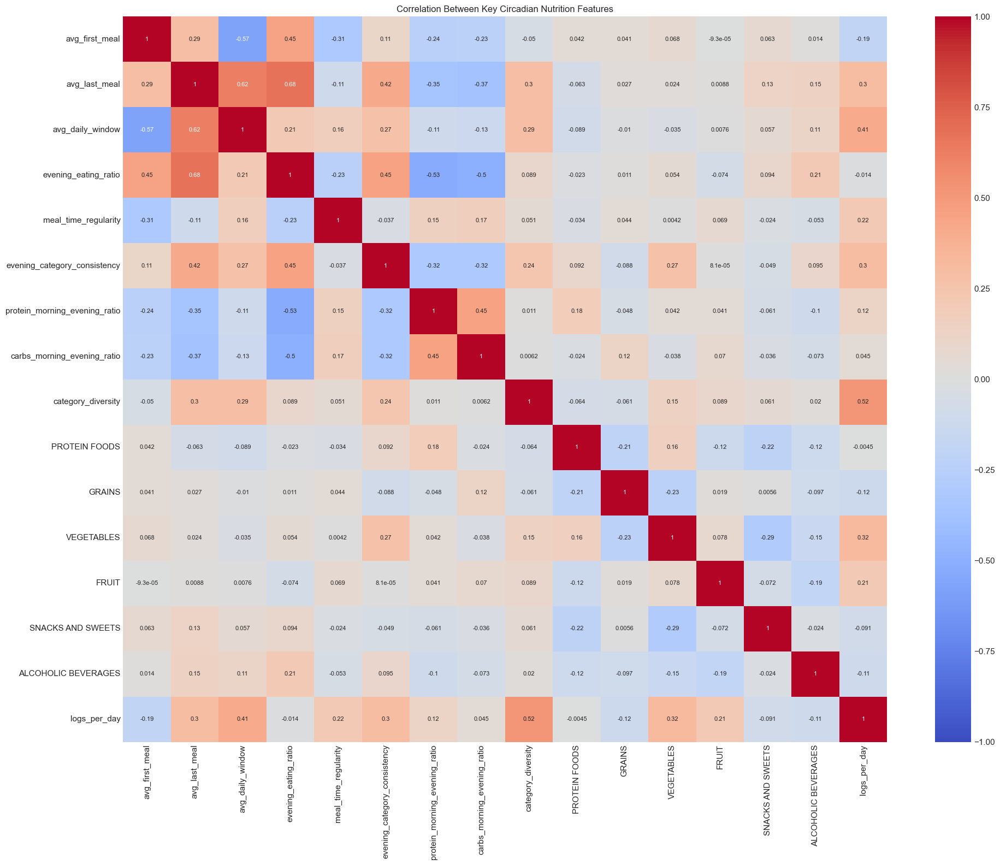

In [448]:
# Analyze feature correlations focused on circadian nutrition
plt.figure(figsize=(20, 16))
corr_matrix = user_features_no_pid.corr()


key_features = [
    # Overall Timing & Window
    'avg_first_meal',
    'avg_last_meal',
    'avg_daily_window',
    'evening_eating_ratio', # Summarizes late eating

    # Regularity & Consistency
    'meal_time_regularity', # Based on first meal time
    'morning_category_consistency',
    'evening_category_consistency', # Routine in food type choice later

    # Macronutrient Timing
    'protein_morning_evening_ratio',
    'carbs_morning_evening_ratio',

    # Diet Composition / Variety
    'category_diversity',
    'PROTEIN FOODS', # Overall % Protein (Example, pick 1-2 key ones)
    'GRAINS', 
    'VEGETABLES',
    'FRUIT',
    'SNACKS AND SWEETS', # Overall % Snacks (Example)
    'ALCOHOLIC BEVERAGES',

    # External Factors / Overall
    'logs_per_day' # Overall activity level
]

# Check if all features exist
existing_features = [col for col in key_features if col in user_features_no_pid.columns]
# existing_features = user_features_no_pid.columns
print(f"Using {len(existing_features)} features for correlation analysis")

# Create and display correlation matrix
key_corr = corr_matrix.loc[existing_features, existing_features]
sns.heatmap(key_corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1, annot_kws={"size": 8})
plt.title('Correlation Between Key Circadian Nutrition Features')
plt.tight_layout()
plt.show()

In [368]:
user_features

,pid,total_logs,avg_time,min_time,max_time,time_std,unique_foods,unique_categories,unique_secondary,num_days,logs_per_day,afternoon,early_morning,evening,midday,night,ALCOHOLIC BEVERAGES,BEVERAGES,CONDIMENTS AND SAUCES,FATS AND OILS,FRUIT,GRAINS,MILK AND DAIRY,MIXED DISHES,OTHER,PROTEIN FOODS,SNACKS AND SWEETS,SUGARS,VEGETABLES,WATER,category_diversity,BEVERAGES_early_morning,PROTEIN FOODS_midday,VEGETABLES_evening,VEGETABLES_midday,BEVERAGES_midday,PROTEIN FOODS_evening,PROTEIN FOODS_afternoon,VEGETABLES_afternoon,GRAINS_midday,BEVERAGES_afternoon,PROTEIN FOODS_early_morning,FRUIT_midday,MILK AND DAIRY_midday,SNACKS AND SWEETS_evening,SNACKS AND SWEETS_afternoon,GRAINS_early_morning,MILK AND DAIRY_early_morning,GRAINS_evening,MIXED DISHES_evening,MIXED DISHES_midday,SNACKS AND SWEETS_midday,FRUIT_afternoon,FRUIT_early_morning,GRAINS_afternoon,BEVERAGES_evening,MILK AND DAIRY_afternoon,ALCOHOLIC BEVERAGES_evening,MIXED DISHES_afternoon,MILK AND DAIRY_evening,FRUIT_evening,avg_first_meal,avg_last_meal,std_first_meal,std_last_meal,avg_daily_window,std_daily_window,meal_time_regularity,protein_morning_evening_ratio,carbs_morning_evening_ratio,evening_eating_ratio,weekend_weekday_first_meal_diff,early_morning_category_consistency,midday_category_consistency,evening_category_consistency
0,alqt150211047,255,13.522499,8.256944,21.013056,2.870070,77,13,30,14,18.214286,45.882353,10.588235,3.529412,40.000000,0.000000,0.392157,9.019608,2.352941,0.784314,9.019608,16.862745,16.470588,2.745098,7.450980,12.549020,7.450980,0.784314,14.117647,0.000000,13,1.960784,4.705882,0.000000,6.274510,3.529412,0.392157,7.058824,5.882353,7.058824,3.137255,0.392157,4.313725,7.058824,0.000000,4.705882,2.352941,2.745098,0.000000,0.392157,0.784314,2.352941,3.529412,0.784314,7.450980,0.392157,6.274510,0.392157,1.568627,0.392157,0.392157,9.979444,17.569544,0.754586,1.626780,7.590099,1.610175,1.170157,13.000000,31.000000,0.035294,0.223319,-0.328042,-0.361854,-0.097222
1,alqt150211119,93,13.553707,7.633333,21.050000,4.421242,48,12,28,13,7.153846,11.827957,26.881720,26.881720,34.408602,0.000000,2.150538,6.451613,1.075269,2.150538,1.075269,16.129032,11.827957,9.677419,4.301075,17.204301,7.526882,0.000000,20.430108,0.000000,12,4.301075,8.602151,7.526882,8.602151,2.150538,5.376344,0.000000,2.150538,5.376344,0.000000,3.225806,0.000000,2.150538,0.000000,2.150538,2.150538,5.376344,5.376344,3.225806,4.301075,1.075269,0.000000,1.075269,3.225806,0.000000,1.075269,2.150538,1.075269,3.225806,0.000000,8.133761,18.067949,0.374458,3.711578,9.934188,3.819659,2.107670,2.200000,2.400000,0.268817,0.498920,-0.300000,-0.409722,-0.220000
2,alqt150211143,115,10.682174,7.166667,16.716667,3.058861,38,9,19,14,8.214286,20.869565,51.304348,0.000000,27.826087,0.000000,0.000000,5.217391,0.000000,0.869565,9.565217,9.565217,3.478261,2.608696,0.000000,31.304348,13.913043,0.000000,23.478261,0.000000,9,5.217391,7.826087,0.000000,6.956522,0.000000,0.000000,4.347826,6.956522,3.478261,0.000000,19.130435,2.608696,0.869565,0.000000,4.347826,4.347826,0.869565,0.000000,0.000000,0.869565,4.347826,0.000000,6.956522,1.739130,0.000000,1.739130,0.000000,1.739130,0.000000,0.000000,7.633333,13.829762,0.373823,2.688398,6.196429,2.873160,2.110493,31.000000,20.000000,0.000000,0.560000,-0.372881,-0.406250,0.000000
3,alqt150211144,94,14.156475,6.266667,21.483333,4.939310,33,10,25,14,6.714286,12.765957,22.340426,32.978723,31.914894,0.000000,1.063830,13.829787,1.063830,0.000000,8.510638,21.276596,21.276596,14.893617,0.000000,8.510638,8.510638,0.000000,1.063830,0.000000,10,8.510638,3.191489,1.063830,0.000000,3.191489,5.319149,0.000000,0.000000,6.382979,2.127660,0.000000,1.063830,5.319149,2.127660,3.191489,3.191489,6.382979,10.638298,4.255319,8.510638,3.191489,4.255319,2.127660,1.063830,0.000000,2.127660,1.063830,0.000000,7.446809,1.063830,8.045278,18.788968,2.113869,2.748569,10.743690,3.590483,0.451698,0.600000,1.000000,0.329787,2.085028,-0.304762,-0.333333,-0.431452
4,alqt150211157,113,12.388100,4.000000,27.989167,4.84

Using 18 features for correlation analysis: ['logs_per_day', 'avg_first_meal', 'avg_last_meal', 'avg_daily_window', 'early_morning', 'evening', 'evening_eating_ratio', 'meal_time_regularity', 'evening_category_consistency', 'protein_morning_evening_ratio', 'carbs_morning_evening_ratio', 'category_diversity', 'PROTEIN FOODS', 'GRAINS', 'VEGETABLES', 'FRUIT', 'SNACKS AND SWEETS', 'ALCOHOLIC BEVERAGES']


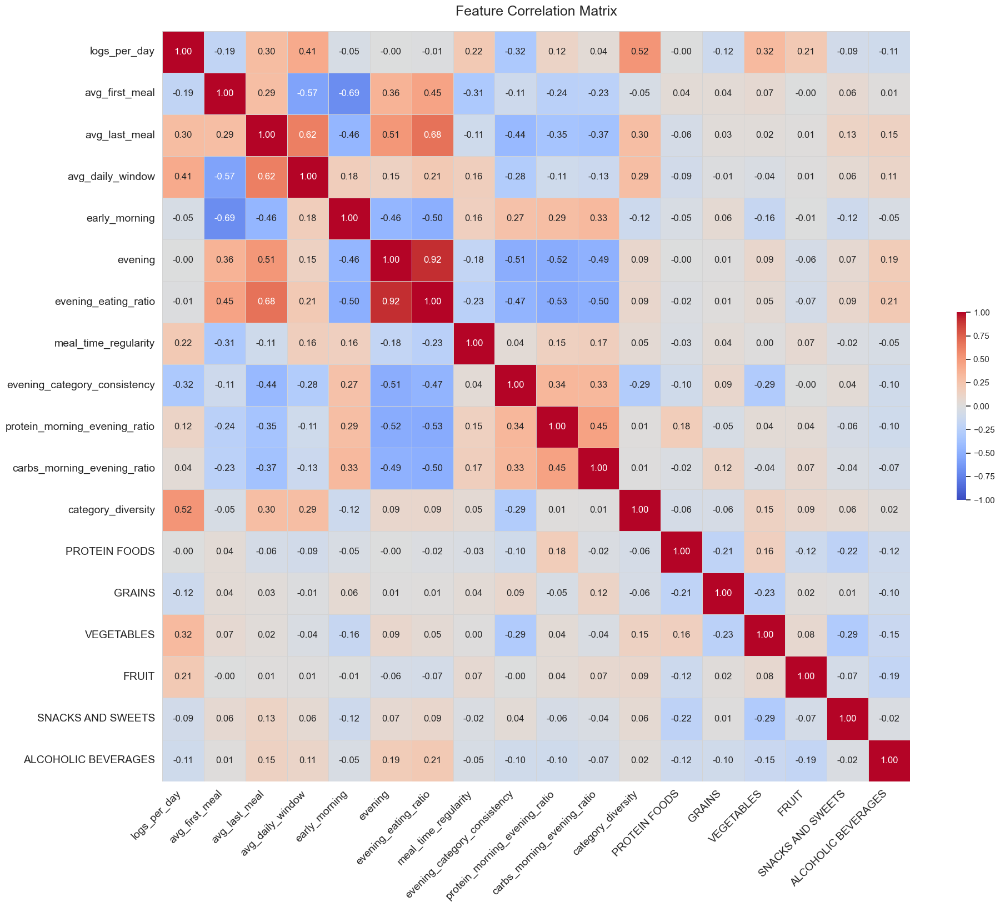

In [369]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
# Make sure numpy is imported if you don't already have it for other reasons
# import numpy as np 

# --- ASSUME user_features_no_pid is already loaded with your data ---
# Example: user_features_no_pid = pd.read_csv('your_data.csv') or however you load it

# Analyze feature correlations focused on circadian nutrition
corr_matrix = user_features_no_pid.corr()

key_features = [
    'logs_per_day', 
    # Overall Timing & Window
    'avg_first_meal',
    'avg_last_meal',
    'avg_daily_window',
    'early_morning',
    'evening',
    'evening_eating_ratio', # Summarizes late eating

    # Regularity & Consistency
    'meal_time_regularity', # Based on first meal time
    'morning_category_consistency',
    'evening_category_consistency', # Routine in food type choice later

    # Macronutrient Timing
    'protein_morning_evening_ratio',
    'carbs_morning_evening_ratio',

    # Diet Composition / Variety
    'category_diversity',
    'PROTEIN FOODS', # Overall % Protein (Example, pick 1-2 key ones)
    'GRAINS',
    'VEGETABLES',
    'FRUIT',
    'SNACKS AND SWEETS', # Overall % Snacks (Example)
    'ALCOHOLIC BEVERAGES',

]

# Check if all features exist
existing_features = [col for col in key_features if col in user_features_no_pid.columns]
print(f"Using {len(existing_features)} features for correlation analysis: {existing_features}")

# Create subset correlation matrix
key_corr = corr_matrix.loc[existing_features, existing_features]

# --- Plotting Modifications ---
plt.figure(figsize=(20, 17)) # Slightly increased height for rotated labels

# Set desired font sizes
annotation_fontsize = 12 # Increase text size IN cells
axis_label_fontsize = 14 # Increase axis label size

# Create heatmap with modifications
ax = sns.heatmap(
    key_corr,
    annot=True,                 # Show annotations (correlation values)
    cmap='coolwarm',            # Color map
    vmin=-1, vmax=1,            # Set color bar limits
    annot_kws={"size": annotation_fontsize}, # Increase annotation text size
    fmt=".2f",                  # Format annotations to 2 decimal places
    linewidths=.5,              # Add subtle lines between cells
    linecolor='lightgray',      # Color of lines between cells
    cbar_kws={"shrink": 0.25}   # Make color bar 25% of plot height
)

# Customize Axis Labels
plt.xticks(rotation=45, ha='right', fontsize=axis_label_fontsize) # Rotate x-axis labels & set size
plt.yticks(fontsize=axis_label_fontsize) # Set y-axis label size

# Add title
plt.title('Feature Correlation Matrix', fontsize=18, pad=20) # Added padding

# Adjust layout to prevent labels overlapping plot area
plt.tight_layout(rect=[0, 0, 1, 0.97]) # Adjust rect slightly if title/labels get cut off

# Show plot
plt.show()

Generating clustermap for 74 features...
Displaying clustermap...


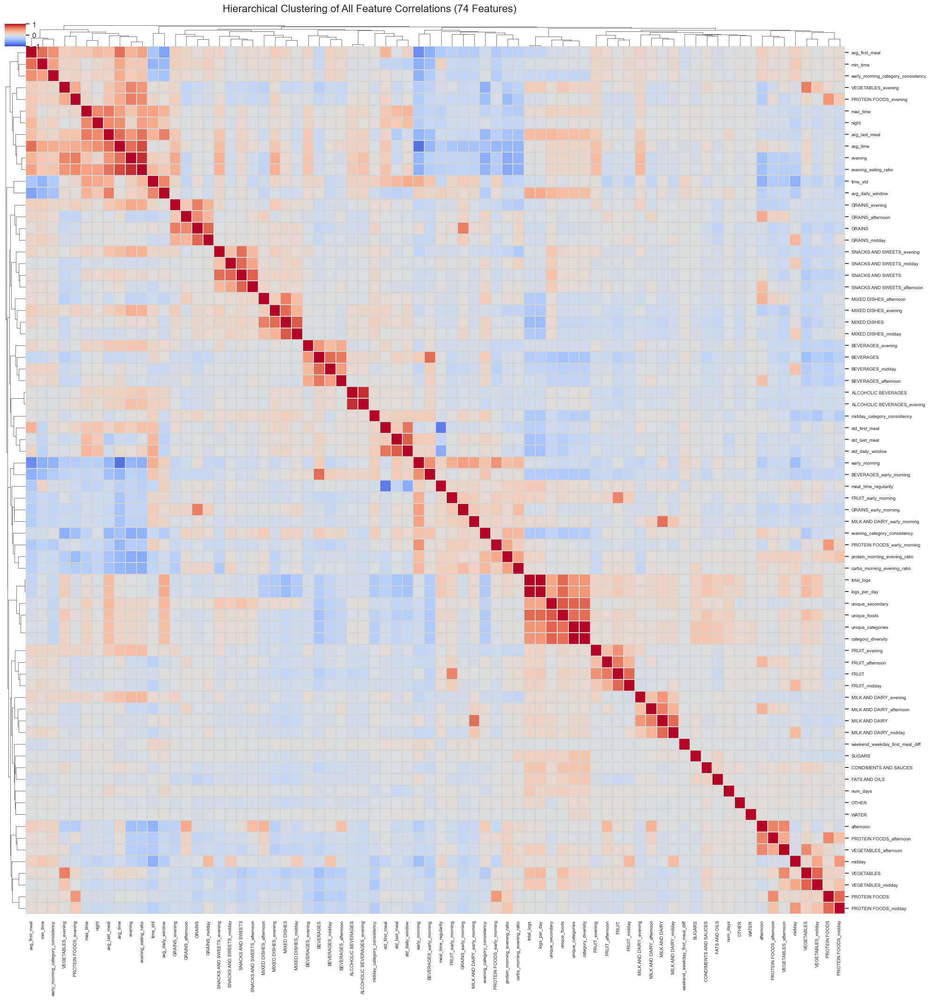

In [337]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# --- Assume user_features_no_pid is your DataFrame ---
# Example placeholder if you don't have it loaded:
# num_users = 100
# num_features = 74
# user_features_no_pid = pd.DataFrame(np.random.rand(num_users, num_features),
#                                    columns=[f'Feature_{i+1}' for i in range(num_features)])
# ----------------------------------------------------

# 1. Calculate the correlation matrix
corr_matrix = user_features_no_pid.corr()
print(f"Generating clustermap for {corr_matrix.shape[0]} features...")

# 2. Define Parameters
figure_width = 26       # Increase width significantly for x-axis labels
figure_height = 24      # Increase height significantly for y-axis labels
dendrogram_shrink_ratio = 0.025  # Fraction of figure size for dendrograms (default is ~0.2)
label_font_size = 7     # Start with a small font size for axis labels

# 3. Create the clustermap
# Use dendrogram_ratio to control the relative size of the dendrograms
g = sns.clustermap(
    corr_matrix,
    cmap='coolwarm',            # Color map for correlations
    vmin=-1, vmax=1,            # Ensure full correlation range is mapped
    figsize=(figure_width, figure_height), # Make the figure large
    linewidths=0.2,             # Optional: subtle lines between cells
    linecolor='lightgray',
    annot=False,                # Turn OFF heatmap cell annotations for clarity
    dendrogram_ratio=(dendrogram_shrink_ratio, dendrogram_shrink_ratio) # Make dendrograms smaller
)

# 4. Customize Appearance for Label Readability
plt.suptitle('Hierarchical Clustering of All Feature Correlations (74 Features)', y=1.01, fontsize=16) # Add a title slightly above

# Rotate X-axis labels for better fit and set font size
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90, fontsize=label_font_size)

# Ensure Y-axis labels are horizontal and set font size
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=label_font_size)

# Adjust layout slightly if needed (often clustermap handles it well)
# You might need to manually adjust margins if labels are cut off after rotation
plt.subplots_adjust(bottom=0.2, left=0.2) # Example: Increase bottom/left margin if needed

print("Displaying clustermap...")
plt.show()

In [236]:
# Calculate correlation matrix for all features
corr_matrix = user_features_no_pid.corr()

# Create list of all correlation pairs
corr_pairs = []
for i, row in enumerate(corr_matrix.index):
    for j, col in enumerate(corr_matrix.columns):
        # Skip self-correlations and duplicates (i < j ensures each pair is counted once)
        if i < j:
            corr_value = corr_matrix.loc[row, col]
            # You can filter out NaN correlations if needed
            if not pd.isna(corr_value):
                corr_pairs.append((row, col, corr_value, abs(corr_value)))

# Sort by absolute correlation value (strongest first)
corr_pairs.sort(key=lambda x: x[3], reverse=True)

# Get top N correlations (adjust N as needed)
top_n = 100
print(f"Top {top_n} Strongest Correlations:")
for i, (row, col, corr_value, _) in enumerate(corr_pairs[:top_n]):
    print(f"{i+1}. {row} & {col}: {corr_value:.3f}")

# Optional: Convert to DataFrame if you want to use the results later
top_corr_df = pd.DataFrame(
    [(row, col, corr_value) for row, col, corr_value, _ in corr_pairs[:top_n]],
    columns=['Feature 1', 'Feature 2', 'Correlation']
)

Top 100 Strongest Correlations:
1. unique_categories & category_diversity: 1.000
2. total_logs & logs_per_day: 0.994
3. evening & evening_eating_ratio: 0.920
4. ALCOHOLIC BEVERAGES & ALCOHOLIC BEVERAGES_evening: 0.909
5. avg_time & evening_eating_ratio: 0.825
6. avg_time & early_morning: -0.819
7. MIXED DISHES & MIXED DISHES_midday: 0.772
8. std_first_meal & meal_time_regularity: -0.771
9. unique_foods & unique_secondary: 0.768
10. std_last_meal & std_daily_window: 0.765
11. unique_secondary & category_diversity: 0.741
12. unique_categories & unique_secondary: 0.741
13. SNACKS AND SWEETS & SNACKS AND SWEETS_afternoon: 0.737
14. VEGETABLES & VEGETABLES_midday: 0.728
15. FRUIT & FRUIT_midday: 0.725
16. GRAINS & GRAINS_midday: 0.724
17. SNACKS AND SWEETS & SNACKS AND SWEETS_midday: 0.721
18. total_logs & unique_foods: 0.717
19. unique_foods & logs_per_day: 0.714
20. PROTEIN FOODS & PROTEIN FOODS_midday: 0.709
21. avg_time & avg_last_meal: 0.707
22. MIXED DISHES & MIXED DISHES_evening: 0.7

In [242]:
# Calculate correlation matrix for all features
corr_matrix = user_features_no_pid.corr()

# Get the column of interest
target_feature = 'BEVERAGES'

# Check if the feature exists in the dataset
if target_feature not in corr_matrix.columns:
    print(f"Feature '{target_feature}' not found in the dataset.")
else:
    # Get all correlations with ALCOHOLIC BEVERAGES
    alcohol_corrs = corr_matrix[target_feature]
    
    # Remove self-correlation (which is always 1.0)
    alcohol_corrs = alcohol_corrs.drop(target_feature, errors='ignore')
    
    # Get top positive correlations
    print(f"Top 15 Positive Correlations with {target_feature}:")
    top_positive = alcohol_corrs.sort_values(ascending=False).head(15)
    for feature, corr in top_positive.items():
        print(f"{feature}: {corr:.3f}")
    
    print("\n" + "-"*50 + "\n")
    
    # Get top negative correlations
    print(f"Top 15 Negative Correlations with {target_feature}:")
    top_negative = alcohol_corrs.sort_values(ascending=True).head(15)
    for feature, corr in top_negative.items():
        print(f"{feature}: {corr:.3f}")
    
    # Optionally, save all correlations to a DataFrame for further analysis
    all_alcohol_corrs = pd.DataFrame({
        'Feature': alcohol_corrs.index,
        'Correlation': alcohol_corrs.values
    }).sort_values('Correlation', ascending=False)
    
    # Optional: Filter for only meaningful correlations (e.g., abs > 0.2)
    meaningful_corrs = all_alcohol_corrs[all_alcohol_corrs['Correlation'].abs() > 0.2]
    print(f"\nFound {len(meaningful_corrs)} correlations with absolute value > 0.2")

Top 15 Positive Correlations with BEVERAGES:
BEVERAGES_midday: 0.705
BEVERAGES_early_morning: 0.700
BEVERAGES_afternoon: 0.655
BEVERAGES_evening: 0.513
evening_category_consistency: 0.202
early_morning: 0.175
std_last_meal: 0.155
std_daily_window: 0.112
time_std: 0.098
midday_category_consistency: 0.093
ALCOHOLIC BEVERAGES_evening: 0.090
ALCOHOLIC BEVERAGES: 0.086
weekend_weekday_first_meal_diff: 0.037
std_first_meal: 0.020
avg_daily_window: 0.017

--------------------------------------------------

Top 15 Negative Correlations with BEVERAGES:
VEGETABLES: -0.380
unique_foods: -0.359
unique_categories: -0.341
category_diversity: -0.341
PROTEIN FOODS: -0.329
unique_secondary: -0.306
VEGETABLES_midday: -0.278
logs_per_day: -0.272
total_logs: -0.268
FRUIT: -0.249
PROTEIN FOODS_midday: -0.245
VEGETABLES_evening: -0.243
VEGETABLES_afternoon: -0.207
CONDIMENTS AND SAUCES: -0.195
FRUIT_midday: -0.190

Found 18 correlations with absolute value > 0.2


In [217]:
# Preview key stats about our feature set
feature_summary = user_features_no_pid.describe().T.sort_values('mean', ascending=False)
display(feature_summary)

,count,mean,std,min,25%,50%,75%,max
total_logs,17409.0,155.776840,70.501630,9.000000,106.000000,143.000000,191.000000,8.280000e+02
unique_foods,17409.0,54.835487,22.113629,1.000000,40.000000,53.000000,68.000000,1.840000e+02
midday,17409.0,29.927590,9.310172,0.000000,23.913043,29.651163,35.714286,9.230769e+01
evening,17409.0,24.609257,10.767663,0.000000,17.543860,24.875622,31.632653,8.692308e+01
unique_secondary,17409.0,23.867023,5.673480,1.000000,20.000000,24.000000,28.000000,4.000000e+01
...,...,...,...,...,...,...,...,...
evening_eating_ratio,17409.0,0.273481,0.122069,0.000000,0.192661,0.275862,0.352941,9.806452e-01
WATER,17409.0,0.193568,1.096831,0.000000,0.000000,0.000000,0.000000,3.688525e+01
early_morning_category_consistency,17409.0,-0.323457,0.169919,-0.720238,-0.444444,-0.363095,-0.244898,1.480297e-16
evening_category_consistency,17409.0,-0.347928,0.115982,-0.762803,-0.422587,-0.358366,-0.291667,1.480297e-16


## Dimensionality Reduction

In [218]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Apply PCA for dimensionality reduction
pca = PCA(n_components=0.95)  # Retain 95% of variance
pca_result = pca.fit_transform(scaled_features)

print(f"PCA reduced dimensions from {scaled_features.shape[1]} to {pca_result.shape[1]}")
print(f"Explained variance ratio: {pca.explained_variance_ratio_}")
print(f"Cumulative explained variance: {pca.explained_variance_ratio_.cumsum()}")

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(
    pca_result,
    columns=[f'PC{i+1}' for i in range(pca_result.shape[1])]
)
pca_df['pid'] = pid_col



PCA reduced dimensions from 74 to 43
Explained variance ratio: [0.10851426 0.09526862 0.07186148 0.0561656  0.04864514 0.0432708
 0.04109436 0.0373242  0.031298   0.02973834 0.02631644 0.02490727
 0.02377997 0.02075335 0.01907325 0.01701464 0.01477524 0.01429184
 0.01349014 0.0132796  0.01270395 0.01215001 0.011723   0.01125738
 0.01078628 0.0105632  0.01024859 0.00974551 0.00944794 0.00918871
 0.00908388 0.00852037 0.00826133 0.00815344 0.00801374 0.00747636
 0.00716731 0.00707647 0.00695016 0.00680129 0.00652725 0.00633942
 0.00611347]
Cumulative explained variance: [0.10851426 0.20378288 0.27564436 0.33180996 0.3804551  0.4237259
 0.46482026 0.50214446 0.53344246 0.5631808  0.58949724 0.6144045
 0.63818448 0.65893783 0.67801108 0.69502572 0.70980096 0.7240928
 0.73758293 0.75086254 0.76356649 0.7757165  0.7874395  0.79869688
 0.80948316 0.82004637 0.83029496 0.84004047 0.84948841 0.85867712
 0.867761   0.87628136 0.88454269 0.89269614 0.90070988 0.90818624
 0.91535355 0.92243002 0.9

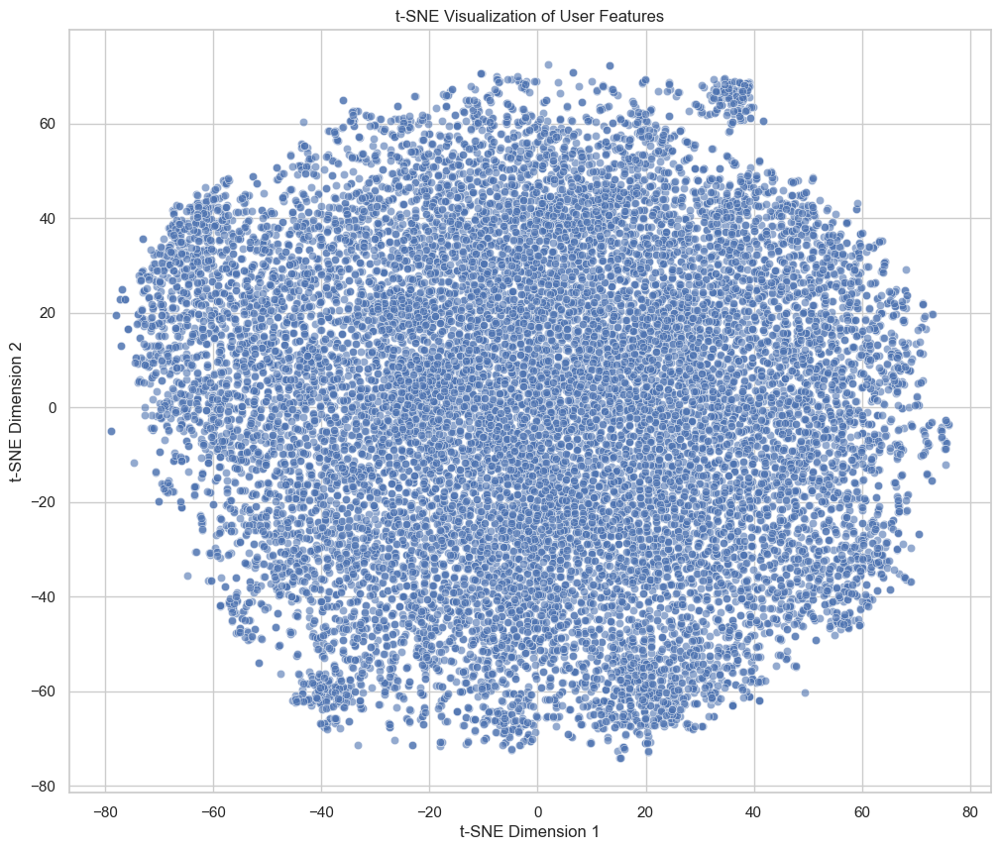

In [219]:
# t-SNE for visualization (only on a subset if dataset is large)
# t-SNE is computationally expensive for large datasets
sample_features = scaled_features
sample_pids = pid_col

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(sample_features)

# Create DataFrame with t-SNE results
tsne_df = pd.DataFrame(tsne_result, columns=['TSNE1', 'TSNE2'])
tsne_df['pid'] = sample_pids

# Visualize t-SNE
plt.figure(figsize=(12, 10))
sns.scatterplot(x='TSNE1', y='TSNE2', data=tsne_df, alpha=0.6)
plt.title('t-SNE Visualization of User Features')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

# Save dimensionality reduction results
pca_df.to_csv('pca_features.csv', index=False)
tsne_df.to_csv('tsne_visualization.csv', index=False)

# Clustering

## K-Means

K=2, Silhouette Score=0.0345
K=3, Silhouette Score=0.0330
K=4, Silhouette Score=0.0264
K=5, Silhouette Score=0.0256
K=6, Silhouette Score=0.0173
K=7, Silhouette Score=0.0155
K=8, Silhouette Score=0.0145
K=9, Silhouette Score=0.0109
K=10, Silhouette Score=0.0140
K=11, Silhouette Score=0.0104
K=12, Silhouette Score=0.0121
K=13, Silhouette Score=0.0069
K=14, Silhouette Score=0.0051
K=15, Silhouette Score=-0.0017


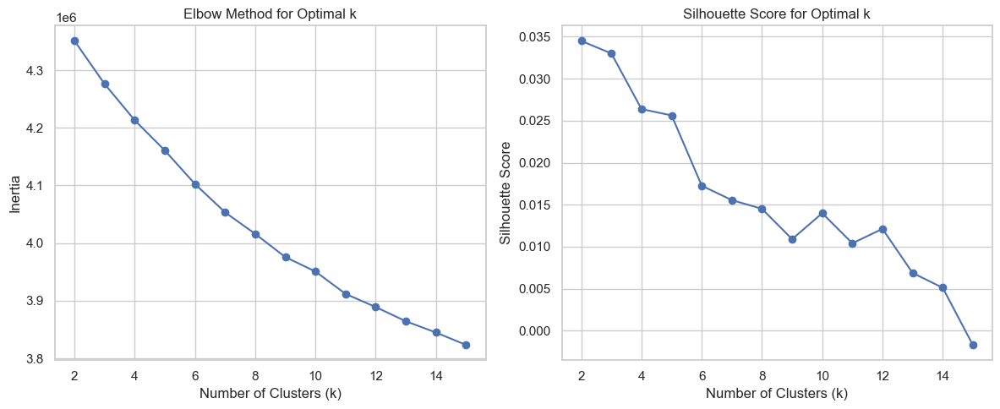

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Drop pid for clustering
X = pca_df.drop(columns=['pid'])

# Find optimal number of clusters using Elbow Method and Silhouette Score
max_clusters = 15
inertia_values = []
silhouette_scores = []

for k in range(2, max_clusters + 1):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X)
    inertia_values.append(kmeans.inertia_)
    
    # Calculate silhouette score
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(X, labels)
    silhouette_scores.append(silhouette_avg)
    print(f"K={k}, Silhouette Score={silhouette_avg:.4f}")

# Plot Elbow Method
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(2, max_clusters + 1), inertia_values, 'o-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.grid(True)

# Plot Silhouette Scores
plt.subplot(1, 2, 2)
plt.plot(range(2, max_clusters + 1), silhouette_scores, 'o-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal k')
plt.grid(True)
plt.tight_layout()
plt.show()


In [220]:
# Get optimal k from silhouette scores
optimal_k = 5

# Perform K-means with optimal K on the PCA features
X = pca_df.drop(columns=['pid'])
kmeans_optimal = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
cluster_labels = kmeans_optimal.fit_predict(X)

# Add cluster labels to PCA data (for reference)
pca_clustered = pca_df.copy()
pca_clustered['cluster'] = cluster_labels

# Now visualize the clusters on the t-SNE projection
# First, we need to map the cluster labels to the t-SNE points
# We need to match the PIDs in tsne_df to the cluster labels

# Merge tsne_df with cluster information
tsne_clustered = tsne_df.merge(
    pd.DataFrame({'pid': pca_clustered['pid'], 'cluster': pca_clustered['cluster']}),
    on='pid'
)

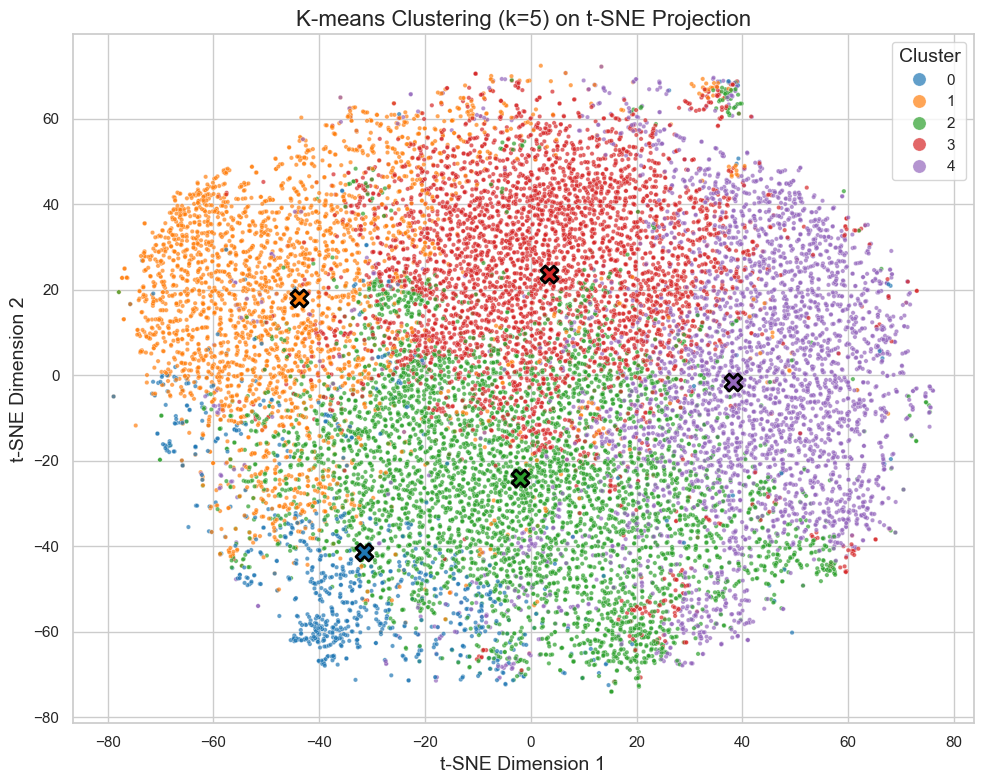

In [372]:
plt.figure(figsize=(10, 8))

# Get the colors directly from seaborn's color_palette
import seaborn as sns
colors = sns.color_palette("tab10", optimal_k)

# Plot the scatter points 
scatter = sns.scatterplot(
    x='TSNE1',
    y='TSNE2',
    hue='cluster',
    palette='tab10',
    data=tsne_clustered,
    alpha=0.7,
    s=10
)

# Add cluster centroids with matching colors
centroids_tsne = tsne_clustered.groupby('cluster')[['TSNE1', 'TSNE2']].mean().reset_index()
for i, row in centroids_tsne.iterrows():
    cluster_num = int(row['cluster'])
    plt.scatter(
        row['TSNE1'],
        row['TSNE2'],
        s=150,
        marker='X',
        color=[colors[cluster_num]],
        edgecolor='black',
        linewidth=2,
        zorder=5
    )

plt.title(f'K-means Clustering (k={optimal_k}) on t-SNE Projection', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

# Create a legend with only cluster colors and larger markers
legend = plt.legend(title='Cluster', title_fontsize=14, markerscale=3)

plt.tight_layout()
plt.show()

## Cluster Food Counts

In [550]:
cluster_food_df = food_df.merge(tsne_clustered[['pid', 'cluster']], on='pid', how='inner')

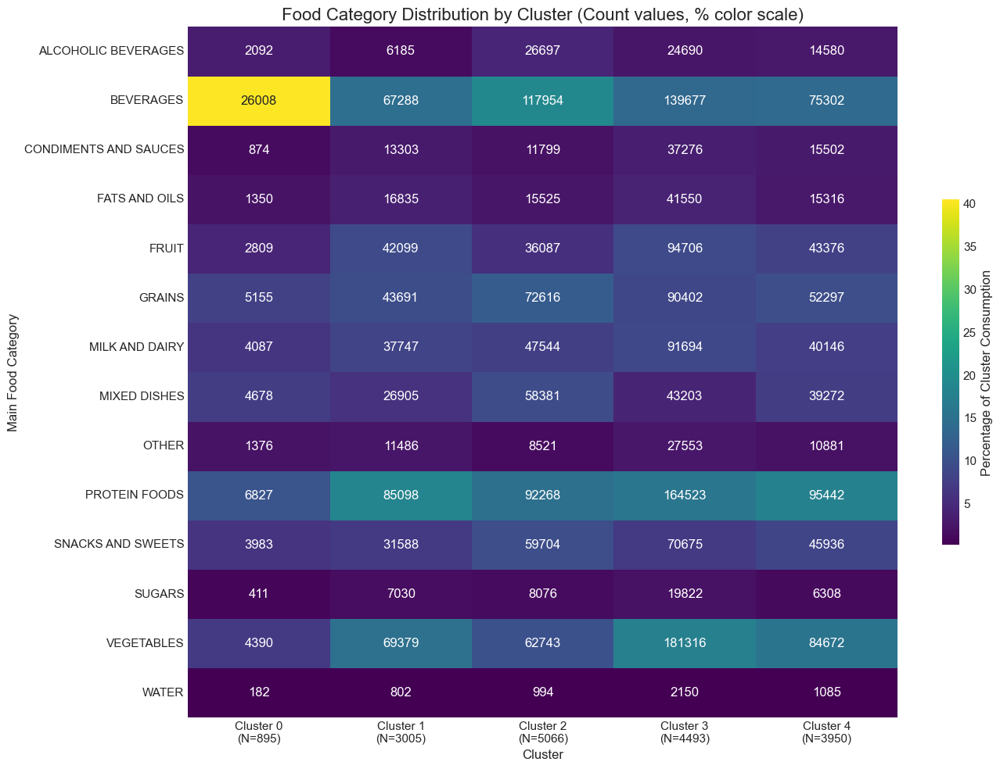

In [564]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Group by main_category and cluster and count occurrences
# Reverse the order of groupby to get main_category as the first level
category_counts = cluster_food_df.groupby(['main_category', 'cluster']).size().unstack(fill_value=0)

# Calculate the number of unique users (pid) in each cluster for the N value
cluster_user_counts = cluster_food_df.groupby('cluster')['pid'].nunique()

# Calculate percentages normalized by total consumption in each cluster
# Since clusters are now columns, we need to normalize by column sums
category_percentages = category_counts.div(category_counts.sum(axis=0), axis=1) * 100

# Create the heatmap with percentages determining color but showing count values
plt.figure(figsize=(14, 10))
ax = sns.heatmap(category_percentages, annot=category_counts, cmap='viridis', fmt='d', 
                 cbar_kws={'label': 'Percentage of Cluster Consumption', 'shrink' : 0.5})

# Add cluster N values to the column labels (x-axis)
col_labels = [f'Cluster {i}\n(N={cluster_user_counts[i]})' for i in category_percentages.columns]
ax.set_xticklabels(col_labels)

plt.title('Food Category Distribution by Cluster (Count values, % color scale)', fontsize=16)
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Main Food Category', fontsize=12)
plt.tight_layout()
# plt.savefig('food_cluster_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:

# Create a formatted table with both counts and percentages
table_data = pd.DataFrame()

for cluster in sorted(cluster_food_df['cluster'].unique()):
    # Get counts for this cluster
    counts = cluster_food_df[cluster_food_df['cluster'] == cluster]['main_category'].value_counts()
    # Calculate percentages within the cluster
    percentages = counts / counts.sum() * 100
    # Combine counts and percentages in a formatted string
    table_data[f'Cluster {cluster}\n(N={cluster_user_counts[cluster]})'] = counts.index.map(
        lambda cat: f"{counts.get(cat, 0)} ({percentages.get(cat, 0):.1f}%)")

# Sort the table by the main categories for better readability
all_categories = sorted(cluster_food_df['main_category'].unique())
table_data = table_data.reindex(all_categories)

# Display the table
print("\nFood Category Distribution by Cluster (Count and Percentage)")
print(table_data)

# Save the table to CSV
table_data.to_csv('food_cluster_distribution.csv')

# Create an alternative visualization: a stacked bar chart
plt.figure(figsize=(14, 10))
category_percentages.plot(kind='bar', stacked=False, colormap='tab20')
plt.title('Food Category Composition by Cluster', fontsize=16)
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Percentage of Cluster Consumption', fontsize=12)
plt.legend(title='Food Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(range(len(new_col_labels)), new_col_labels)
plt.tight_layout()
plt.savefig('food_cluster_distribution_bar.png', dpi=300, bbox_inches='tight')
plt.show()

In [541]:
feature_df = user_features.merge(tsne_clustered[['pid', 'cluster']], on='pid', how='inner')
feature_df

,pid,total_logs,avg_time,min_time,max_time,time_std,unique_foods,unique_categories,unique_secondary,num_days,logs_per_day,afternoon,early_morning,evening,midday,night,ALCOHOLIC BEVERAGES,BEVERAGES,CONDIMENTS AND SAUCES,FATS AND OILS,FRUIT,GRAINS,MILK AND DAIRY,MIXED DISHES,OTHER,PROTEIN FOODS,SNACKS AND SWEETS,SUGARS,VEGETABLES,WATER,category_diversity,BEVERAGES_early_morning,PROTEIN FOODS_midday,VEGETABLES_evening,VEGETABLES_midday,BEVERAGES_midday,PROTEIN FOODS_evening,PROTEIN FOODS_afternoon,VEGETABLES_afternoon,GRAINS_midday,BEVERAGES_afternoon,PROTEIN FOODS_early_morning,FRUIT_midday,MILK AND DAIRY_midday,SNACKS AND SWEETS_evening,SNACKS AND SWEETS_afternoon,GRAINS_early_morning,MILK AND DAIRY_early_morning,GRAINS_evening,MIXED DISHES_evening,MIXED DISHES_midday,SNACKS AND SWEETS_midday,FRUIT_afternoon,FRUIT_early_morning,GRAINS_afternoon,BEVERAGES_evening,MILK AND DAIRY_afternoon,ALCOHOLIC BEVERAGES_evening,MIXED DISHES_afternoon,MILK AND DAIRY_evening,FRUIT_evening,avg_first_meal,avg_last_meal,std_first_meal,std_last_meal,avg_daily_window,std_daily_window,meal_time_regularity,protein_morning_evening_ratio,carbs_morning_evening_ratio,evening_eating_ratio,weekend_weekday_first_meal_diff,early_morning_category_consistency,midday_category_consistency,evening_category_consistency,cluster
0,alqt150211047,255,13.522499,8.256944,21.013056,2.870070,77,13,30,14,18.214286,45.882353,10.588235,3.529412,40.000000,0.000000,0.392157,9.019608,2.352941,0.784314,9.019608,16.862745,16.470588,2.745098,7.450980,12.549020,7.450980,0.784314,14.117647,0.000000,13,1.960784,4.705882,0.000000,6.274510,3.529412,0.392157,7.058824,5.882353,7.058824,3.137255,0.392157,4.313725,7.058824,0.000000,4.705882,2.352941,2.745098,0.000000,0.392157,0.784314,2.352941,3.529412,0.784314,7.450980,0.392157,6.274510,0.392157,1.568627,0.392157,0.392157,9.979444,17.569544,0.754586,1.626780,7.590099,1.610175,1.170157,13.000000,31.000000,0.035294,0.223319,0.328042,0.361854,0.097222,1
1,alqt150211119,93,13.553707,7.633333,21.050000,4.421242,48,12,28,13,7.153846,11.827957,26.881720,26.881720,34.408602,0.000000,2.150538,6.451613,1.075269,2.150538,1.075269,16.129032,11.827957,9.677419,4.301075,17.204301,7.526882,0.000000,20.430108,0.000000,12,4.301075,8.602151,7.526882,8.602151,2.150538,5.376344,0.000000,2.150538,5.376344,0.000000,3.225806,0.000000,2.150538,0.000000,2.150538,2.150538,5.376344,5.376344,3.225806,4.301075,1.075269,0.000000,1.075269,3.225806,0.000000,1.075269,2.150538,1.075269,3.225806,0.000000,8.133761,18.067949,0.374458,3.711578,9.934188,3.819659,2.107670,2.200000,2.400000,0.268817,0.498920,0.300000,0.409722,0.220000,2
2,alqt150211143,115,10.682174,7.166667,16.716667,3.058861,38,9,19,14,8.214286,20.869565,51.304348,0.000000,27.826087,0.000000,0.000000,5.217391,0.000000,0.869565,9.565217,9.565217,3.478261,2.608696,0.000000,31.304348,13.913043,0.000000,23.478261,0.000000,9,5.217391,7.826087,0.000000,6.956522,0.000000,0.000000,4.347826,6.956522,3.478261,0.000000,19.130435,2.608696,0.869565,0.000000,4.347826,4.347826,0.869565,0.000000,0.000000,0.869565,4.347826,0.000000,6.956522,1.739130,0.000000,1.739130,0.000000,1.739130,0.000000,0.000000,7.633333,13.829762,0.373823,2.688398,6.196429,2.873160,2.110493,31.000000,20.000000,0.000000,0.560000,0.372881,0.406250,1.000000,1
3,alqt150211144,94,14.156475,6.266667,21.483333,4.939310,33,10,25,14,6.714286,12.765957,22.340426,32.978723,31.914894,0.000000,1.063830,13.829787,1.063830,0.000000,8.510638,21.276596,21.276596,14.893617,0.000000,8.510638,8.510638,0.000000,1.063830,0.000000,10,8.510638,3.191489,1.063830,0.000000,3.191489,5.319149,0.000000,0.000000,6.382979,2.127660,0.000000,1.063830,5.319149,2.127660,3.191489,3.191489,6.382979,10.638298,4.255319,8.510638,3.191489,4.255319,2.127660,1.063830,0.000000,2.127660,1.063830,0.000000,7.446809,1.063830,8.045278,18.788968,2.113869,2.748569,10.743690,3.590483,0.451698,0.600000,1.000000,0.329787,2.085028,0.304762,0.333333,0.431452,2
4,alqt150211157,113,12.388100,4.000000,27.989167

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


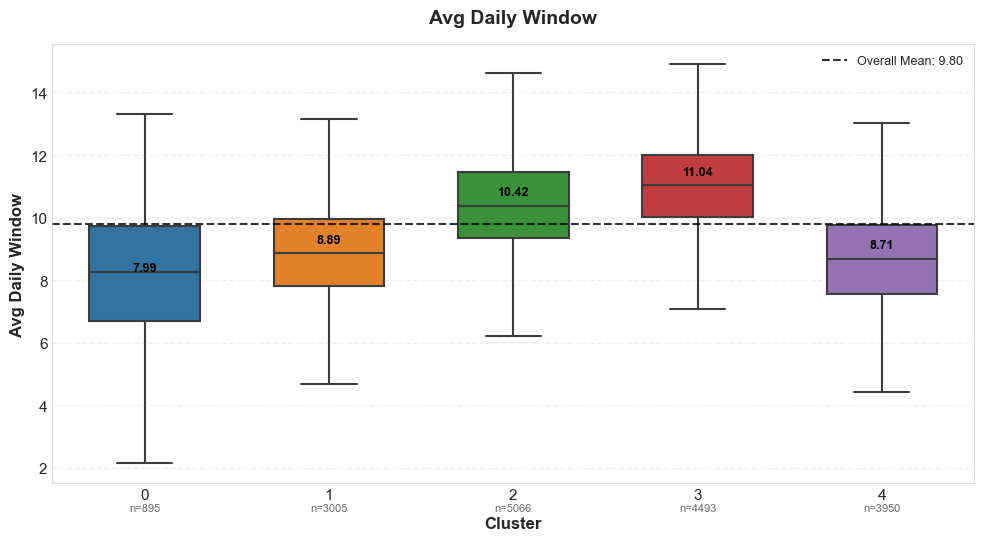

In [542]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
import numpy as np

def create_cluster_box_plot(df, feature, title=None, save=False, filename=None, figsize=(10, 6)):
    """
    Create a clean, aesthetic box plot for a single feature across clusters.
    
    Parameters:
    -----------
    df : DataFrame
        DataFrame containing the data with 'cluster' column
    feature : str
        Column name to plot
    title : str, optional
        Plot title (defaults to formatted feature name)
    save : bool, optional
        Whether to save the figure to file (default: False)
    filename : str, optional
        Filename to save the plot (defaults to formatted feature name)
    figsize : tuple, optional
        Figure size (width, height) in inches
    """
    # Get number of clusters for consistent colors
    n_clusters = df['cluster'].nunique()
    cluster_ids = sorted(df['cluster'].unique())
    
    # Use tab10 color palette to match TSNE plots
    colors = sns.color_palette("tab10", n_clusters)
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    
    # Set style for a clean, scientific look
    plt.style.use('seaborn-v0_8-whitegrid')
    
    # Create boxplot with tab10 colors
    boxplot = sns.boxplot(
        x='cluster',
        y=feature,
        data=df,
        palette="tab10",  # Changed to tab10
        width=0.6,
        linewidth=1.5,
        showfliers=False,  # Hide outliers for cleaner look
        ax=ax
    )
    
    # Better formatting for box edges and lines
    for i, box in enumerate(boxplot.artists):
        box.set_edgecolor('black')
        box.set_alpha(0.7)
        
        # Also change the color of the median lines
        for line in boxplot.lines[i*6:(i+1)*6]:
            line.set_color('black')
            line.set_linewidth(1.5)
    
    # Set title if provided, otherwise use feature name
    if title is None:
        title = feature.replace('_', ' ').title()
    ax.set_title(title, fontsize=14, fontweight='bold', pad=15)
    
    # Set y-axis label with better formatting
    ax.set_ylabel(feature.replace('_', ' ').title(), fontsize=12, fontweight='bold')
    
    # Add horizontal line at mean value across all clusters with improved styling
    mean_val = df[feature].mean()
    ax.axhline(mean_val, ls='--', color='black', alpha=0.8, 
               linewidth=1.5, label=f'Overall Mean: {mean_val:.2f}')
    
    # Annotate each cluster's mean with improved formatting
    for j, cluster_id in enumerate(cluster_ids):
        cluster_data = df[df['cluster'] == cluster_id][feature]
        cluster_mean = cluster_data.mean()
        
        # Add mean value annotation
        ax.annotate(
            f"{cluster_mean:.2f}",
            xy=(j, cluster_mean),
            xytext=(0, 7),
            textcoords="offset points",
            ha='center',
            fontsize=9,
            fontweight='bold',
            color='black'
        )
        
        # Add sample size annotation below x-axis
        ax.annotate(
            f"n={len(cluster_data)}",
            xy=(j, ax.get_ylim()[0]),
            xytext=(0, -20),  # Moved closer to the x-axis
            textcoords="offset points",
            ha='center',
            fontsize=8,
            color='dimgray'
        )
    
    # Add x-axis label with proper spacing to avoid overlap with annotations
    ax.set_xlabel("Cluster", fontsize=12, fontweight='bold', labelpad=10)
    
    # Add subtle grid lines only on the y-axis
    ax.yaxis.grid(True, linestyle='--', alpha=0.3)
    ax.xaxis.grid(False)
    
    # Add a light border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
    
    # Adjust layout with more bottom margin
    plt.tight_layout(rect=[0, 0.05, 1, 0.98])  # Add more space at the bottom
    
    # Legend for mean line
    ax.legend(loc='upper right', framealpha=0.9, fontsize=9)
    
    # Save if requested
    if save:
        if filename is None:
            filename = feature.replace(' ', '_').lower()
        
        save_path = f"presentation_figures/kmeans_box_plots/{filename}.png"
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.close()
        print(f"Saved {save_path}")
    else:
        # If not saving, show the plot in the notebook
        plt.show()

# Example usage:
# feature = "avg_daily_window"
# create_cluster_box_plot(feature_df, feature)

# Example usage:
feature = "avg_daily_window"
create_cluster_box_plot(feature_df, feature)

In [ ]:
# ==============================================
# EXAMPLE USAGE
# ==============================================

# Time-related features
time_features = [
    'avg_first_meal', 
    'avg_last_meal', 
    'avg_daily_window', 
    'meal_time_regularity'
]

# Distribution features
distribution_features = [
    'early_morning', 
    'midday', 
    'afternoon', 
    'evening', 
    'night'
]

# Food category features
food_features = [
    'PROTEIN FOODS', 
    'VEGETABLES', 
    'FRUIT', 
    'GRAINS', 
    'SNACKS AND SWEETS', 
    'BEVERAGES'
]

# Pattern features
pattern_features = [
    'protein_morning_evening_ratio', 
    'carbs_morning_evening_ratio',
    'evening_eating_ratio', 
    'early_morning_category_consistency', 
    'midday_category_consistency', 
    'evening_category_consistency'
]

# Create individual plots for each feature
for feature in time_features:
    create_cluster_box_plot(
        feature_df,  # Using your feature_df that has the cluster column
        feature, 
        save=True
    )

for feature in distribution_features:
    create_cluster_box_plot(
        feature_df, 
        feature,
        save=True
    )

for feature in food_features:
    feature_safe = feature.replace(' ', '_')
    create_cluster_box_plot(
        feature_df, 
        feature, 
        save=True
    )

for feature in pattern_features:
    create_cluster_box_plot(
        feature_df, 
        feature, 
        save=True
    )

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


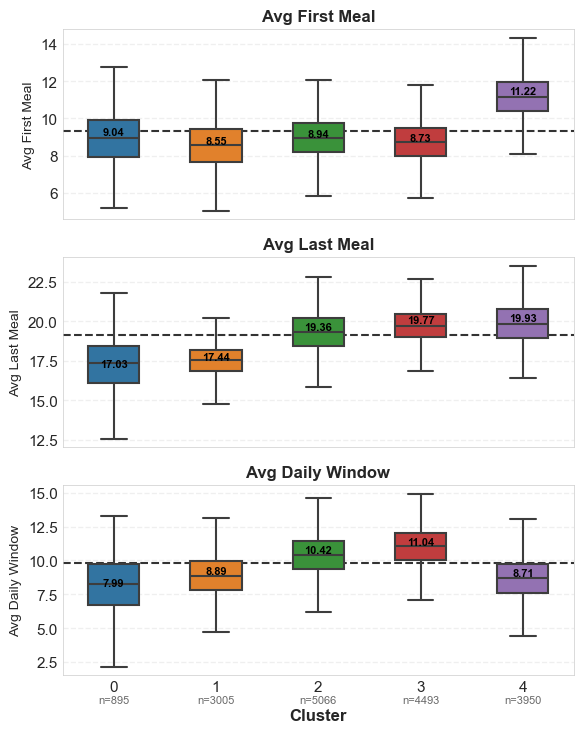

In [417]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
import numpy as np

def create_grouped_box_plots(df, features, title=None, save=False, filename=None, figsize=(6, 8)):
    """
    Create box plots for multiple features across clusters with a shared x-axis.
    
    Parameters:
    -----------
    df : DataFrame
        DataFrame containing the data with 'cluster' column
    features : list
        List of column names to plot
    title : str, optional
        Plot title (defaults to a generic title)
    save : bool, optional
        Whether to save the figure to file (default: False)
    filename : str, optional
        Filename to save the plot (defaults to formatted title)
    figsize : tuple, optional
        Figure size (width, height) in inches
    """
    # Get number of clusters for consistent colors
    n_clusters = df['cluster'].nunique()
    cluster_ids = sorted(df['cluster'].unique())
    
    # Create a figure with subplots - one for each feature
    n_features = len(features)
    fig, axes = plt.subplots(n_features, 1, figsize=figsize, sharex=True)
    
    # Use tab10 color palette to match TSNE plots
    colors = sns.color_palette("tab10", n_clusters)
    
    # Ensure axes is always a list even with one feature
    if n_features == 1:
        axes = [axes]
    
    # Set style for a clean, scientific look
    plt.style.use('seaborn-v0_8-whitegrid')
    
    # Create a boxplot for each feature
    for i, (feature, ax) in enumerate(zip(features, axes)):
        # Create boxplot for this feature
        boxplot = sns.boxplot(
            x='cluster',
            y=feature,
            data=df,
            palette="tab10",
            width=0.5,
            linewidth=1.5,
            showfliers=False,
            ax=ax
        )
        
        # Better formatting for box edges and lines
        for j, box in enumerate(boxplot.artists):
            box.set_edgecolor('black')
            box.set_alpha(0.7)
            
            # Also change the color of the median lines
            for line in boxplot.lines[j*6:(j+1)*6]:
                line.set_color('black')
                line.set_linewidth(1.5)
        
        # Set feature name as subtitle
        ax.set_title(feature.replace('_', ' ').title(), fontsize=12, fontweight='bold')
        
        # Set y-axis label with better formatting
        ax.set_ylabel(feature.replace('_', ' ').title(), fontsize=10)
        
        # Add horizontal line at mean value across all clusters
        mean_val = df[feature].mean()
        ax.axhline(mean_val, ls='--', color='black', alpha=0.8, linewidth=1.5, zorder=0)
        
        # Annotate each cluster's mean
        for j, cluster_id in enumerate(cluster_ids):
            cluster_data = df[df['cluster'] == cluster_id][feature]
            cluster_mean = cluster_data.mean()
            
            # Add mean value annotation
            ax.annotate(
                f"{cluster_mean:.2f}",
                xy=(j, cluster_mean),
                xytext=(0, 1),
                textcoords="offset points",
                ha='center',
                fontsize=8,
                fontweight='bold',
                color='black'
            )
            
            # Add sample size annotation below x-axis (only for the last feature)
            if i == n_features - 1:
                ax.annotate(
                    f"n={len(cluster_data)}",
                    xy=(j, ax.get_ylim()[0]),
                    xytext=(0, -20),
                    textcoords="offset points",
                    ha='center',
                    fontsize=8,
                    color='dimgray'
                )
        
        # Add subtle grid lines only on the y-axis
        ax.yaxis.grid(True, linestyle='--', alpha=0.3)
        ax.xaxis.grid(False)
        
        # Add a light border
        for spine in ax.spines.values():
            spine.set_linewidth(0.5)
    
    # Only show x-axis label on the bottom subplot
    axes[-1].set_xlabel("Cluster", fontsize=12, fontweight='bold', labelpad=10)
    
    # Hide x labels and ticks for all but the last subplot
    for ax in axes[:-1]:
        ax.set_xlabel('')
        
    # Set overall title for the plot
    if title is None:
        title = "Feature Comparison Across Clusters"
    fig.suptitle(title, fontsize=14, fontweight='bold', y=0.98)
    
    # # Add an annotation for the overall mean line
    # fig.text(0.99, 0.01, "Dashed line: Overall Mean", 
    #          ha='right', va='bottom', fontsize=8, style='italic')
    
    # Adjust spacing between subplots
    plt.tight_layout(rect=[0, 0.03, 1, 0.99])  # Make room for title
    plt.subplots_adjust(hspace=0.2)  # Add more space between subplots
    
    # Save if requested
    if save:
        if filename is None:
            filename = title.lower().replace(' ', '_')
        
        save_path = f"presentation_figures/kmeans_box_plots/{filename}.png"
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.close()
        print(f"Saved {save_path}")
    else:
        # If not saving, show the plot in the notebook
        plt.show()

# Example usage with time-related features:
time_features = [
    'avg_first_meal', 
    'avg_last_meal', 
    'avg_daily_window'
]

create_grouped_box_plots(feature_df, time_features, "Meal Timing Patterns")

In [432]:
feature_df['midday_category_consistency'].describe()

count    17409.000000
mean        -0.372936
std          0.096732
min         -0.699708
25%         -0.435606
50%         -0.376812
75%         -0.316667
max          0.000000
Name: midday_category_consistency, dtype: float64

In [451]:
feature_df

,pid,total_logs,avg_time,min_time,max_time,time_std,unique_foods,unique_categories,unique_secondary,num_days,logs_per_day,afternoon,early_morning,evening,midday,night,ALCOHOLIC BEVERAGES,BEVERAGES,CONDIMENTS AND SAUCES,FATS AND OILS,FRUIT,GRAINS,MILK AND DAIRY,MIXED DISHES,OTHER,PROTEIN FOODS,SNACKS AND SWEETS,SUGARS,VEGETABLES,WATER,category_diversity,BEVERAGES_early_morning,PROTEIN FOODS_midday,VEGETABLES_evening,VEGETABLES_midday,BEVERAGES_midday,PROTEIN FOODS_evening,PROTEIN FOODS_afternoon,VEGETABLES_afternoon,GRAINS_midday,BEVERAGES_afternoon,PROTEIN FOODS_early_morning,FRUIT_midday,MILK AND DAIRY_midday,SNACKS AND SWEETS_evening,SNACKS AND SWEETS_afternoon,GRAINS_early_morning,MILK AND DAIRY_early_morning,GRAINS_evening,MIXED DISHES_evening,MIXED DISHES_midday,SNACKS AND SWEETS_midday,FRUIT_afternoon,FRUIT_early_morning,GRAINS_afternoon,BEVERAGES_evening,MILK AND DAIRY_afternoon,ALCOHOLIC BEVERAGES_evening,MIXED DISHES_afternoon,MILK AND DAIRY_evening,FRUIT_evening,avg_first_meal,avg_last_meal,std_first_meal,std_last_meal,avg_daily_window,std_daily_window,meal_time_regularity,protein_morning_evening_ratio,carbs_morning_evening_ratio,evening_eating_ratio,weekend_weekday_first_meal_diff,early_morning_category_consistency,midday_category_consistency,evening_category_consistency,cluster
0,alqt150211047,255,13.522499,8.256944,21.013056,2.870070,77,13,30,14,18.214286,45.882353,10.588235,3.529412,40.000000,0.000000,0.392157,9.019608,2.352941,0.784314,9.019608,16.862745,16.470588,2.745098,7.450980,12.549020,7.450980,0.784314,14.117647,0.000000,13,1.960784,4.705882,0.000000,6.274510,3.529412,0.392157,7.058824,5.882353,7.058824,3.137255,0.392157,4.313725,7.058824,0.000000,4.705882,2.352941,2.745098,0.000000,0.392157,0.784314,2.352941,3.529412,0.784314,7.450980,0.392157,6.274510,0.392157,1.568627,0.392157,0.392157,9.979444,17.569544,0.754586,1.626780,7.590099,1.610175,1.170157,13.000000,31.000000,0.035294,0.223319,0.328042,0.361854,0.097222,1
1,alqt150211119,93,13.553707,7.633333,21.050000,4.421242,48,12,28,13,7.153846,11.827957,26.881720,26.881720,34.408602,0.000000,2.150538,6.451613,1.075269,2.150538,1.075269,16.129032,11.827957,9.677419,4.301075,17.204301,7.526882,0.000000,20.430108,0.000000,12,4.301075,8.602151,7.526882,8.602151,2.150538,5.376344,0.000000,2.150538,5.376344,0.000000,3.225806,0.000000,2.150538,0.000000,2.150538,2.150538,5.376344,5.376344,3.225806,4.301075,1.075269,0.000000,1.075269,3.225806,0.000000,1.075269,2.150538,1.075269,3.225806,0.000000,8.133761,18.067949,0.374458,3.711578,9.934188,3.819659,2.107670,2.200000,2.400000,0.268817,0.498920,0.300000,0.409722,0.220000,2
2,alqt150211143,115,10.682174,7.166667,16.716667,3.058861,38,9,19,14,8.214286,20.869565,51.304348,0.000000,27.826087,0.000000,0.000000,5.217391,0.000000,0.869565,9.565217,9.565217,3.478261,2.608696,0.000000,31.304348,13.913043,0.000000,23.478261,0.000000,9,5.217391,7.826087,0.000000,6.956522,0.000000,0.000000,4.347826,6.956522,3.478261,0.000000,19.130435,2.608696,0.869565,0.000000,4.347826,4.347826,0.869565,0.000000,0.000000,0.869565,4.347826,0.000000,6.956522,1.739130,0.000000,1.739130,0.000000,1.739130,0.000000,0.000000,7.633333,13.829762,0.373823,2.688398,6.196429,2.873160,2.110493,31.000000,20.000000,0.000000,0.560000,0.372881,0.406250,0.000000,1
3,alqt150211144,94,14.156475,6.266667,21.483333,4.939310,33,10,25,14,6.714286,12.765957,22.340426,32.978723,31.914894,0.000000,1.063830,13.829787,1.063830,0.000000,8.510638,21.276596,21.276596,14.893617,0.000000,8.510638,8.510638,0.000000,1.063830,0.000000,10,8.510638,3.191489,1.063830,0.000000,3.191489,5.319149,0.000000,0.000000,6.382979,2.127660,0.000000,1.063830,5.319149,2.127660,3.191489,3.191489,6.382979,10.638298,4.255319,8.510638,3.191489,4.255319,2.127660,1.063830,0.000000,2.127660,1.063830,0.000000,7.446809,1.063830,8.045278,18.788968,2.113869,2.748569,10.743690,3.590483,0.451698,0.600000,1.000000,0.329787,2.085028,0.304762,0.333333,0.431452,2
4,alqt150211157,113,12.388100,4.000000,27.989167

In [450]:
# Time-related features (2 plots)
time_features_1 = ['avg_first_meal', 'avg_last_meal', 'avg_daily_window']
time_features_2 = ['meal_time_regularity']

# Distribution features (2 plots)
distribution_features_1 = ['early_morning', 'midday', 'afternoon']
distribution_features_2 = ['evening', 'night']

# Food category features (2 plots)
food_features_1 = ['PROTEIN FOODS', 'VEGETABLES', 'FRUIT']
food_features_2 = ['GRAINS', 'SNACKS AND SWEETS', 'SUGARS']


# Pattern features (2 plots)
pattern_features_1 = ['protein_morning_evening_ratio', 'carbs_morning_evening_ratio', 'evening_eating_ratio']
pattern_features_2 = ['early_morning_category_consistency', 'midday_category_consistency', 'evening_category_consistency']

# Use your existing function with these feature groups and save the plots
create_grouped_box_plots(feature_df, time_features_1, "Meal Timing", save=True, filename="meal_timing")
create_grouped_box_plots(feature_df, time_features_2, "Meal Regularity", save=True, filename="meal_regularity")

create_grouped_box_plots(feature_df, distribution_features_1, "Morning & Midday Eating", save=True, filename="morning_midday_eating")
create_grouped_box_plots(feature_df, distribution_features_2, "Evening & Night Eating", save=True, filename="evening_night_eating")

create_grouped_box_plots(feature_df, food_features_1, "Protein & Produce Consumption", save=True, filename="protein_produce_consumption")
create_grouped_box_plots(feature_df, food_features_2, "Carbs & Sugars Consumption", save=True, filename="carbs_sugars_consumption")

create_grouped_box_plots(feature_df, pattern_features_1, "Macronutrient Ratios", save=True, filename="macronutrient_ratios")
create_grouped_box_plots(feature_df, pattern_features_2, "Meal Category Consistency", save=True, filename="meal_category_consistency")

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/meal_timing.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/meal_regularity.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/morning_midday_eating.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/evening_night_eating.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/protein_produce_consumption.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/carbs_beverages_consumption.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/macronutrient_ratios.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/meal_category_consistency.png


In [543]:

create_grouped_box_plots(feature_df, pattern_features_2, "Meal Category Consistency", save=True, filename="meal_category_consistency")

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/meal_category_consistency.png


In [455]:
food_features_2 = ['GRAINS', 'SNACKS AND SWEETS', 'SUGARS']

create_grouped_box_plots(feature_df, food_features_2, "Carbs & Sugars Consumption", save=True, filename="carbs_sugars_consumption")

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/carbs_sugars_consumption.png


In [454]:
food_features_3 = ['BEVERAGES', 'ALCOHOLIC BEVERAGES', 'MIXED DISHES']

create_grouped_box_plots(feature_df, food_features_3, "Beverages & Mixed Dishes", save=True, filename="beverages_dishes_consumption")

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/beverages_dishes_consumption.png


In [493]:
overview_features = ['logs_per_day', 'unique_categories', 'unique_foods']

create_grouped_box_plots(feature_df, overview_features, "Logging Overview", save=True, filename="logging_overview")

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/769743934.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/logging_overview.png


In [387]:
feature = "avg_daily_window"

create_cluster_box_plot(
        feature_df,  # Using your feature_df that has the cluster column
        feature, 
        title=f"{feature.replace('_', ' ').title()} by Cluster", 
        filename=f"{feature.lower().replace(' ', '_')}"
    )

Created avg_daily_window.png


In [398]:
# ==============================================
# EXAMPLE USAGE
# ==============================================

# Time-related features
time_features = [
    'avg_first_meal', 
    'avg_last_meal', 
    'avg_daily_window', 
    'meal_time_regularity'
]

# Distribution features
distribution_features = [
    'early_morning', 
    'midday', 
    'afternoon', 
    'evening', 
    'night'
]

# Food category features
food_features = [
    'PROTEIN FOODS', 
    'VEGETABLES', 
    'FRUIT', 
    'GRAINS', 
    'SNACKS AND SWEETS', 
    'BEVERAGES'
]

# Pattern features
pattern_features = [
    'protein_morning_evening_ratio', 
    'carbs_morning_evening_ratio',
    'evening_eating_ratio', 
    'early_morning_category_consistency', 
    'midday_category_consistency', 
    'evening_category_consistency'
]

# Create individual plots for each feature
for feature in time_features:
    create_cluster_box_plot(
        feature_df,  # Using your feature_df that has the cluster column
        feature, 
        save=True
    )

for feature in distribution_features:
    create_cluster_box_plot(
        feature_df, 
        feature,
        save=True
    )

for feature in food_features:
    feature_safe = feature.replace(' ', '_')
    create_cluster_box_plot(
        feature_df, 
        feature, 
        save=True
    )

for feature in pattern_features:
    create_cluster_box_plot(
        feature_df, 
        feature, 
        save=True
    )

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/avg_first_meal.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/avg_last_meal.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/avg_daily_window.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/meal_time_regularity.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/early_morning.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/midday.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/afternoon.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/evening.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/night.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/protein_foods.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/vegetables.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/fruit.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/grains.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/snacks_and_sweets.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/beverages.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/protein_morning_evening_ratio.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/carbs_morning_evening_ratio.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/evening_eating_ratio.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/early_morning_category_consistency.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/midday_category_consistency.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


Saved presentation_figures/kmeans_box_plots/evening_category_consistency.png


In [ ]:



# Time of Day Distribution
time_features = ['early_morning', 'midday', 'afternoon', 'evening', 'night']
create_cluster_box_plots(
    user_features, 
    time_features, 
    "Time of Day Eating Distribution Across Clusters", 
    "time_of_day_patterns",
    figsize=(14, 12)
)

# Food Category Preferences
food_features = ['PROTEIN FOODS', 'VEGETABLES', 'FRUIT', 'GRAINS', 'SNACKS AND SWEETS', 'BEVERAGES']
create_cluster_box_plots(
    user_features, 
    food_features, 
    "Food Category Preferences Across Clusters", 
    "food_category_preferences",
    figsize=(14, 14)
)

# Eating Pattern Consistency
consistency_features = [
    'protein_morning_evening_ratio', 
    'carbs_morning_evening_ratio',
    'evening_eating_ratio', 
    'early_morning_category_consistency', 
    'midday_category_consistency', 
    'evening_category_consistency'
]
create_cluster_box_plots(
    user_features, 
    consistency_features, 
    "Eating Pattern Consistency Across Clusters", 
    "eating_pattern_consistency",
    figsize=(14, 16)
)

# Logging Behavior
logging_features = ['total_logs', 'logs_per_day', 'unique_foods', 'unique_categories']
create_cluster_box_plots(
    user_features, 
    logging_features, 
    "Logging Behavior Across Clusters", 
    "logging_behavior"
)


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/3356686923.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


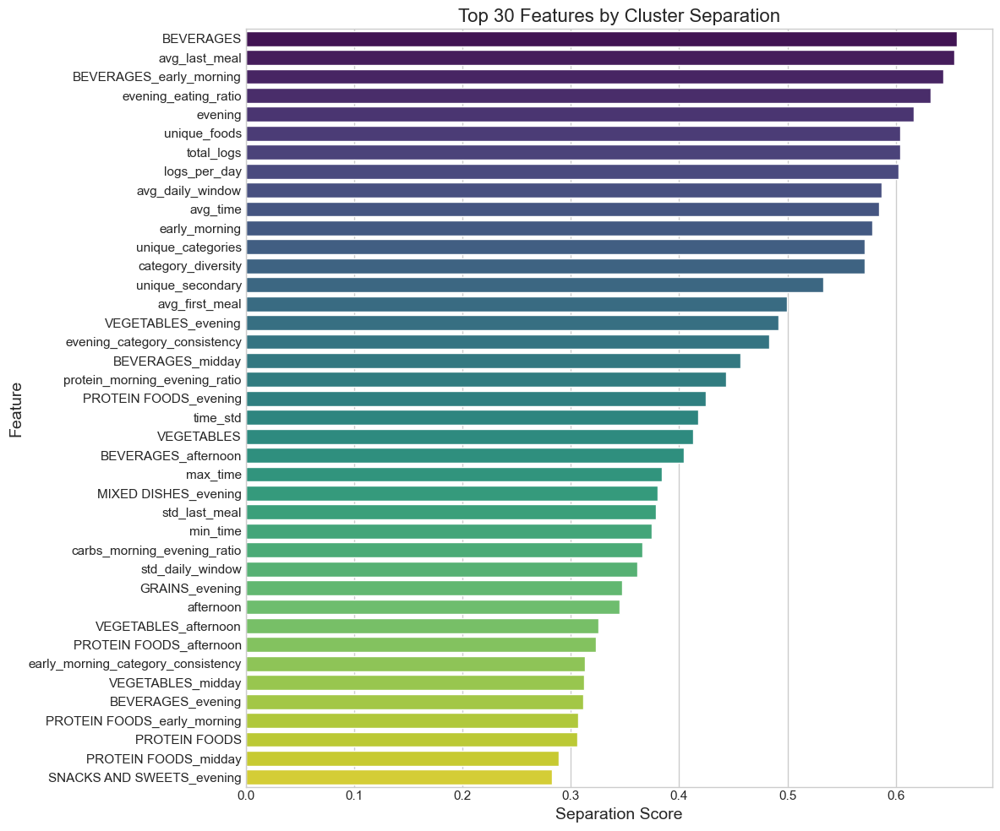

Created feature_importance.png


In [453]:

# ==============================================
# 3. CALCULATE AND PLOT FEATURE IMPORTANCE
# ==============================================

# Calculate the feature importance by cluster separation
def calculate_feature_importance(df, features):
    results = []
    for feature in features:
        # Calculate mean and std for each cluster
        cluster_stats = df.groupby('cluster')[feature].agg(['mean', 'std'])
        
        # Calculate overall mean and std
        overall_mean = df[feature].mean()
        overall_std = df[feature].std()
        
        # Calculate separation (how far cluster means are from overall mean)
        # Normalized by overall std to make features comparable
        separation = np.sum(np.abs(cluster_stats['mean'] - overall_mean)) / (overall_std * len(cluster_stats))
        
        results.append({
            'feature': feature,
            'separation': separation
        })
    
    # Convert to dataframe and sort
    result_df = pd.DataFrame(results).sort_values('separation', ascending=False)
    return result_df

# Get all features except pid and cluster
all_features = [col for col in feature_df.columns if col not in ['pid', 'cluster']]

# Calculate feature importance
feature_importance = calculate_feature_importance(feature_df, all_features)

# Plot top 20 most important features
plt.figure(figsize=(12, 10))
sns.barplot(
    x='separation',
    y='feature',
    data=feature_importance.head(40),
    palette='viridis'
)
plt.title('Top 30 Features by Cluster Separation', fontsize=16)
plt.xlabel('Separation Score', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.tight_layout()
# plt.savefig("presentation_figures/kmeans_box_plots/feature_importance.png", dpi=300, bbox_inches='tight')
plt.show()
print("Created feature_importance.png")

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/3382073624.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  viridis = plt.cm.get_cmap('viridis', 30)
/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/3382073624.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(


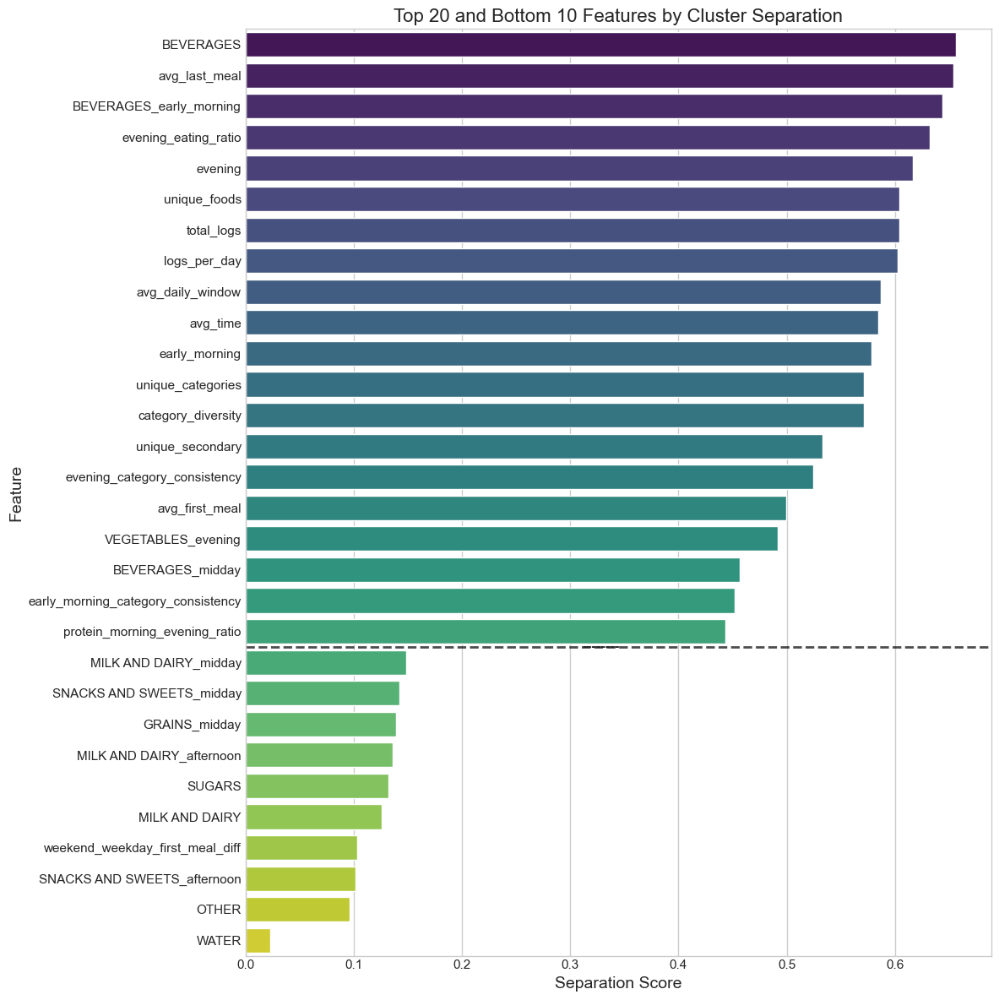

Created feature_importance_combined.png


In [429]:
# Calculate the feature importance by cluster separation
def calculate_feature_importance(df, features):
    results = []
    for feature in features:
        # Calculate mean and std for each cluster
        cluster_stats = df.groupby('cluster')[feature].agg(['mean', 'std'])
        
        # Calculate overall mean and std
        overall_mean = df[feature].mean()
        overall_std = df[feature].std()
        
        # Calculate separation (how far cluster means are from overall mean)
        # Normalized by overall std to make features comparable
        separation = np.sum(np.abs(cluster_stats['mean'] - overall_mean)) / (overall_std * len(cluster_stats))
        
        results.append({
            'feature': feature,
            'separation': separation
        })
    
    # Convert to dataframe and sort
    result_df = pd.DataFrame(results).sort_values('separation', ascending=False)
    return result_df

# Get all features except pid and cluster
all_features = [col for col in feature_df.columns if col not in ['pid', 'cluster']]

# Calculate feature importance
feature_importance = calculate_feature_importance(feature_df, all_features)

# Get top 20 and bottom 10 features
top_features = feature_importance.head(20).copy()
bottom_features = feature_importance.tail(10).copy()

# Add a separator column to identify which group each feature belongs to
top_features['group'] = 'Top'
bottom_features['group'] = 'Bottom'

# Create a new column for the plot order
top_features['plot_order'] = range(len(top_features))
bottom_features['plot_order'] = range(len(top_features) + 1, len(top_features) + len(bottom_features) + 1)  # +1 for the gap

# Concatenate the dataframes
combined_df = pd.concat([top_features, bottom_features])

# Create a custom colormap from viridis with a distinct color for the separator
from matplotlib.colors import ListedColormap
viridis = plt.cm.get_cmap('viridis', 30)
colors = [viridis(i) for i in range(30)]

# Create the plot
plt.figure(figsize=(12, 12))

# Create the main barplot with viridis colormap
bars = sns.barplot(
    x='separation',
    y='feature',
    data=combined_df,
    palette='viridis',
    order=combined_df.sort_values('plot_order')['feature']
)

# Add a horizontal line to separate top and bottom features
plt.axhline(y=len(top_features) - 0.5, color='black', linestyle='--', alpha=0.7, linewidth=2)

# Add text to indicate the separation
plt.text(
    combined_df['separation'].max() * 0.5,  # x position - middle of the plot
    len(top_features) - 0.5,  # y position - at the separator line
    '--------',
    ha='center',
    va='center',
    fontsize=12,
    fontweight='bold'
)

plt.title('Top 20 and Bottom 10 Features by Cluster Separation', fontsize=16)
plt.xlabel('Separation Score', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.tight_layout()
plt.savefig("presentation_figures/feature_importance_combined.png", dpi=300, bbox_inches='tight')
plt.show()
print("Created feature_importance_combined.png")

In [ ]:
user_features[key_features].describe()

,early_morning,midday,evening,night,avg_first_meal,avg_last_meal,avg_daily_window,meal_time_regularity,weekend_weekday_first_meal_diff,protein_morning_evening_ratio,PROTEIN FOODS_early_morning,PROTEIN FOODS_evening,carbs_morning_evening_ratio,GRAINS_early_morning,GRAINS_evening,SNACKS AND SWEETS_evening,category_diversity,early_morning_category_consistency,evening_category_consistency,evening_eating_ratio,logs_per_day
count,17406.000000,17406.000000,17406.000000,17406.000000,17406.000000,17406.000000,17406.000000,17406.000000,17406.000000,17406.000000,17406.000000,17406.000000,17406.000000,17406.000000,17406.000000,17406.000000,17406.000000,1.740600e+04,1.740600e+04,17406.000000,17406.000000
mean,20.675858,29.925530,24.608798,2.739320,9.342459,19.148035,9.805576,0.650037,0.623340,3.180760,2.660569,4.303444,2.880456,2.462965,2.381240,2.466267,10.824313,-3.235126e-01,-3.479881e-01,0.273481,11.343660
std,12.430676,9.296157,10.756622,4.815800,1.592813,1.661212,1.932346,0.431293,1.557459,4.992830,3.510231,3.204570,4.444533,3.271585,2.325668,2.493980,1.773739,1.698802e-01,1.159019e-01,0.121974,5.049020
min,0.000000,0.000000,0.000000,0.000000,4.440476,6.988889,0.000000,0.133955,-8.166960,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-7.202381e-01,-7.628032e-01,0.000000,1.083333
25%,11.214953,23.913043,17.551020,0.000000,8.229762,18.178571,8.524519,0.355536,-0.323333,0.875000,0.000000,1.980198,0.846154,0.000000,0.699301,0.615385,10.000000,-4.444444e-01,-4.225999e-01,0.192661,7.785714
50%,20.183486,29.651163,24.876835,0.806452,9.205952,19.192857,9.850139,0.533519,0.474037,1.666667,1.388889,3.809524,1.600000,1.250000,1.886792,1.851852,11.000000,-3.631716e-01,-3.584798e-01,0.275862,10.441558
75%,28.971963,35.714286,31.632653,3.472222,10.330952,20.189286,11.139132,0.800666,1.457500,3.250000,3.954802,6.028637,3.000000,3.813249,3.448276,3.669725,12.000000,-2.450245e-01,-2.916667e-01,0.352941,13.916667
max,100.000000,72.656250,86.923077,64.102564,18.361905,26.936905,18.435714,7.613170,10.693667,98.000000,47.058824,36.363636,89.000000,46.153846,35.135135,34.920635,14.000000,1.480297e-16,1.480297e-16,0.980645,59.142857


In [224]:
user_features_with_clusters.columns

Index(['pid', 'total_logs', 'avg_time', 'min_time', 'max_time', 'time_std',
       'unique_foods', 'unique_categories', 'unique_secondary', 'num_days',
       ...
       'ALCOHOLIC BEVERAGES_to_CONDIMENTS AND SAUCES',
       'FATS AND OILS_to_WATER', 'WATER_to_ALCOHOLIC BEVERAGES',
       'GRAINS_to_WATER', 'OTHER_to_WATER', 'WATER_to_SUGARS',
       'SUGARS_to_WATER', 'WATER_to_CONDIMENTS AND SAUCES',
       'WATER_to_FATS AND OILS', 'cluster'],
      dtype='object', length=273)

In [225]:

# Map clusters back to original users
user_clusters = pd.DataFrame({
    'pid': pca_clustered['pid'],
    'cluster': pca_clustered['cluster']
})

# Add cluster info to original features for analysis
user_features_with_clusters = user_features.merge(user_clusters, on='pid')

# Get cluster statistics to understand patterns
cluster_stats = user_features_with_clusters.groupby('cluster').agg({
    'avg_daily_window': 'mean',
    'avg_time': 'mean',
    'category_diversity': 'mean',
    'avg_first_meal': 'mean',
    'avg_last_meal': 'mean',
    'meal_time_regularity': 'mean',
    'protein_morning_evening_ratio': 'mean',
    'carbs_morning_evening_ratio': 'mean',
    'evening_eating_ratio': 'mean'
}).reset_index()

print("Cluster Statistics:")
display(cluster_stats)


Cluster Statistics:


,cluster,avg_daily_window,avg_time,category_diversity,avg_first_meal,avg_last_meal,meal_time_regularity,protein_morning_evening_ratio,carbs_morning_evening_ratio,evening_eating_ratio
0,0,7.990241,13.196239,7.450279,9.043719,17.033960,0.609978,2.011002,2.812979,0.189953
1,1,8.889021,12.906922,10.658236,8.554279,17.443300,0.795638,9.200234,7.661535,0.106890
2,2,10.421795,14.197806,10.548559,8.940930,19.362724,0.537750,2.084199,2.078560,0.302488
3,3,11.043619,14.275516,11.997107,8.731169,19.774788,0.781828,2.250795,2.058802,0.286021
4,4,8.708175,15.763718,10.727595,11.222604,19.930779,0.542490,1.328201,1.219371,0.367676


In [284]:
user_clusters.to_csv('clusters/kmeans_user_clusters_5.csv')

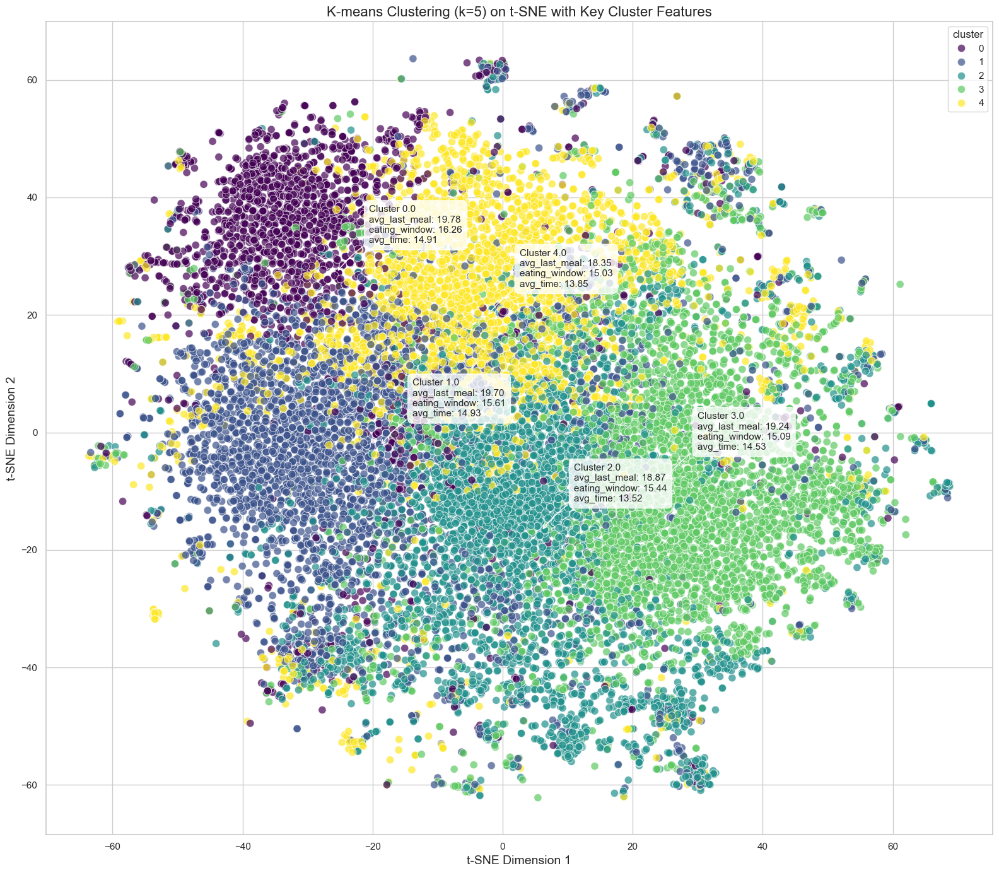

In [187]:

# Save user clusters
user_clusters.to_csv('kmeans_5_user_clusters.csv', index=False)

# Optional: Create an enhanced visualization with annotated clusters
plt.figure(figsize=(16, 14))

# Plot t-SNE with clusters
ax = sns.scatterplot(
    x='TSNE1',
    y='TSNE2',
    hue='cluster',
    palette='viridis',
    data=tsne_clustered,
    alpha=0.7,
    s=80
)

# Add annotations for each cluster centroid
for i, centroid in centroids_tsne.iterrows():
    cluster_num = centroid['cluster']
    
    # Get top 3 distinguishing features for this cluster
    cluster_data = cluster_stats[cluster_stats['cluster'] == cluster_num].iloc[0].drop('cluster')
    # Find features where this cluster has highest values compared to others
    distinguishing_features = cluster_data.sort_values(ascending=False).index[:3].tolist()
    
    # Format annotation text
    annotation = f"Cluster {cluster_num}\n" + "\n".join([f"{feat}: {cluster_data[feat]:.2f}" for feat in distinguishing_features])
    
    # Add annotation with arrow pointing to centroid
    plt.annotate(
        annotation,
        xy=(centroid['TSNE1'], centroid['TSNE2']),
        xytext=(centroid['TSNE1'] + 5, centroid['TSNE2'] + 5),
        fontsize=11,
        bbox=dict(boxstyle="round,pad=0.5", fc="white", alpha=0.8),
        arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=0.2")
    )

plt.title(f'K-means Clustering (k={optimal_k}) on t-SNE with Key Cluster Features', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.tight_layout()
plt.show()

In [227]:
user_features['early_morning'].describe()

count    17409.000000
mean        20.676125
std         12.436466
min          0.000000
25%         11.214953
50%         20.183486
75%         28.971963
max        100.000000
Name: early_morning, dtype: float64

In [253]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os

def plot_tsne_feature(tsne_clustered, user_features, feature_name, figsize=(6, 5), 
                      title=None, cmap='viridis'):
    if user_features.index.name == 'pid':
        user_features = user_features.reset_index()
    
    if feature_name not in user_features.columns:
        print(f"Error: Feature '{feature_name}' not found in user_features")
        return None, None
    
    merged_df = pd.merge(tsne_clustered, user_features[['pid', feature_name]], on='pid', how='inner')
    
    fig, ax = plt.subplots(figsize=figsize)
    
    scatter = sns.scatterplot(
        x='TSNE1',
        y='TSNE2',
        hue=feature_name,
        palette=cmap,
        data=merged_df,
        alpha=0.7,
        s=5,
        ax=ax
    )
    
    norm = plt.Normalize(merged_df[feature_name].min(), merged_df[feature_name].max())
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    
    bbox = ax.get_position()
    cax = fig.add_axes([
        bbox.x1 + 0.05,
        bbox.y0 + bbox.height * 0.25,
        0.02,
        bbox.height * 0.5
    ])
    
    cbar = fig.colorbar(sm, cax=cax)
    cbar.set_label(feature_name, rotation=270, labelpad=15)
    
    ax.set_title(title if title else f'{feature_name}')
    ax.set_xlabel('TSNE Dimension 1')
    ax.set_ylabel('TSNE Dimension 2')
    
    if ax.legend_:
        ax.legend_.remove()
    
    plt.tight_layout(rect=[0, 0, 0.95, 1])
    
    return fig, ax

def plot_tsne_clusters(tsne_clustered, figsize=(6, 5)):
    fig, ax = plt.subplots(figsize=figsize)
    
    # Get the number of clusters
    optimal_k = tsne_clustered['cluster'].nunique()
    
    # Get colors from seaborn's color palette
    colors = sns.color_palette("tab10", optimal_k)
    
    # Plot points
    scatter = sns.scatterplot(
        x='TSNE1',
        y='TSNE2',
        hue='cluster',
        palette='tab10',
        data=tsne_clustered,
        alpha=0.7,
        s=5,
        ax=ax
    )
    
    # Add cluster centroids
    centroids_tsne = tsne_clustered.groupby('cluster')[['TSNE1', 'TSNE2']].mean().reset_index()
    for i, row in centroids_tsne.iterrows():
        cluster_num = int(row['cluster'])
        ax.scatter(
            row['TSNE1'],
            row['TSNE2'],
            s=150,
            marker='X',
            color=[colors[cluster_num]],
            edgecolor='black',
            linewidth=2,
            zorder=5
        )
    
    ax.set_title(f'K-means Clustering (k={optimal_k})')
    ax.set_xlabel('TSNE Dimension 1')
    ax.set_ylabel('TSNE Dimension 2')
    
    # Create legend with larger markers
    legend = ax.legend(title='Cluster', title_fontsize=12, markerscale=3)
    
    plt.tight_layout()
    
    return fig, ax

def batch_plot_tsne(tsne_clustered, user_features, feature_groups, output_dir='tsne_plots'):
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    
    # First plot the clusters
    fig, ax = plot_tsne_clusters(tsne_clustered)
    plt.savefig(f'{output_dir}/clusters.png', dpi=300, bbox_inches='tight')
    plt.close(fig)
    print(f"Saved cluster plot to {output_dir}/clusters.png")
    
    # Plot each feature from the feature groups
    for group_name, features in feature_groups.items():
        for feature in features:
            try:
                fig, ax = plot_tsne_feature(tsne_clustered, user_features, feature)
                
                # Create clean filename
                filename = feature.replace(' ', '_').replace('/', '_')
                plt.savefig(f'{output_dir}/{filename}.png', dpi=300, bbox_inches='tight')
                plt.close(fig)
                print(f"Saved {feature} plot to {output_dir}/{filename}.png")
            except Exception as e:
                print(f"Error plotting {feature}: {e}")
    
    print(f"All plots saved to {output_dir}/")

# Example usage:
feature_groups = {
    'Time Windows': ['early_morning', 'midday', 'evening', 'night'],
    'Eating Window': ['avg_first_meal', 'avg_last_meal', 'avg_daily_window', 'meal_time_regularity'],
    'Weekend Effect': ['weekend_weekday_first_meal_diff'],
    'Protein Timing': ['protein_morning_evening_ratio', 'PROTEIN FOODS_early_morning', 'PROTEIN FOODS_evening'],
    'Carb Timing': ['carbs_morning_evening_ratio', 'GRAINS_early_morning', 'GRAINS_evening'],
    'Food Variety': ['category_diversity', 'early_morning_category_consistency', 'evening_category_consistency'],
    'Overall Metrics': ['evening_eating_ratio', 'logs_per_day']
}

batch_plot_tsne(tsne_clustered, user_features, feature_groups)



Saved cluster plot to tsne_plots/clusters.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved early_morning plot to tsne_plots/early_morning.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved midday plot to tsne_plots/midday.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved evening plot to tsne_plots/evening.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved night plot to tsne_plots/night.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved avg_first_meal plot to tsne_plots/avg_first_meal.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved avg_last_meal plot to tsne_plots/avg_last_meal.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved avg_daily_window plot to tsne_plots/avg_daily_window.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved meal_time_regularity plot to tsne_plots/meal_time_regularity.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved weekend_weekday_first_meal_diff plot to tsne_plots/weekend_weekday_first_meal_diff.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved protein_morning_evening_ratio plot to tsne_plots/protein_morning_evening_ratio.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved PROTEIN FOODS_early_morning plot to tsne_plots/PROTEIN_FOODS_early_morning.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved PROTEIN FOODS_evening plot to tsne_plots/PROTEIN_FOODS_evening.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved carbs_morning_evening_ratio plot to tsne_plots/carbs_morning_evening_ratio.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved GRAINS_early_morning plot to tsne_plots/GRAINS_early_morning.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved GRAINS_evening plot to tsne_plots/GRAINS_evening.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved category_diversity plot to tsne_plots/category_diversity.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved early_morning_category_consistency plot to tsne_plots/early_morning_category_consistency.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved evening_category_consistency plot to tsne_plots/evening_category_consistency.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved evening_eating_ratio plot to tsne_plots/evening_eating_ratio.png


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved logs_per_day plot to tsne_plots/logs_per_day.png
All plots saved to tsne_plots/


In [254]:
feature_groups = {
    'Food Groups': ['ALCOHOLIC BEVERAGES', 'BEVERAGES', 'FRUIT', 'VEGETABLES', 'PROTEIN FOODS', 'SNACKS AND SWEETS'],
}

batch_plot_tsne(tsne_clustered, user_features, feature_groups)

,pid,total_logs,avg_time,min_time,max_time,time_std,unique_foods,unique_categories,unique_secondary,num_days,logs_per_day,afternoon,early_morning,evening,midday,night,ALCOHOLIC BEVERAGES,BEVERAGES,CONDIMENTS AND SAUCES,FATS AND OILS,FRUIT,GRAINS,MILK AND DAIRY,MIXED DISHES,OTHER,PROTEIN FOODS,SNACKS AND SWEETS,SUGARS,VEGETABLES,WATER,category_diversity,BEVERAGES_early_morning,PROTEIN FOODS_midday,VEGETABLES_evening,VEGETABLES_midday,BEVERAGES_midday,PROTEIN FOODS_evening,PROTEIN FOODS_afternoon,VEGETABLES_afternoon,GRAINS_midday,BEVERAGES_afternoon,PROTEIN FOODS_early_morning,FRUIT_midday,MILK AND DAIRY_midday,SNACKS AND SWEETS_evening,SNACKS AND SWEETS_afternoon,GRAINS_early_morning,MILK AND DAIRY_early_morning,GRAINS_evening,MIXED DISHES_evening,MIXED DISHES_midday,SNACKS AND SWEETS_midday,FRUIT_afternoon,FRUIT_early_morning,GRAINS_afternoon,BEVERAGES_evening,MILK AND DAIRY_afternoon,ALCOHOLIC BEVERAGES_evening,MIXED DISHES_afternoon,MILK AND DAIRY_evening,FRUIT_evening,avg_first_meal,avg_last_meal,std_first_meal,std_last_meal,avg_daily_window,std_daily_window,meal_time_regularity,protein_morning_evening_ratio,carbs_morning_evening_ratio,evening_eating_ratio,weekend_weekday_first_meal_diff,early_morning_category_consistency,midday_category_consistency,evening_category_consistency
0,alqt150211047,255,13.522499,8.256944,21.013056,2.870070,77,13,30,14,18.214286,45.882353,10.588235,3.529412,40.000000,0.000000,0.392157,9.019608,2.352941,0.784314,9.019608,16.862745,16.470588,2.745098,7.450980,12.549020,7.450980,0.784314,14.117647,0.000000,13,1.960784,4.705882,0.000000,6.274510,3.529412,0.392157,7.058824,5.882353,7.058824,3.137255,0.392157,4.313725,7.058824,0.000000,4.705882,2.352941,2.745098,0.000000,0.392157,0.784314,2.352941,3.529412,0.784314,7.450980,0.392157,6.274510,0.392157,1.568627,0.392157,0.392157,9.979444,17.569544,0.754586,1.626780,7.590099,1.610175,1.170157,13.000000,31.000000,0.035294,0.223319,-0.328042,-0.361854,-0.097222
1,alqt150211119,93,13.553707,7.633333,21.050000,4.421242,48,12,28,13,7.153846,11.827957,26.881720,26.881720,34.408602,0.000000,2.150538,6.451613,1.075269,2.150538,1.075269,16.129032,11.827957,9.677419,4.301075,17.204301,7.526882,0.000000,20.430108,0.000000,12,4.301075,8.602151,7.526882,8.602151,2.150538,5.376344,0.000000,2.150538,5.376344,0.000000,3.225806,0.000000,2.150538,0.000000,2.150538,2.150538,5.376344,5.376344,3.225806,4.301075,1.075269,0.000000,1.075269,3.225806,0.000000,1.075269,2.150538,1.075269,3.225806,0.000000,8.133761,18.067949,0.374458,3.711578,9.934188,3.819659,2.107670,2.200000,2.400000,0.268817,0.498920,-0.300000,-0.409722,-0.220000
2,alqt150211143,115,10.682174,7.166667,16.716667,3.058861,38,9,19,14,8.214286,20.869565,51.304348,0.000000,27.826087,0.000000,0.000000,5.217391,0.000000,0.869565,9.565217,9.565217,3.478261,2.608696,0.000000,31.304348,13.913043,0.000000,23.478261,0.000000,9,5.217391,7.826087,0.000000,6.956522,0.000000,0.000000,4.347826,6.956522,3.478261,0.000000,19.130435,2.608696,0.869565,0.000000,4.347826,4.347826,0.869565,0.000000,0.000000,0.869565,4.347826,0.000000,6.956522,1.739130,0.000000,1.739130,0.000000,1.739130,0.000000,0.000000,7.633333,13.829762,0.373823,2.688398,6.196429,2.873160,2.110493,31.000000,20.000000,0.000000,0.560000,-0.372881,-0.406250,0.000000
3,alqt150211144,94,14.156475,6.266667,21.483333,4.939310,33,10,25,14,6.714286,12.765957,22.340426,32.978723,31.914894,0.000000,1.063830,13.829787,1.063830,0.000000,8.510638,21.276596,21.276596,14.893617,0.000000,8.510638,8.510638,0.000000,1.063830,0.000000,10,8.510638,3.191489,1.063830,0.000000,3.191489,5.319149,0.000000,0.000000,6.382979,2.127660,0.000000,1.063830,5.319149,2.127660,3.191489,3.191489,6.382979,10.638298,4.255319,8.510638,3.191489,4.255319,2.127660,1.063830,0.000000,2.127660,1.063830,0.000000,7.446809,1.063830,8.045278,18.788968,2.113869,2.748569,10.743690,3.590483,0.451698,0.600000,1.000000,0.329787,2.085028,-0.304762,-0.333333,-0.431452
4,alqt150211157,113,12.388100,4.000000,27.989167,4.84

In [456]:
demo_df = pd.read_csv('data/user_demographics.csv')
demo_df = demo_df[demo_df['pid'].isin(eligible_users['pid'])]
demo_df

,gender,age,working_hours,age_group,pid
0,female,44.0,Flexible Schedule,Between 40 and 60,alqt150211047
1,female,29.0,Regular Work Hours Between 8AM-5PM,Under 40,alqt150211119
2,male,19.0,Regular Work Hours Between 8AM-5PM,Under 40,alqt150211143
3,male,21.0,Regular Work Hours Between 8AM-5PM,Under 40,alqt150211144
4,male,60.0,Regular Work Hours Between 8AM-5PM,Between 40 and 60,alqt150211157
...,...,...,...,...,...
20997,male,32.0,Unknown,Under 40,alqt230434241004
20998,female,30.0,Unknown,Under 40,alqt230438241283
20999,female,54.0,Unknown,Between 40 and 60,alqt230453243867
21001,female,51.0,Unknown,Between 40 and 60,alqt230542245394


In [460]:
demo_df = feature_df[['pid', 'cluster']].merge(demo_df, on='pid', how='inner')
demo_df

,pid,cluster,gender,age,working_hours,age_group
0,alqt150211047,1,female,44.0,Flexible Schedule,Between 40 and 60
1,alqt150211119,2,female,29.0,Regular Work Hours Between 8AM-5PM,Under 40
2,alqt150211143,1,male,19.0,Regular Work Hours Between 8AM-5PM,Under 40
3,alqt150211144,2,male,21.0,Regular Work Hours Between 8AM-5PM,Under 40
4,alqt150211157,2,male,60.0,Regular Work Hours Between 8AM-5PM,Between 40 and 60
...,...,...,...,...,...,...
17404,alqt230434241004,2,male,32.0,Unknown,Under 40
17405,alqt230438241283,4,female,30.0,Unknown,Under 40
17406,alqt230453243867,1,female,54.0,Unknown,Between 40 and 60
17407,alqt230542245394,2,female,51.0,Unknown,Between 40 and 60


In [475]:
demo_df.loc[demo_df['gender'] == 'unknown', 'gender'] = 'other'


In [476]:
demo_df['gender'].value_counts()

gender
female    11294
male       6084
other        21
Name: count, dtype: int64

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


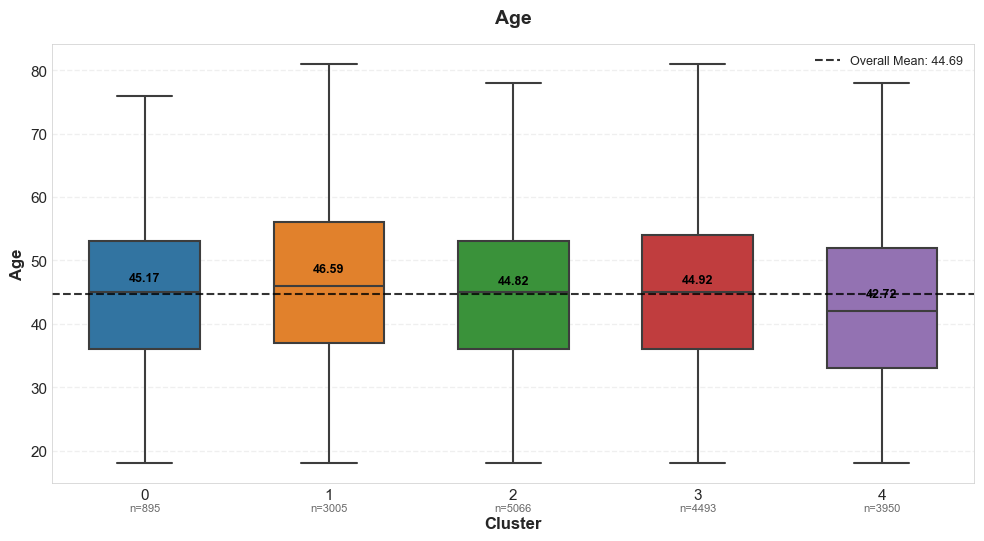

In [478]:
# Example usage:
feature = "age"
create_cluster_box_plot(demo_df, feature)

In [488]:
feature_df['logs_per_day']

0        18.214286
1         7.153846
2         8.214286
3         6.714286
4         8.071429
           ...    
17404    10.857143
17405     5.714286
17406    13.928571
17407    10.285714
17408     9.642857
Name: logs_per_day, Length: 17409, dtype: float64

In [492]:
overview_features = ['logs_per_day', 'unique_categories', 'unique_foods']

,pid,total_logs,avg_time,min_time,max_time,time_std,unique_foods,unique_categories,unique_secondary,num_days,logs_per_day,afternoon,early_morning,evening,midday,night,ALCOHOLIC BEVERAGES,BEVERAGES,CONDIMENTS AND SAUCES,FATS AND OILS,FRUIT,GRAINS,MILK AND DAIRY,MIXED DISHES,OTHER,PROTEIN FOODS,SNACKS AND SWEETS,SUGARS,VEGETABLES,WATER,category_diversity,BEVERAGES_early_morning,PROTEIN FOODS_midday,VEGETABLES_evening,VEGETABLES_midday,BEVERAGES_midday,PROTEIN FOODS_evening,PROTEIN FOODS_afternoon,VEGETABLES_afternoon,GRAINS_midday,BEVERAGES_afternoon,PROTEIN FOODS_early_morning,FRUIT_midday,MILK AND DAIRY_midday,SNACKS AND SWEETS_evening,SNACKS AND SWEETS_afternoon,GRAINS_early_morning,MILK AND DAIRY_early_morning,GRAINS_evening,MIXED DISHES_evening,MIXED DISHES_midday,SNACKS AND SWEETS_midday,FRUIT_afternoon,FRUIT_early_morning,GRAINS_afternoon,BEVERAGES_evening,MILK AND DAIRY_afternoon,ALCOHOLIC BEVERAGES_evening,MIXED DISHES_afternoon,MILK AND DAIRY_evening,FRUIT_evening,avg_first_meal,avg_last_meal,std_first_meal,std_last_meal,avg_daily_window,std_daily_window,meal_time_regularity,protein_morning_evening_ratio,carbs_morning_evening_ratio,evening_eating_ratio,weekend_weekday_first_meal_diff,early_morning_category_consistency,midday_category_consistency,evening_category_consistency,cluster
0,alqt150211047,255,13.522499,8.256944,21.013056,2.870070,77,13,30,14,18.214286,45.882353,10.588235,3.529412,40.000000,0.000000,0.392157,9.019608,2.352941,0.784314,9.019608,16.862745,16.470588,2.745098,7.450980,12.549020,7.450980,0.784314,14.117647,0.000000,13,1.960784,4.705882,0.000000,6.274510,3.529412,0.392157,7.058824,5.882353,7.058824,3.137255,0.392157,4.313725,7.058824,0.000000,4.705882,2.352941,2.745098,0.000000,0.392157,0.784314,2.352941,3.529412,0.784314,7.450980,0.392157,6.274510,0.392157,1.568627,0.392157,0.392157,9.979444,17.569544,0.754586,1.626780,7.590099,1.610175,1.170157,13.000000,31.000000,0.035294,0.223319,0.328042,0.361854,0.097222,1
1,alqt150211119,93,13.553707,7.633333,21.050000,4.421242,48,12,28,13,7.153846,11.827957,26.881720,26.881720,34.408602,0.000000,2.150538,6.451613,1.075269,2.150538,1.075269,16.129032,11.827957,9.677419,4.301075,17.204301,7.526882,0.000000,20.430108,0.000000,12,4.301075,8.602151,7.526882,8.602151,2.150538,5.376344,0.000000,2.150538,5.376344,0.000000,3.225806,0.000000,2.150538,0.000000,2.150538,2.150538,5.376344,5.376344,3.225806,4.301075,1.075269,0.000000,1.075269,3.225806,0.000000,1.075269,2.150538,1.075269,3.225806,0.000000,8.133761,18.067949,0.374458,3.711578,9.934188,3.819659,2.107670,2.200000,2.400000,0.268817,0.498920,0.300000,0.409722,0.220000,2
2,alqt150211143,115,10.682174,7.166667,16.716667,3.058861,38,9,19,14,8.214286,20.869565,51.304348,0.000000,27.826087,0.000000,0.000000,5.217391,0.000000,0.869565,9.565217,9.565217,3.478261,2.608696,0.000000,31.304348,13.913043,0.000000,23.478261,0.000000,9,5.217391,7.826087,0.000000,6.956522,0.000000,0.000000,4.347826,6.956522,3.478261,0.000000,19.130435,2.608696,0.869565,0.000000,4.347826,4.347826,0.869565,0.000000,0.000000,0.869565,4.347826,0.000000,6.956522,1.739130,0.000000,1.739130,0.000000,1.739130,0.000000,0.000000,7.633333,13.829762,0.373823,2.688398,6.196429,2.873160,2.110493,31.000000,20.000000,0.000000,0.560000,0.372881,0.406250,0.000000,1
3,alqt150211144,94,14.156475,6.266667,21.483333,4.939310,33,10,25,14,6.714286,12.765957,22.340426,32.978723,31.914894,0.000000,1.063830,13.829787,1.063830,0.000000,8.510638,21.276596,21.276596,14.893617,0.000000,8.510638,8.510638,0.000000,1.063830,0.000000,10,8.510638,3.191489,1.063830,0.000000,3.191489,5.319149,0.000000,0.000000,6.382979,2.127660,0.000000,1.063830,5.319149,2.127660,3.191489,3.191489,6.382979,10.638298,4.255319,8.510638,3.191489,4.255319,2.127660,1.063830,0.000000,2.127660,1.063830,0.000000,7.446809,1.063830,8.045278,18.788968,2.113869,2.748569,10.743690,3.590483,0.451698,0.600000,1.000000,0.329787,2.085028,0.304762,0.333333,0.431452,2
4,alqt150211157,113,12.388100,4.000000,27.989167

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/2512349900.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


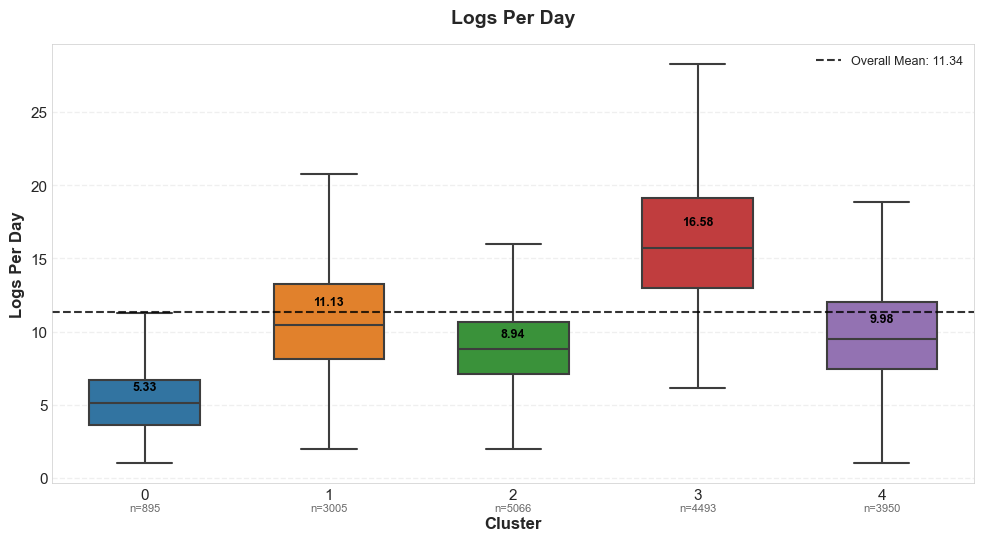

In [489]:
# Example usage:
feature = "logs_per_day"
create_cluster_box_plot(feature_df, feature)

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/3214173295.py:145: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


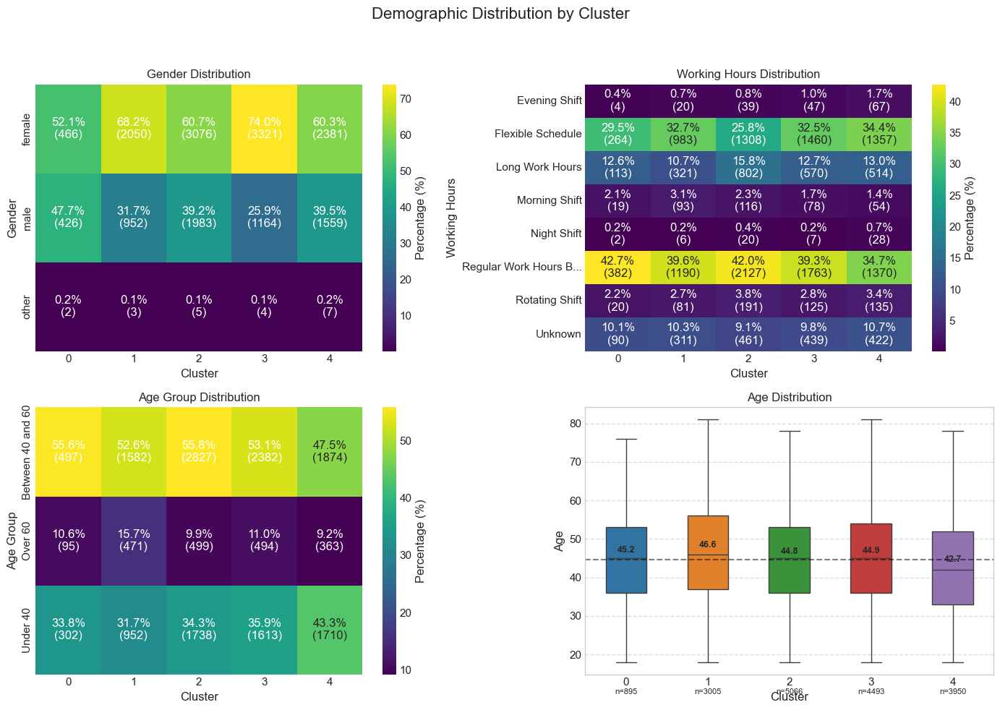

(<Figure size 1400x1000 with 7 Axes>,
 array([[<Axes: title={'center': 'Gender Distribution'}, xlabel='Cluster', ylabel='Gender'>,
         <Axes: title={'center': 'Working Hours Distribution'}, xlabel='Cluster', ylabel='Working Hours'>],
        [<Axes: title={'center': 'Age Group Distribution'}, xlabel='Cluster', ylabel='Age Group'>,
         <Axes: title={'center': 'Age Distribution'}, xlabel='Cluster', ylabel='Age'>]],
       dtype=object))

In [485]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import os

def visualize_demographics(df, features, title="Demographic Distribution Across Clusters", 
                           save=False, filename=None, figsize=(14, 10), cmap="viridis",
                           max_label_length=20):
    """
    Visualize demographic data across clusters using appropriate visualizations:
    - Heatmaps for categorical variables
    - Box plots for numerical variables
    
    Parameters:
    -----------
    df : DataFrame
        DataFrame containing demographic data with 'cluster' column
    features : list
        List of demographic features to visualize
    title : str, optional
        Overall title for the visualization
    save : bool, optional
        Whether to save the figure
    filename : str, optional
        Filename to save the figure (if None, derived from title)
    figsize : tuple, optional
        Figure size as (width, height)
    cmap : str, optional
        Colormap to use for heatmaps
    max_label_length : int, optional
        Maximum length for category labels before truncation
    """
    # Identify numerical and categorical features
    num_features = []
    cat_features = []
    
    for feature in features:
        if pd.api.types.is_numeric_dtype(df[feature]) and df[feature].nunique() > 10:
            num_features.append(feature)
        else:
            cat_features.append(feature)
    
    # Calculate number of subplots needed
    n_plots = len(cat_features) + len(num_features)
    
    # Define figure size and layout
    if n_plots <= 1:
        n_rows, n_cols = 1, 1
    elif n_plots <= 2:
        n_rows, n_cols = 1, 2
    elif n_plots <= 4:
        n_rows, n_cols = 2, 2
    else:
        n_rows = (n_plots + 1) // 2  # Ceiling division
        n_cols = 2
    
    # Create figure and subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    
    # Make sure axes is always a 2D array
    if n_plots == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = axes.reshape(1, -1)
    
    # Get cluster information
    clusters = sorted(df['cluster'].unique())
    n_clusters = len(clusters)
    
    # Plot index tracker
    plot_idx = 0
    
    # Process categorical features first (heatmaps)
    for feature in cat_features:
        # Get row and column index for the current subplot
        row_idx = plot_idx // n_cols
        col_idx = plot_idx % n_cols
        ax = axes[row_idx, col_idx]
        
        # Create a copy of the dataframe to work with
        temp_df = df.copy()
        
        # Truncate long category labels if needed
        if feature == 'working_hours' or any(len(str(x)) > max_label_length for x in temp_df[feature].unique()):
            temp_df[feature] = temp_df[feature].apply(
                lambda x: str(x)[:max_label_length] + '...' if len(str(x)) > max_label_length else x
            )
        
        # Create a cross-tabulation of category vs. cluster (transposed from before)
        # with proportions normalized within each cluster
        cross_tab = pd.crosstab(
            temp_df[feature],
            temp_df['cluster'],
            normalize='columns'
        ) * 100  # Convert to percentages
        
        # Get raw counts for annotations
        count_tab = pd.crosstab(temp_df[feature], temp_df['cluster'])
        
        # Plot heatmap
        sns.heatmap(
            cross_tab, 
            annot=True, 
            fmt='.1f', 
            cmap=cmap, 
            ax=ax, 
            cbar_kws={'label': 'Percentage (%)'}
        )
        
        # Add count annotations in parentheses
        for i in range(cross_tab.shape[0]):
            for j in range(cross_tab.shape[1]):
                # Get the current percentage text position
                text = ax.texts[i * cross_tab.shape[1] + j]
                x, y = text.get_position()
                text_str = text.get_text()
                
                # Add count in parentheses
                count = count_tab.iloc[i, j]
                new_text = f"{text_str}%\n({count})"
                
                # Replace the text
                text.set_text(new_text)
                
                # If the cell is dark, make text white for readability
                cell_color = cross_tab.iloc[i, j] / 100  # Normalize to 0-1 for color scale
                if cell_color > 0.5:  # Adjust threshold based on your colormap
                    text.set_color('white')
        
        ax.set_title(f"{feature.replace('_', ' ').title()} Distribution", fontsize=12)
        ax.set_ylabel(feature.replace('_', ' ').title())
        ax.set_xlabel("Cluster")
        
        plot_idx += 1
    
    # Process numerical features (box plots)
    for feature in num_features:
        # Get row and column index for the current subplot
        row_idx = plot_idx // n_cols
        col_idx = plot_idx % n_cols
        ax = axes[row_idx, col_idx]
        
        # Create boxplot
        sns.boxplot(
            x='cluster', 
            y=feature, 
            data=df, 
            ax=ax, 
            palette="tab10",
            width=0.5,
            linewidth=1.0,
            showfliers=False
        )
        
        # Add mean value line
        mean_val = df[feature].mean()
        ax.axhline(mean_val, ls='--', color='black', alpha=0.5)
        
        # Add annotations for each cluster's mean
        for i, cluster in enumerate(clusters):
            cluster_data = df[df['cluster'] == cluster][feature]
            cluster_mean = cluster_data.mean()
            
            # Annotate mean
            ax.annotate(
                f"{cluster_mean:.1f}",
                xy=(i, cluster_mean),
                xytext=(0, 5),
                textcoords="offset points",
                ha='center',
                fontsize=9,
                fontweight='bold'
            )
            
            # Add cluster size at the bottom (only once per subplot)
            cluster_size = df[df['cluster'] == cluster].shape[0]
            ax.annotate(
                f"n={cluster_size}",
                xy=(i, ax.get_ylim()[0]),
                xytext=(0, -20),
                textcoords="offset points",
                ha='center',
                fontsize=8
            )
        
        ax.set_title(f"{feature.replace('_', ' ').title()} Distribution", fontsize=12)
        ax.set_xlabel("Cluster")
        ax.set_ylabel(feature.replace('_', ' ').title())
        
        # Add grid for readability
        ax.grid(axis='y', linestyle='--', alpha=0.7)
        
        plot_idx += 1
    
    # Hide any unused subplots
    for i in range(plot_idx, n_rows * n_cols):
        row_idx = i // n_cols
        col_idx = i % n_cols
        axes[row_idx, col_idx].set_visible(False)
    
    # Add overall title
    plt.suptitle(title, fontsize=16, y=0.98)
    
    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    
    # Save figure if requested
    if save:
        if filename is None:
            filename = title.lower().replace(' ', '_').replace(',', '')
        
        save_path = f"presentation_figures/demographic_analysis/{filename}.png"
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.close()
        print(f"Saved {save_path}")
    else:
        plt.show()
    
    return fig, axes

# Example usage
demographic_features = ['gender', 'age', 'working_hours', 'age_group']
visualize_demographics(demo_df, demographic_features, "Demographic Distribution by Cluster")

Saved cluster plot to tsne_plots/clusters.png
Error plotting gender: '<=' not supported between instances of 'str' and 'float'


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1374033217.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


Saved age plot to tsne_plots/age.png
Error plotting working_hours: '<=' not supported between instances of 'str' and 'float'
Error plotting age_group: '<=' not supported between instances of 'str' and 'float'
All plots saved to tsne_plots/


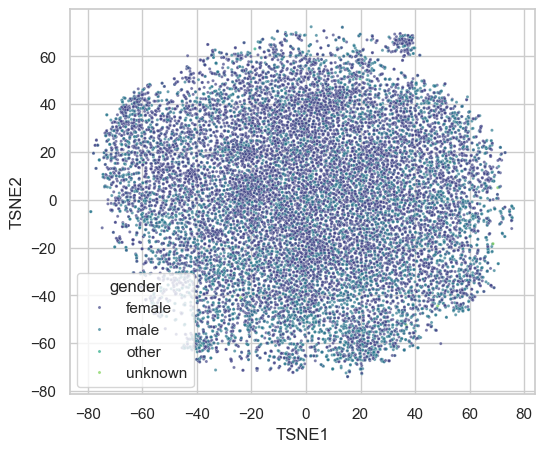

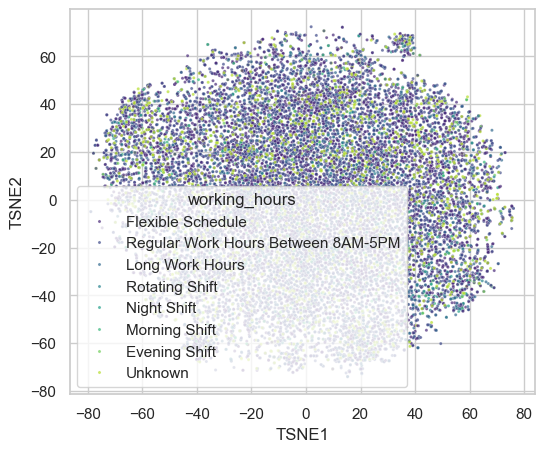

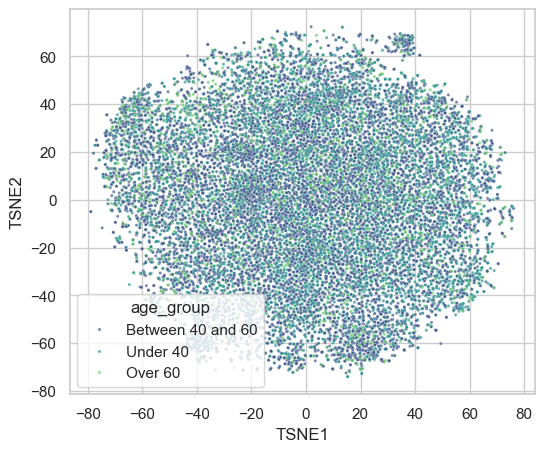

In [259]:
feature_groups = {
    'Demographics': ['gender', 'age', 'working_hours', 'age_group'],
}

batch_plot_tsne(tsne_clustered, demo_df, feature_groups)

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_3063/1063011558.py:63: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust layout to make room for colorbar


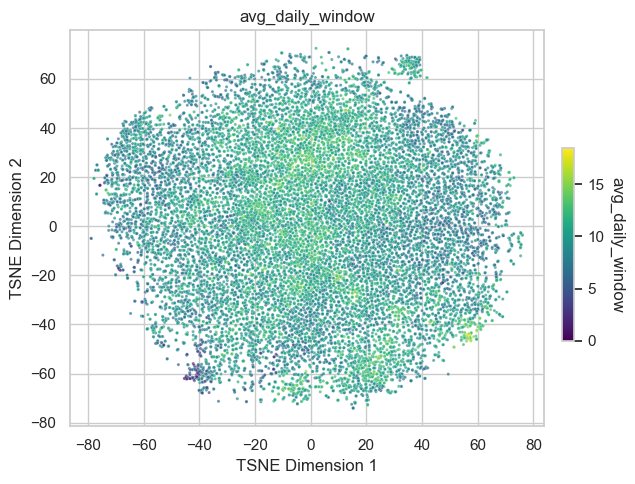

In [252]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def plot_tsne_feature(tsne_clustered, user_features, feature_name, figsize=(6, 5), 
                      title=None, cmap='viridis'):
    """
    Create a t-SNE visualization with points colored by a feature.
    """
    # Handle pid as index or column
    if user_features.index.name == 'pid':
        user_features = user_features.reset_index()
    
    # Verify feature exists
    if feature_name not in user_features.columns:
        print(f"Error: Feature '{feature_name}' not found in user_features")
        return None, None
    
    # Merge data
    merged_df = pd.merge(tsne_clustered, user_features[['pid', feature_name]], on='pid', how='inner')
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    
    # Create scatter plot
    scatter = sns.scatterplot(
        x='TSNE1',
        y='TSNE2',
        hue=feature_name,
        palette=cmap,
        data=merged_df,
        alpha=0.7,
        s=5,
        ax=ax
    )
    
    # Add colorbar at 50% height
    norm = plt.Normalize(merged_df[feature_name].min(), merged_df[feature_name].max())
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    
    # Calculate position for colorbar (50% height)
    bbox = ax.get_position()
    cax = fig.add_axes([
        bbox.x1 + 0.05,  # x position (right of plot)
        bbox.y0 + bbox.height * 0.25,  # y position (25% from bottom)
        0.02,  # width
        bbox.height * 0.5  # height (50% of plot height)
    ])
    
    cbar = fig.colorbar(sm, cax=cax)
    cbar.set_label(feature_name, rotation=270, labelpad=15)
    
    # Set title
    ax.set_title(title if title else f'{feature_name}')
    ax.set_xlabel('TSNE Dimension 1')
    ax.set_ylabel('TSNE Dimension 2')
    
    # Remove legend (we have colorbar)
    if ax.legend_:
        ax.legend_.remove()
    
    plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust layout to make room for colorbar
    
    return fig, ax

# Example usage:
fig, ax = plot_tsne_feature(tsne_clustered, user_features, 'avg_daily_window')
# plt.savefig('tsne_avg_daily_window.png', dpi=300, bbox_inches='tight')
plt.show()

In [486]:
pca_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,pid
0,-4.046093,5.369983,-3.999901,4.497695,1.539671,0.862203,1.276670,1.926968,-0.842962,1.699379,0.660675,0.328824,1.373472,-0.154701,0.378157,0.871536,0.602688,0.020139,0.782649,-0.187210,0.926892,-1.044593,0.476116,3.059001,-0.376527,1.425320,-0.627706,-0.482975,-0.101520,-0.850649,0.688788,0.882514,-2.012803,0.484707,0.054713,0.685507,-0.323138,-0.279786,-0.591642,0.088845,-0.168531,1.270677,1.076676,alqt150211047
1,-0.845722,0.335999,0.694809,-0.019417,-2.733461,0.931248,-1.932898,2.462806,-0.291061,0.678968,0.142058,-0.879639,0.441530,1.280389,1.442866,-1.806655,-1.146009,1.384361,-1.010425,0.387132,-0.182597,-0.064551,-1.844834,0.839034,-0.057118,0.065018,-0.377361,0.102482,-0.730878,0.105146,0.732361,-1.188844,-0.479332,0.667613,0.244505,-0.057464,0.136437,0.531740,-0.038512,0.051907,0.372670,0.845481,0.633485,alqt150211119
2,-9.680626,3.118661,-2.007724,-0.726241,-3.120795,-0.618199,0.248424,-0.174248,-0.185449,-1.332683,-1.860139,0.559804,2.299571,0.708901,2.723480,3.405807,-0.301052,-0.057693,-0.317839,-0.838785,-1.811452,0.567487,-1.719070,0.971177,-1.487856,1.575169,-0.925563,1.377348,-1.178190,-0.980557,-0.419822,-0.164995,-1.194896,0.312131,-0.173622,-0.371900,-0.484188,0.472819,0.086770,0.869364,0.016354,0.451648,1.175534,alqt150211143
3,0.419333,-2.903590,1.937203,2.556908,-1.641899,3.259274,-1.068601,2.708255,1.014198,-1.385251,0.525178,-0.025475,-1.002136,-0.032575,-1.886137,-1.029347,1.233565,-0.033237,-0.503481,0.059376,-0.738959,0.382784,-0.781923,1.066062,0.434039,-0.649210,1.053454,0.523277,-0.479155,0.947732,0.040835,-1.187740,1.273069,1.354703,-0.397241,-0.849454,1.562098,0.375316,0.079545,1.378623,0.421145,-0.141239,-0.546193,alqt150211144
4,-2.589009,-1.849785,3.069967,-1.057181,-3.182748,-2.786791,-0.682704,2.655838,1.825759,-1.319893,-1.393204,4.006174,1.929352,1.671021,0.102437,0.322443,0.477112,0.862793,-0.953019,-1.882939,0.179191,-0.554512,-0.602199,-1.565137,-1.005454,-1.434854,0.638040,-0.583878,1.880971,-0.599000,-0.712620,-0.136383,-0.263457,1.533761,-0.507450,0.257114,1.137524,0.726038,-0.001598,-0.925279,1.877544,0.360970,0.220459,alqt150211157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17404,0.618179,-1.186865,0.618261,0.072872,1.713581,-2.159144,0.010862,-0.255025,-0.742643,0.191799,1.062678,1.116746,1.168581,-0.210397,-2.374262,-0.239419,0.732367,-0.163003,-0.205942,1.148343,0.110357,0.808004,0.088642,-0.383109,-0.412482,-0.103404,-0.806557,0.209819,-0.836919,0.189555,-0.694727,1.789398,0.777342,0.300361,-0.621230,-0.625799,-0.164747,-0.408657,-0.593176,0.728740,0.246823,0.175290,0.295249,alqt230434241004
17405,3.490571,-2.425613,-1.523573,0.585324,2.056689,1.049627,-1.600167,2.943771,3.357860,0.843296,0.505370,1.208704,-0.121247,-1.459218,0.302871,0.881783,-0.739789,0.180118,-0.054040,-1.014203,0.174575,0.280553,0.115721,-0.243188,-0.543768,-0.479122,-0.868081,-0.490778,-0.414172,-1.283472,-0.098428,0.445924,1.104543,0.060124,-1.081473,0.247604,0.540714,0.089919,2.585074,1.624545,-0.914048,1.082710,-0.186612,alqt230438241283
17406,-4.222048,3.589921,4.265400,2.318642,1.415440,2.697502,1.333645,-2.392595,-1.168621,-2.796409,2.367282,2.620024,0.918241,1.934049,1.673087,-1.444849,-2.195514,1.048692,-0.355367,-0.131918,0.781016,1.429376,0.228233,1.021671,1.511481,-1.666257,-0.288276,1.377743,0.715150,0.048771,2.247654,-0.225920,-0.885370,1.873545,-0.127649,-0.414634,2.193923,-0.229289,1.984259,0.274386,0.549573,-0.701731,-0.487791,alqt230453243867
17407,0.789545,-1.231031,2.658091,-1.693030,-0.811967,3.280922,3.620095,0.515494,1.978983,-0.627805,-0.050300,0.884738,-0.144646,0.592749,1.099998,0.688853,-0.254705,0.762450,-0.593947,-0.388132,0.817211,0

## Hierarchical Clustering

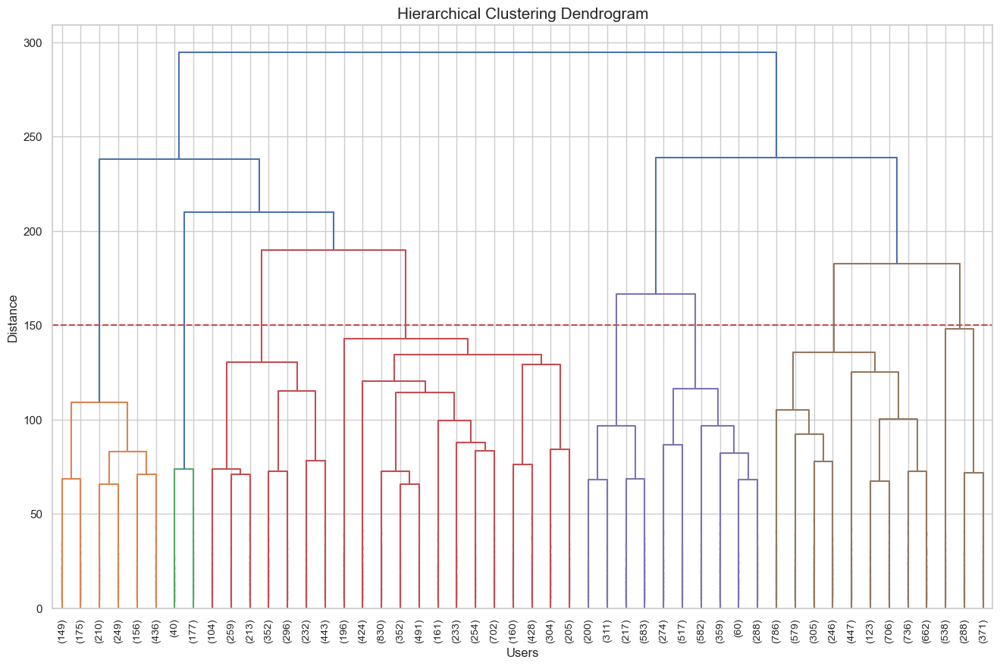

In [269]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt
import numpy as np

# Use PCA-reduced data for hierarchical clustering
X = pca_df.drop(columns=['pid']).values

# Compute linkage matrix
plt.figure(figsize=(16, 10))
Z = linkage(X, method='ward')

# Plot dendrogram to visualize hierarchy
plt.title('Hierarchical Clustering Dendrogram', fontsize=15)
plt.xlabel('Users', fontsize=12)
plt.ylabel('Distance', fontsize=12)

# If dataset is large, use truncated dendrogram
if X.shape[0] > 100:
    # Show only last p merges
    p = 50  
    dendrogram(
        Z,
        truncate_mode='lastp',
        p=p,
        leaf_font_size=10.,
        show_contracted=True
    )
else:
    dendrogram(Z, leaf_font_size=10.)
    
plt.axhline(y=150, color='r', linestyle='--')  # Suggested cut-off for clusters
plt.show()


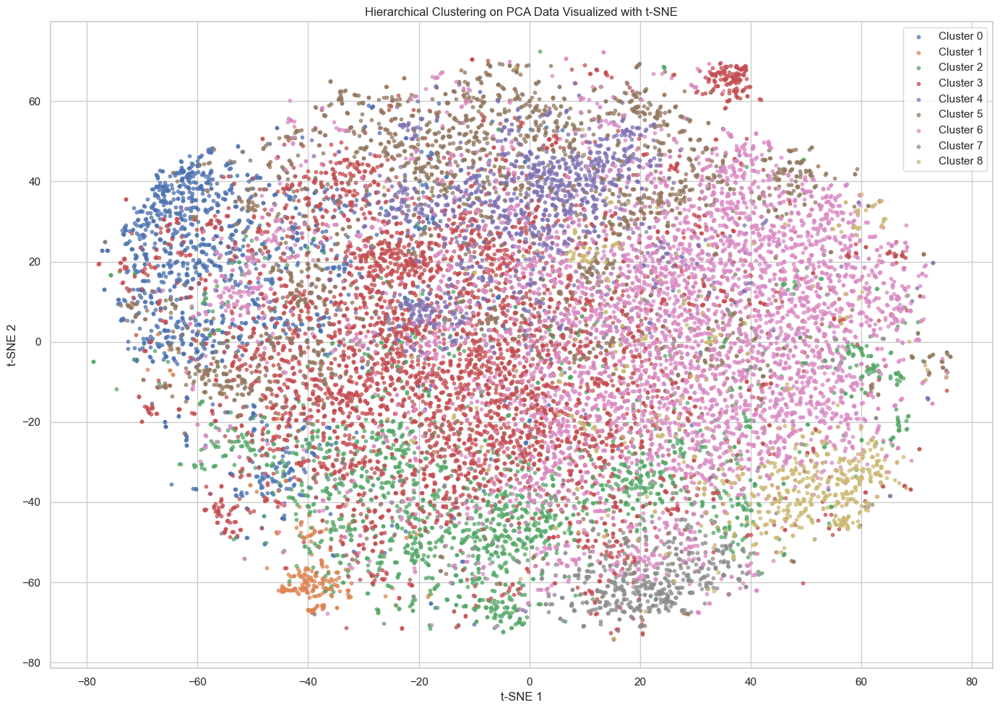

In [277]:
# Get cluster assignments directly from the linkage matrix
from scipy.cluster.hierarchy import fcluster
hierarchical_labels = fcluster(Z, 148, criterion='distance') - 1  # Using distance cutoff of 150 instead of maxclust

# Add hierarchical cluster labels
user_hierarchical_clusters = pd.DataFrame({
    'pid': pca_df['pid'],
    'hierarchical_cluster': hierarchical_labels
})

# Get t-SNE data for visualization with more efficient merge
tsne_with_clusters = tsne_df.merge(user_hierarchical_clusters, on='pid')

# Visualize clusters in 2D t-SNE space
plt.figure(figsize=(14, 10))

# Access columns by name instead of position for clarity and efficiency
for cluster_num in sorted(tsne_with_clusters['hierarchical_cluster'].unique()):
    cluster_data = tsne_with_clusters[tsne_with_clusters['hierarchical_cluster'] == cluster_num]
    plt.scatter(
        cluster_data['TSNE1'],  # Use column name instead of position
        cluster_data['TSNE2'],  # Use column name instead of position
        label=f'Cluster {cluster_num}',
        alpha=0.7,
        s=10
    )

plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.title(f'Hierarchical Clustering on PCA Data Visualized with t-SNE')
plt.legend()
plt.tight_layout()
plt.show()

In [279]:

# Get cluster statistics
hierarchical_features = user_features.merge(user_hierarchical_clusters, on='pid')
hierarchical_stats = hierarchical_features.groupby('hierarchical_cluster').agg({
    'avg_daily_window': 'mean',
    'avg_time': 'mean',
    'avg_first_meal': 'mean',
    'avg_last_meal': 'mean',
    'meal_time_regularity': 'mean',
    'protein_morning_evening_ratio': 'mean',
    'early_morning': 'mean',
    'evening': 'mean',
    'PROTEIN FOODS': 'mean',
    'VEGETABLES': 'mean'
}).reset_index()

print("Hierarchical Cluster Statistics:")
display(hierarchical_stats)



Hierarchical Cluster Statistics:


,hierarchical_cluster,avg_daily_window,avg_time,avg_first_meal,avg_last_meal,meal_time_regularity,protein_morning_evening_ratio,early_morning,evening,PROTEIN FOODS,VEGETABLES
0,0,8.959622,12.700535,8.296812,17.256434,0.884876,11.878338,30.053453,8.652325,17.482341,13.803943
1,1,6.549627,12.626253,9.136945,15.686573,0.594110,1.275576,35.814401,14.101588,5.070145,2.914341
2,2,9.202295,14.423028,9.764291,18.966586,0.557444,1.948544,20.180879,26.325118,13.799023,8.978953
3,3,10.344990,13.731570,8.630405,18.975395,0.683155,2.928008,27.109972,23.059447,15.296528,11.282712
4,4,11.350310,14.217391,8.534472,19.884783,0.850332,2.395156,23.083201,27.600080,15.152118,18.723212
5,5,9.470140,14.042465,9.168853,18.638993,0.626640,3.989277,20.199960,22.627240,23.168450,20.675825
6,6,9.368954,15.121844,10.302086,19.671040,0.591730,1.788985,11.655028,29.504298,16.327982,14.471747
7,7,10.551277,15.220929,9.596209,20.147485,0.540139,1.568961,17.829026,33.564467,14.897198,10.005532
8,8,10.874753,16.393085,10.777435,21.652188,0.378526,1.035614,13.147330,26.466793,15.997217,13.182230


In [280]:
user_hierarchical_clusters

,pid,hierarchical_cluster
0,alqt150211047,0
1,alqt150211119,3
2,alqt150211143,5
3,alqt150211144,2
4,alqt150211157,3
...,...,...
17404,alqt230434241004,6
17405,alqt230438241283,6
17406,alqt230453243867,4
17407,alqt230542245394,8


In [281]:
# Save hierarchical clusters
os.makedirs('clusters', exist_ok=True)
user_hierarchical_clusters.to_csv('clusters/hierarchical_user_clusters_9.csv', index=False)

##  Two-Stage Clustering (Time-based then Food-based)

In [285]:
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Stage 1: Cluster based on temporal features only
temporal_features = [
    'avg_time', 'time_std', 
    'early_morning', 'midday', 'evening', 'night',
    'avg_first_meal', 'avg_last_meal', 'avg_daily_window', 'meal_time_regularity',
    'evening_eating_ratio'
]

# Extract temporal features and scale them
X_temporal = scaled_df[temporal_features].values

# Determine optimal number of temporal clusters using silhouette score
max_clusters = 10
silhouette_scores = []

for k in range(2, max_clusters + 1):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_temporal)
    score = silhouette_score(X_temporal, labels)
    silhouette_scores.append(score)
    print(f"Temporal Clusters K={k}, Silhouette Score={score:.4f}")

# Get optimal k for temporal clustering
temporal_k = silhouette_scores.index(max(silhouette_scores)) + 2
print(f"Optimal number of temporal clusters: {temporal_k}")


Temporal Clusters K=2, Silhouette Score=0.2213
Temporal Clusters K=3, Silhouette Score=0.1915
Temporal Clusters K=4, Silhouette Score=0.1977
Temporal Clusters K=5, Silhouette Score=0.1864
Temporal Clusters K=6, Silhouette Score=0.1608
Temporal Clusters K=7, Silhouette Score=0.1599
Temporal Clusters K=8, Silhouette Score=0.1529
Temporal Clusters K=9, Silhouette Score=0.1481
Temporal Clusters K=10, Silhouette Score=0.1477
Optimal number of temporal clusters: 2


In [289]:
user_features['pid'].values

array(['alqt150211047', 'alqt150211119', 'alqt150211143', ...,
       'alqt230453243867', 'alqt230542245394', 'alqt230941256543'],
      shape=(17409,), dtype=object)

In [291]:
temporal_k = 4
# Perform temporal clustering
temporal_kmeans = KMeans(n_clusters=temporal_k, random_state=42, n_init=10)
temporal_labels = temporal_kmeans.fit_predict(X_temporal)

# Create DataFrame with user IDs and temporal cluster
user_temporal_clusters = pd.DataFrame({
    'pid': user_features['pid'].values,
    'temporal_cluster': temporal_labels
})

# Describe temporal clusters
user_temporal_data = user_features.merge(user_temporal_clusters, on='pid')
temporal_profiles = user_temporal_data.groupby('temporal_cluster')[temporal_features].mean()
print("\nTemporal Cluster Profiles:")
display(temporal_profiles)



Temporal Cluster Profiles:


,avg_time,time_std,early_morning,midday,evening,night,avg_first_meal,avg_last_meal,avg_daily_window,meal_time_regularity,evening_eating_ratio
temporal_cluster,,,,,,,,,,,
0,14.939376,3.760813,9.721535,36.480367,28.262330,1.509561,10.647620,19.072622,8.425002,0.579517,0.297719
1,14.036356,4.600990,25.989929,26.278043,26.952100,2.014385,8.412608,19.590429,11.177821,0.692376,0.289665
2,16.331271,4.567755,10.784650,24.200562,33.023902,10.849303,10.748881,21.266849,10.517968,0.441477,0.438732
3,12.737030,3.938024,31.438325,31.084967,11.811730,0.476930,8.373718,17.314076,8.940358,0.792840,0.122887


In [293]:
user_ids = user_features['pid']
# Stage 2: For each temporal cluster, cluster based on food category features
food_features = [col for col in scaled_df.columns if col in [
    'ALCOHOLIC BEVERAGES', 'BEVERAGES', 'CONDIMENTS AND SAUCES',
    'FATS AND OILS', 'FRUIT', 'GRAINS', 'MILK AND DAIRY',
    'MIXED DISHES', 'OTHER', 'PROTEIN FOODS', 'SNACKS AND SWEETS',
    'SUGARS', 'VEGETABLES', 'WATER', 'category_diversity'
]]

# Initialize dictionary to store subclusters
subclusters = {}
all_user_clusters = []

# For each temporal cluster, find food-based subclusters
for temporal_cluster in range(temporal_k):
    # Get users in this temporal cluster
    temporal_users = user_temporal_clusters[user_temporal_clusters['temporal_cluster'] == temporal_cluster]
    user_indices = temporal_users.index.tolist()
    
    # Skip if too few users in cluster (less than 10)
    if len(user_indices) < 10:
        print(f"Skipping food clustering for temporal cluster {temporal_cluster} - too few users ({len(user_indices)})")
        for idx in user_indices:
            all_user_clusters.append({
                'pid': user_ids.iloc[idx],
                'temporal_cluster': temporal_cluster,
                'food_cluster': -1  # -1 indicates no food subcluster
            })
        continue
    
    # Extract food features for users in this temporal cluster
    X_food = scaled_df.iloc[user_indices][food_features].values
    
    # Determine optimal number of food clusters for this temporal group
    food_silhouette = []
    max_food_clusters = min(8, len(user_indices) // 5)  # Limit max clusters based on group size
    max_food_clusters = max(2, max_food_clusters)  # At least 2 clusters
    
    for k in range(2, max_food_clusters + 1):
        if len(user_indices) <= k:  # Skip if not enough users
            continue
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(X_food)
        score = silhouette_score(X_food, labels)
        food_silhouette.append(score)
        print(f"Temporal {temporal_cluster}, Food K={k}, Silhouette={score:.4f}")
    
    # Get optimal k for food clustering
    if food_silhouette:
        food_k = food_silhouette.index(max(food_silhouette)) + 2
    else:
        food_k = 2  # Default if couldn't calculate scores
    
    print(f"For temporal cluster {temporal_cluster}: Optimal food clusters = {food_k}")
    
    # Perform food clustering for this temporal group
    food_kmeans = KMeans(n_clusters=food_k, random_state=42, n_init=10)
    food_labels = food_kmeans.fit_predict(X_food)
    
    # Store food cluster centers
    subclusters[temporal_cluster] = {
        'centers': food_kmeans.cluster_centers_,
        'n_clusters': food_k
    }
    
    # Add results to all_user_clusters
    for i, idx in enumerate(user_indices):
        all_user_clusters.append({
            'pid': user_ids.iloc[idx],
            'temporal_cluster': temporal_cluster,
            'food_cluster': food_labels[i]
        })

# Convert to DataFrame
two_stage_clusters = pd.DataFrame(all_user_clusters)

# Create composite cluster label
two_stage_clusters['cluster_label'] = two_stage_clusters['temporal_cluster'].astype(str) + '.' + two_stage_clusters['food_cluster'].astype(str)

# Merge with original features for analysis
full_clusters = user_features.merge(two_stage_clusters, on='pid')


Temporal 0, Food K=2, Silhouette=0.1038
Temporal 0, Food K=3, Silhouette=0.0798
Temporal 0, Food K=4, Silhouette=0.0784
Temporal 0, Food K=5, Silhouette=0.0814
Temporal 0, Food K=6, Silhouette=0.0839
Temporal 0, Food K=7, Silhouette=0.0841
Temporal 0, Food K=8, Silhouette=0.0839
For temporal cluster 0: Optimal food clusters = 2
Temporal 1, Food K=2, Silhouette=0.0947
Temporal 1, Food K=3, Silhouette=0.0848
Temporal 1, Food K=4, Silhouette=0.0868
Temporal 1, Food K=5, Silhouette=0.0915
Temporal 1, Food K=6, Silhouette=0.0984
Temporal 1, Food K=7, Silhouette=0.0958
Temporal 1, Food K=8, Silhouette=0.1018
For temporal cluster 1: Optimal food clusters = 8
Temporal 2, Food K=2, Silhouette=0.0984
Temporal 2, Food K=3, Silhouette=0.1087
Temporal 2, Food K=4, Silhouette=0.0962
Temporal 2, Food K=5, Silhouette=0.1009
Temporal 2, Food K=6, Silhouette=0.1071
Temporal 2, Food K=7, Silhouette=0.0999
Temporal 2, Food K=8, Silhouette=0.1014
For temporal cluster 2: Optimal food clusters = 3
Temporal 3


Composite Cluster Statistics (Top 10 clusters by user count):


,cluster_label,avg_daily_window,avg_time,PROTEIN FOODS,VEGETABLES,GRAINS,SNACKS AND SWEETS,protein_morning_evening_ratio,evening_eating_ratio,num_users
0,3.0,9.150555,12.790432,18.669556,15.733415,8.971948,6.227661,8.663840,0.119556,2678
1,0.0,8.540291,14.955710,18.681203,19.412617,8.400060,6.262515,2.150451,0.296144,2584
2,0.1,8.290446,14.920313,15.973782,10.512943,11.827967,10.632514,2.027858,0.299557,2214
3,3.1,8.537705,12.634734,13.051971,7.883657,11.803944,8.343209,4.899967,0.129266,1398
4,1.2,11.126294,14.097912,13.894650,8.854359,12.784978,12.234873,2.043328,0.291963,1336
5,1.3,11.099636,14.119395,21.291545,21.422487,7.178369,5.419654,2.219585,0.295826,1190
6,1.1,11.182807,14.014695,15.339338,13.718981,12.382401,7.964801,2.206746,0.284840,1125
7,2.1,10.438597,16.268461,13.031735,9.129408,12.476440,13.310119,0.967503,0.429122,1033
8,2.2,10.531285,16.390988,18.430431,18.521853,8.050915,6.071237,0.850636,0.443632,1025
9,1.5,11.307108,13.917634,12.235138,10.193468,12.685045,6.955496,1.989606,0.277400,879


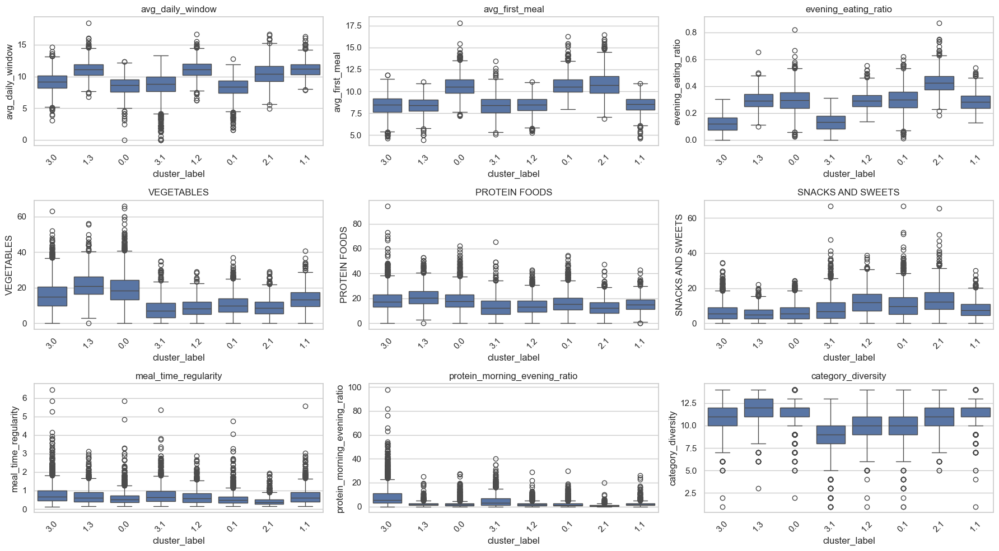

In [294]:

# Analyze major cluster patterns
composite_stats = full_clusters.groupby('cluster_label').agg({
    'avg_daily_window': 'mean',
    'avg_time': 'mean',
    'PROTEIN FOODS': 'mean',
    'VEGETABLES': 'mean',
    'GRAINS': 'mean',
    'SNACKS AND SWEETS': 'mean',
    'protein_morning_evening_ratio': 'mean',
    'evening_eating_ratio': 'mean',
    'pid': 'count'  # Number of users in each cluster
}).sort_values('pid', ascending=False).reset_index()

composite_stats = composite_stats.rename(columns={'pid': 'num_users'})
print("\nComposite Cluster Statistics (Top 10 clusters by user count):")
display(composite_stats.head(10))

# Show full cluster summary with relevant eating patterns
plt.figure(figsize=(18, 10))

# Choose 9 key metrics for visualization
metrics = ['avg_daily_window', 'avg_first_meal', 'evening_eating_ratio', 
           'VEGETABLES', 'PROTEIN FOODS', 'SNACKS AND SWEETS', 
           'meal_time_regularity', 'protein_morning_evening_ratio', 'category_diversity']

# Get the top clusters by user count (e.g., top 8)
top_clusters = composite_stats.head(8)['cluster_label'].tolist()
cluster_data = full_clusters[full_clusters['cluster_label'].isin(top_clusters)]

# Create subplot for each metric
for i, metric in enumerate(metrics, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(x='cluster_label', y=metric, data=cluster_data)
    plt.title(metric)
    plt.xticks(rotation=45)
    
plt.tight_layout()
plt.show()


In [295]:

# Save two-stage clustering results
two_stage_clusters.to_csv('clusters/two_stage_clusters.csv', index=False)

## DBSCAN Clustering for Detecting Natural Density-Based Clusters

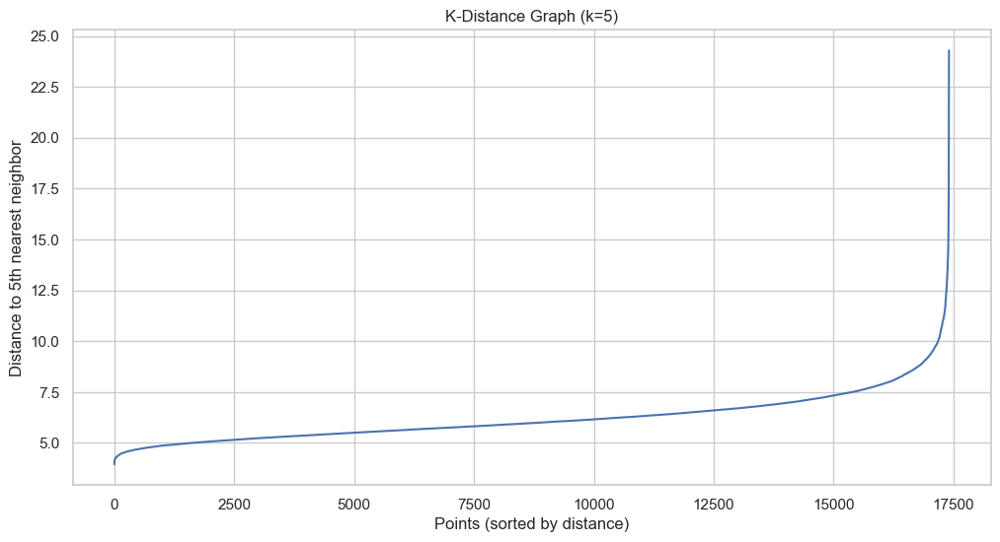

In [296]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Use PCA-reduced data for DBSCAN
X = pca_df.drop(columns=['pid']).values

# Find optimal epsilon (eps) parameter for DBSCAN
# Use k-distance graph to find the "elbow"
k = 5  # number of nearest neighbors to consider
nbrs = NearestNeighbors(n_neighbors=k).fit(X)
distances, indices = nbrs.kneighbors(X)
distances = np.sort(distances[:, k-1])  # Sort distances to kth neighbor

# Plot k-distance graph
plt.figure(figsize=(12, 6))
plt.plot(range(len(distances)), distances)
plt.title(f'K-Distance Graph (k={k})')
plt.xlabel('Points (sorted by distance)')
plt.ylabel(f'Distance to {k}th nearest neighbor')
plt.grid(True)


In [297]:

# Find the "elbow" point - where the curve starts to flatten
# This is a bit subjective and might require visual inspection
from sklearn.cluster import KneeLocator
kneedle = KneeLocator(
    range(len(distances)), 
    distances, 
    S=1.0,
    curve='convex',
    direction='increasing'
)

elbow_position = kneedle.knee
if elbow_position is not None:
    elbow_value = distances[elbow_position]
    plt.axvline(x=elbow_position, color='r', linestyle='--')
    plt.axhline(y=elbow_value, color='r', linestyle='--')
    plt.annotate(f'Elbow: eps ≈ {elbow_value:.2f}', 
                xy=(elbow_position, elbow_value),
                xytext=(elbow_position + len(distances)//20, elbow_value + 0.2),
                arrowprops=dict(arrowstyle='->'))
    optimal_eps = elbow_value
else:
    # If automatic detection fails, choose a default
    optimal_eps = np.percentile(distances, 90) / 3

plt.show()

print(f"Suggested eps value for DBSCAN: {optimal_eps:.4f}")


ImportError: cannot import name 'KneeLocator' from 'sklearn.cluster' (/Users/vince/miniforge3/envs/ds/lib/python3.12/site-packages/sklearn/cluster/__init__.py)

In [ ]:

# Try different eps values around the suggested value
eps_values = [optimal_eps * 0.7, optimal_eps * 0.85, optimal_eps, 
              optimal_eps * 1.15, optimal_eps * 1.3]
min_samples_values = [3, 5, 10]

results = []
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan_labels = dbscan.fit_predict(X)
        
        # Count number of clusters (excluding noise points labeled as -1)
        n_clusters = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
        n_noise = list(dbscan_labels).count(-1)
        
        # Calculate silhouette score if there are at least 2 clusters and they're not all noise
        if n_clusters >= 2 and n_noise < len(dbscan_labels):
            # Only calculate silhouette for non-noise points
            non_noise_mask = dbscan_labels != -1
            if sum(non_noise_mask) > 1:  # Need at least 2 points
                try:
                    silhouette = silhouette_score(X[non_noise_mask], dbscan_labels[non_noise_mask])
                except:
                    silhouette = np.nan
            else:
                silhouette = np.nan
        else:
            silhouette = np.nan
        
        results.append({
            'eps': eps,
            'min_samples': min_samples,
            'n_clusters': n_clusters,
            'n_noise': n_noise,
            'noise_percentage': n_noise / len(X) * 100,
            'silhouette': silhouette
        })
        
        print(f"eps={eps:.4f}, min_samples={min_samples}: {n_clusters} clusters, "
              f"{n_noise} noise points ({n_noise/len(X)*100:.1f}%), "
              f"silhouette={silhouette if not np.isnan(silhouette) else 'N/A'}")

# Find best parameters based on silhouette score and reasonable noise percentage
results_df = pd.DataFrame(results)
valid_results = results_df[
    (results_df['n_clusters'] >= 3) & 
    (results_df['noise_percentage'] < 30) &
    (~results_df['silhouette'].isna())
]

if not valid_results.empty:
    best_params = valid_results.loc[valid_results['silhouette'].idxmax()]
    best_eps = best_params['eps']
    best_min_samples = int(best_params['min_samples'])
    print(f"\nBest DBSCAN parameters: eps={best_eps:.4f}, min_samples={best_min_samples}")
    print(f"Resulting in {int(best_params['n_clusters'])} clusters with "
          f"{best_params['noise_percentage']:.1f}% noise points and "
          f"silhouette score of {best_params['silhouette']:.4f}")
else:
    # Select reasonable default parameters if no valid results
    reasonable_results = results_df[results_df['n_clusters'] >= 2]
    if not reasonable_results.empty:
        reasonable_idx = reasonable_results['noise_percentage'].idxmin()
        best_params = reasonable_results.loc[reasonable_idx]
        best_eps = best_params['eps']
        best_min_samples = int(best_params['min_samples'])
    else:
        # Fallback values
        best_eps = optimal_eps
        best_min_samples = 5
    
    print(f"\nUsing DBSCAN parameters: eps={best_eps:.4f}, min_samples={best_min_samples}")

# Apply DBSCAN with best parameters
dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
dbscan_labels = dbscan.fit_predict(X)

# Add DBSCAN cluster labels to user data
user_dbscan_clusters = pd.DataFrame({
    'pid': pca_df['pid'],
    'dbscan_cluster': dbscan_labels
})

# Visualize DBSCAN clusters in 3D PCA space
fig = plt.figure(figsize=(14, 12))
ax = fig.add_subplot(111, projection='3d')

# Plot noise points first (cluster = -1)
noise_mask = dbscan_labels == -1
ax.scatter(
    X[noise_mask, 0], 
    X[noise_mask, 1], 
    X[noise_mask, 2],
    c='black',
    marker='x',
    label='Noise',
    alpha=0.3
)

# Plot actual clusters
unique_clusters = set(dbscan_labels) - {-1}  # Remove noise label
for cluster_num in unique_clusters:
    cluster_mask = dbscan_labels == cluster_num
    ax.scatter(
        X[cluster_mask, 0], 
        X[cluster_mask, 1], 
        X[cluster_mask, 2],
        label=f'Cluster {cluster_num}',
        alpha=0.7
    )

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title(f'DBSCAN Clustering (eps={best_eps:.4f}, min_samples={best_min_samples})')
ax.legend()
plt.show()

# Get DBSCAN cluster statistics (excluding noise)
dbscan_features = user_features.merge(user_dbscan_clusters, on='pid')
cluster_counts = dbscan_features['dbscan_cluster'].value_counts()

print("\nDBSCAN Cluster Distribution:")
print(cluster_counts)

# Generate statistics for non-noise clusters
if len(unique_clusters) > 0:
    dbscan_stats = dbscan_features[dbscan_features['dbscan_cluster'] != -1].groupby('dbscan_cluster').agg({
        'eating_window': 'mean',
        'avg_time': 'mean',
        'category_diversity': 'mean',
        'avg_first_meal': 'mean',
        'avg_last_meal': 'mean',
        'meal_time_regularity': 'mean',
        'protein_morning_evening_ratio': 'mean',
        'carbs_morning_evening_ratio': 'mean',
        'evening_eating_ratio': 'mean',
        'PROTEIN FOODS': 'mean',
        'VEGETABLES': 'mean',
        'GRAINS': 'mean',
        'SNACKS AND SWEETS': 'mean'
    }).reset_index()

    print("\nDBSCAN Cluster Statistics (excluding noise):")
    print(dbscan_stats)

# Save DBSCAN clusters
user_dbscan_clusters.to_csv('dbscan_user_clusters.csv', index=False)

## Gaussian Mixture Model (GMM) for Soft Clustering

In [ ]:
from sklearn.mixture import GaussianMixture
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import silhouette_score
import seaborn as sns

# Use PCA-reduced data for GMM
X = pca_df.drop(columns=['pid']).values

# Find optimal number of components using BIC and AIC
max_components = 15
bic_scores = []
aic_scores = []
silhouette_scores = []

for n_components in range(2, max_components + 1):
    gmm = GaussianMixture(n_components=n_components, random_state=42, n_init=5)
    gmm.fit(X)
    
    # Get hard cluster assignments for silhouette score
    labels = gmm.predict(X)
    silhouette_avg = silhouette_score(X, labels)
    
    bic_scores.append(gmm.bic(X))
    aic_scores.append(gmm.aic(X))
    silhouette_scores.append(silhouette_avg)
    
    print(f"GMM Components={n_components}, BIC={gmm.bic(X):.2f}, AIC={gmm.aic(X):.2f}, Silhouette={silhouette_avg:.4f}")

# Plot BIC and AIC scores
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(2, max_components + 1), bic_scores, 'o-')
plt.xlabel('Number of Components')
plt.ylabel('BIC Score')
plt.title('BIC Scores for Different Numbers of Components')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(range(2, max_components + 1), aic_scores, 'o-')
plt.xlabel('Number of Components')
plt.ylabel('AIC Score')
plt.title('AIC Scores for Different Numbers of Components')
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, max_components + 1), silhouette_scores, 'o-')
plt.xlabel('Number of Components')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores for Different Numbers of Components')
plt.grid(True)
plt.show()

# Determine optimal number of components
# We'll use the elbow in BIC/AIC or the highest silhouette score
bic_differences = np.diff(bic_scores)
optimal_components_bic = np.argmax(np.abs(bic_differences)) + 3  # +3 because we start from 2 components and use diff

# Alternative: Use highest silhouette score
optimal_components_silhouette = np.argmax(silhouette_scores) + 2  # +2 because we start from 2

print(f"Optimal components based on BIC elbow: {optimal_components_bic}")
print(f"Optimal components based on silhouette score: {optimal_components_silhouette}")

# Choose the component count (adjust based on results)
optimal_components = optimal_components_silhouette  # Choose one method

# Fit GMM with optimal components
gmm = GaussianMixture(n_components=optimal_components, random_state=42, n_init=10)
gmm.fit(X)

# Get cluster assignments (hard clustering for analysis)
cluster_labels = gmm.predict(X)

# Get probability estimates (soft clustering aspect)
cluster_probabilities = gmm.predict_proba(X)

# Create DataFrame with results
gmm_results = pd.DataFrame({
    'pid': pca_df['pid'],
    'gmm_cluster': cluster_labels
})

# Add probability columns for each cluster
for i in range(optimal_components):
    gmm_results[f'prob_cluster_{i}'] = cluster_probabilities[:, i]

# Visualize the clusters in 3D PCA space
fig = plt.figure(figsize=(14, 12))
ax = fig.add_subplot(111, projection='3d')

for cluster_num in range(optimal_components):
    cluster_mask = cluster_labels == cluster_num
    ax.scatter(
        X[cluster_mask, 0], 
        X[cluster_mask, 1], 
        X[cluster_mask, 2],
        label=f'Cluster {cluster_num}',
        alpha=0.7
    )

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title(f'GMM Clustering with {optimal_components} Components')
ax.legend()
plt.show()

# Analyze the characteristics of each cluster
gmm_features = user_features.merge(gmm_results, on='pid')
gmm_stats = gmm_features.groupby('gmm_cluster').agg({
    'eating_window': 'mean',
    'avg_time': 'mean',
    'category_diversity': 'mean',
    'avg_first_meal': 'mean',
    'avg_last_meal': 'mean',
    'meal_time_regularity': 'mean',
    'protein_morning_evening_ratio': 'mean',
    'carbs_morning_evening_ratio': 'mean',
    'evening_eating_ratio': 'mean',
    'PROTEIN FOODS': 'mean',
    'VEGETABLES': 'mean',
    'GRAINS': 'mean',
    'SNACKS AND SWEETS': 'mean',
    'pid': 'count'  # Count of users per cluster
}).rename(columns={'pid': 'user_count'}).reset_index()

print("\nGMM Cluster Statistics:")
print(gmm_stats)

# Example of how to use the probabilities (users with uncertain assignments)
uncertainty_threshold = 0.6  # Maximum probability threshold to consider "uncertain"
uncertain_users = gmm_results[gmm_results.filter(like='prob_cluster_').max(axis=1) < uncertainty_threshold]
print(f"\nUsers with uncertain cluster assignments (<{uncertainty_threshold*100}% probability): {len(uncertain_users)}")

# Save GMM results
gmm_results.to_csv('gmm_user_clusters.csv', index=False)

## Spectral Clustering for Complex-Shaped Clusters


In [ ]:
from sklearn.cluster import SpectralClustering
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import silhouette_score

# Use PCA-reduced data for spectral clustering
X = pca_df.drop(columns=['pid']).values

# Find optimal number of clusters
max_clusters = 12
silhouette_scores = []

for n_clusters in range(2, max_clusters + 1):
    # Spectral clustering can be computationally expensive, so be careful with large datasets
    # Consider using a subset of data for parameter tuning if dataset is very large
    spectral = SpectralClustering(
        n_clusters=n_clusters,
        random_state=42,
        affinity='nearest_neighbors',  # 'rbf' is another common option
        n_neighbors=10
    )
    
    cluster_labels = spectral.fit_predict(X)
    
    # Calculate silhouette score
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    
    print(f"Spectral Clustering n_clusters={n_clusters}, Silhouette={silhouette_avg:.4f}")

# Plot silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, max_clusters + 1), silhouette_scores, 'o-')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores for Spectral Clustering')
plt.grid(True)
plt.show()

# Determine optimal number of clusters
optimal_n_clusters = np.argmax(silhouette_scores) + 2  # +2 because we start from 2
print(f"Optimal number of clusters for spectral clustering: {optimal_n_clusters}")

# Apply spectral clustering with optimal number of clusters
spectral = SpectralClustering(
    n_clusters=optimal_n_clusters,
    random_state=42,
    affinity='nearest_neighbors',
    n_neighbors=10
)
spectral_labels = spectral.fit_predict(X)

# Add cluster labels to user data
spectral_results = pd.DataFrame({
    'pid': pca_df['pid'],
    'spectral_cluster': spectral_labels
})

# Visualize clusters in 3D PCA space
fig = plt.figure(figsize=(14, 12))
ax = fig.add_subplot(111, projection='3d')

for cluster_num in range(optimal_n_clusters):
    cluster_mask = spectral_labels == cluster_num
    ax.scatter(
        X[cluster_mask, 0], 
        X[cluster_mask, 1], 
        X[cluster_mask, 2],
        label=f'Cluster {cluster_num}',
        alpha=0.7
    )

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title(f'Spectral Clustering with {optimal_n_clusters} Clusters')
ax.legend()
plt.show()

# Analyze cluster characteristics
spectral_features = user_features.merge(spectral_results, on='pid')
spectral_stats = spectral_features.groupby('spectral_cluster').agg({
    'eating_window': 'mean',
    'avg_time': 'mean',
    'avg_first_meal': 'mean',
    'avg_last_meal': 'mean',
    'meal_time_regularity': 'mean',
    'protein_morning_evening_ratio': 'mean',
    'carbs_morning_evening_ratio': 'mean',
    'evening_eating_ratio': 'mean',
    'PROTEIN FOODS': 'mean',
    'VEGETABLES': 'mean',
    'GRAINS': 'mean',
    'SNACKS AND SWEETS': 'mean',
    'pid': 'count'  # Number of users per cluster
}).rename(columns={'pid': 'user_count'}).reset_index()

print("\nSpectral Clustering Statistics:")
print(spectral_stats)

# Save spectral clustering results
spectral_results.to_csv('spectral_user_clusters.csv', index=False)

##  Time Series Clustering with Dynamic Time Warping (DTW)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from fastdtw import fastdtw  # Install with: pip install fastdtw
from tqdm import tqdm  # Progress bar

# For time series clustering, we need to create time series data for each user
# Let's create hourly food consumption patterns for each user

# Define time bins for 24 hours (4am to 4am next day)
# Using 2-hour bins for better representation
time_bins = np.linspace(4, 28, 13)  # 12 bins of 2 hours each
bin_labels = [f"{int(t)}-{int(t+2)}" for t in time_bins[:-1]]

# Function to create time series for a user
def create_user_time_series(user_df):
    # Create binned time series
    user_timeseries = np.zeros(len(bin_labels))
    
    # Count entries in each time bin
    for i, (start, end) in enumerate(zip(time_bins[:-1], time_bins[1:])):
        mask = (user_df['time'] >= start) & (user_df['time'] < end)
        user_timeseries[i] = mask.sum()
    
    # Normalize to get proportion of eating events in each bin
    if user_timeseries.sum() > 0:
        user_timeseries = user_timeseries / user_timeseries.sum()
    
    return user_timeseries

# Create time series for each user
print("Creating time series for each user...")
user_time_series = {}
sample_users = []

# Limit to users with sufficient data (at least 3 days of data)
active_users = user_features[user_features['num_days'] >= 3]['pid'].values

# To limit computation time, we can sample if there are too many users
max_users_for_dtw = 1000  # Adjust based on computational resources
if len(active_users) > max_users_for_dtw:
    print(f"Sampling {max_users_for_dtw} users for DTW clustering (from {len(active_users)} active users)")
    np.random.seed(42)
    sample_users = np.random.choice(active_users, max_users_for_dtw, replace=False)
else:
    sample_users = active_users

# Create time series for each sampled user
for pid in tqdm(sample_users):
    user_df = food_df[food_df['pid'] == pid]
    user_time_series[pid] = create_user_time_series(user_df)

# Create matrix of all user time series
time_series_matrix = np.array([user_time_series[pid] for pid in sample_users])

# Compute DTW distance matrix
print("Computing DTW distance matrix (this may take a while)...")
n_users = len(sample_users)
dtw_matrix = np.zeros((n_users, n_users))

# We'll use fastdtw for speed, but this is still an O(n²) operation
for i in tqdm(range(n_users)):
    for j in range(i+1, n_users):
        distance, _ = fastdtw(time_series_matrix[i], time_series_matrix[j])
        dtw_matrix[i, j] = distance
        dtw_matrix[j, i] = distance

# Apply hierarchical clustering using the DTW distance matrix
print("Applying hierarchical clustering...")
condensed_dtw = squareform(dtw_matrix)
dtw_linkage = linkage(condensed_dtw, method='ward')

# Plot dendrogram
plt.figure(figsize=(16, 10))
plt.title('Hierarchical Clustering Dendrogram (DTW Distance)')
plt.xlabel('Users')
plt.ylabel('Distance')

# If there are many users, truncate the dendrogram
if n_users > 100:
    dendrogram(
        dtw_linkage,
        truncate_mode='lastp',
        p=30,  # Show only last p merged clusters
        leaf_font_size=10,
        show_contracted=True
    )
else:
    dendrogram(dtw_linkage, leaf_font_size=10)

plt.axhline(y=5, color='r', linestyle='--')  # Suggested cut-off for clusters
plt.show()

# Determine number of clusters from dendrogram
n_clusters_dtw = 6  # Adjust based on dendrogram

# Get cluster assignments
dtw_clusters = fcluster(dtw_linkage, n_clusters_dtw, criterion='maxclust')

# Create DataFrame with user IDs and cluster assignments
dtw_results = pd.DataFrame({
    'pid': sample_users,
    'dtw_cluster': dtw_clusters
})

# Visualize time series patterns by cluster
plt.figure(figsize=(16, 12))
for cluster_id in range(1, n_clusters_dtw + 1):
    plt.subplot(n_clusters_dtw, 1, cluster_id)
    
    # Get user indices for this cluster
    cluster_user_indices = np.where(dtw_clusters == cluster_id)[0]
    
    # Plot each user's time series in this cluster (up to 20 for clarity)
    display_users = cluster_user_indices[:min(20, len(cluster_user_indices))]
    
    for user_idx in display_users:
        plt.plot(bin_labels, time_series_matrix[user_idx], 'o-', alpha=0.3, linewidth=1)
    
    # Calculate and plot the mean pattern for this cluster
    cluster_mean = time_series_matrix[cluster_user_indices].mean(axis=0)
    plt.plot(bin_labels, cluster_mean, 'k-', linewidth=3, label=f'Cluster {cluster_id} Mean')
    
    plt.title(f'Cluster {cluster_id} - {len(cluster_user_indices)} Users')
    plt.xticks(rotation=45)
    
    if cluster_id == n_clusters_dtw:  # Only add x-label for the bottom plot
        plt.xlabel('Time of Day')
    
    plt.ylabel('Proportion of Eating Events')
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()

# Analyze characteristics of DTW clusters by merging with user features
dtw_features = user_features.merge(dtw_results, on='pid')
dtw_stats = dtw_features.groupby('dtw_cluster').agg({
    'eating_window': 'mean',
    'avg_time': 'mean',
    'avg_first_meal': 'mean',
    'avg_last_meal': 'mean',
    'meal_time_regularity': 'mean',
    'early_morning': 'mean',
    'midday': 'mean',
    'evening': 'mean',
    'night': 'mean',
    'pid': 'count'  # Users per cluster
}).rename(columns={'pid': 'user_count'}).reset_index()

print("\nDTW Cluster Statistics:")
print(dtw_stats)

# Save DTW clustering results
dtw_results.to_csv('dtw_user_clusters.csv', index=False)

## Ensemble Clustering - Combining Multiple Methods

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load all clustering results (if they were saved to files)
# Otherwise use the DataFrames from the previous cells
try:
    kmeans_results = pd.read_csv('kmeans_user_clusters.csv')
    hierarchical_results = pd.read_csv('hierarchical_user_clusters.csv')
    dbscan_results = pd.read_csv('dbscan_user_clusters.csv')
    gmm_results = pd.read_csv('gmm_user_clusters.csv')
    spectral_results = pd.read_csv('spectral_user_clusters.csv')
    two_stage_results = pd.read_csv('two_stage_clusters.csv')
    # DTW results may not be available for all users
    try:
        dtw_results = pd.read_csv('dtw_user_clusters.csv')
        has_dtw = True
    except:
        has_dtw = False
except:
    # If files don't exist, assume we have the DataFrame objects from previous cells
    pass

# Combine all clustering results
ensemble_df = user_ids.to_frame()  # Start with user IDs

# Merge with each clustering result
ensemble_df = ensemble_df.merge(kmeans_results[['pid', 'cluster']], on='pid', how='left')
ensemble_df = ensemble_df.merge(hierarchical_results[['pid', 'hierarchical_cluster']], on='pid', how='left')
ensemble_df = ensemble_df.merge(dbscan_results[['pid', 'dbscan_cluster']], on='pid', how='left')
ensemble_df = ensemble_df.merge(gmm_results[['pid', 'gmm_cluster']], on='pid', how='left')
ensemble_df = ensemble_df.merge(spectral_results[['pid', 'spectral_cluster']], on='pid', how='left')
ensemble_df = ensemble_df.merge(two_stage_results[['pid', 'temporal_cluster', 'food_cluster']], on='pid', how='left')

if has_dtw:
    ensemble_df = ensemble_df.merge(dtw_results[['pid', 'dtw_cluster']], on='pid', how='left')

# Rename for clarity
ensemble_df = ensemble_df.rename(columns={'cluster': 'kmeans_cluster'})

# Check agreement between different clustering methods
clustering_columns = [
    'kmeans_cluster', 'hierarchical_cluster', 'dbscan_cluster', 
    'gmm_cluster', 'spectral_cluster', 'temporal_cluster'
]

if has_dtw:
    clustering_columns.append('dtw_cluster')

# Initialize agreement matrices
n_methods = len(clustering_columns)
rand_matrix = np.zeros((n_methods, n_methods))
ami_matrix = np.zeros((n_methods, n_methods))

# Calculate agreement scores
for i, method1 in enumerate(clustering_columns):
    for j, method2 in enumerate(clustering_columns):
        if i == j:
            rand_matrix[i, j] = 1.0
            ami_matrix[i, j] = 1.0
            continue
            
        # Filter out rows with noise clusters (-1)
        valid_rows = (ensemble_df[method1] != -1) & (ensemble_df[method2] != -1)
        
        # If no valid comparisons, skip
        if valid_rows.sum() < 10:
            rand_matrix[i, j] = np.nan
            ami_matrix[i, j] = np.nan
            continue
            
        # Calculate agreement scores
        labels1 = ensemble_df.loc[valid_rows, method1]
        labels2 = ensemble_df.loc[valid_rows, method2]
        
        rand_matrix[i, j] = adjusted_rand_score(labels1, labels2)
        ami_matrix[i, j] = adjusted_mutual_info_score(labels1, labels2)

# Plot agreement matrices
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Plot Adjusted Rand Index
sns.heatmap(
    rand_matrix, 
    annot=True, 
    cmap='coolwarm', 
    xticklabels=clustering_columns, 
    yticklabels=clustering_columns,
    ax=axes[0],
    vmin=0, vmax=1
)
axes[0].set_title('Agreement Between Methods (Adjusted Rand Index)')

# Plot Adjusted Mutual Information
sns.heatmap(
    ami_matrix, 
    annot=True, 
    cmap='coolwarm', 
    xticklabels=clustering_columns, 
    yticklabels=clustering_columns,
    ax=axes[1],
    vmin=0, vmax=1
)
axes[1].set_title('Agreement Between Methods (Adjusted Mutual Information)')

plt.tight_layout()
plt.show()

# Create an ensemble clustering based on voting
# For simplicity, let's use the most consistent methods 
# (those with highest average agreement with others)

# Calculate average agreement for each method
avg_agreement = ami_matrix.mean(axis=1)
method_agreement = pd.DataFrame({
    'method': clustering_columns,
    'avg_agreement': avg_agreement
})
print("Average method agreement scores:")
print(method_agreement.sort_values('avg_agreement', ascending=False))

# Select top methods for ensemble (those with agreement > 0.3)
top_methods = method_agreement[method_agreement['avg_agreement'] > 0.3]['method'].tolist()
if len(top_methods) < 2:
    top_methods = method_agreement.nlargest(3, 'avg_agreement')['method'].tolist()

print(f"\nUsing top methods for ensemble clustering: {top_methods}")

# For each user, find which clusters they belong to in each method
# Then create a "consensus cluster" assignment

# First, normalize cluster numbers to start from 0 for each method
for method in top_methods:
    # Skip if the method has negative values (noise)
    if (ensemble_df[method] < 0).any():
        continue
        
    # Get unique clusters and create mapping
    unique_clusters = ensemble_df[method].dropna().unique()
    cluster_mapping = {old_label: i for i, old_label in enumerate(unique_clusters)}
    
    # Create new column with normalized labels
    ensemble_df[f"{method}_norm"] = ensemble_df[method].map(cluster_mapping)

# Now create a unique "pattern" for each user based on their cluster assignments
# This effectively creates a "meta-cluster"
pattern_columns = [f"{method}_norm" for method in top_methods if f"{method}_norm" in ensemble_df.columns]

if len(pattern_columns) >= 2:
    # Create pattern string (e.g., "0_1_2" means cluster 0 in method 1, cluster 1 in method 2, etc.)
    ensemble_df['cluster_pattern'] = ensemble_df[pattern_columns].astype(str).fillna('nan').agg('_'.join, axis=1)
    
    # Map patterns to ensemble cluster IDs
    unique_patterns = ensemble_df['cluster_pattern'].unique()
    pattern_mapping = {pattern: i for i, pattern in enumerate(unique_patterns)}
    ensemble_df['ensemble_cluster'] = ensemble_df['cluster_pattern'].map(pattern_mapping)
    
    # Count users in each ensemble cluster
    cluster_counts = ensemble_df['ensemble_cluster'].value_counts()
    print("\nEnsemble cluster distribution:")
    print(cluster_counts)
    
    # Merge with user features for analysis
    ensemble_features = user_features.merge(ensemble_df[['pid', 'ensemble_cluster']], on='pid')
    
    # Analyze ensemble clusters
    ensemble_stats = ensemble_features.groupby('ensemble_cluster').agg({
        'eating_window': 'mean',
        'avg_time': 'mean',
        'avg_first_meal': 'mean',
        'avg_last_meal': 'mean',
        'meal_time_regularity': 'mean',
        'protein_morning_evening_ratio': 'mean',
        'carbs_morning_evening_ratio': 'mean',
        'evening_eating_ratio': 'mean',
        'early_morning': 'mean',
        'midday': 'mean',
        'evening': 'mean',
        'night': 'mean',
        'PROTEIN FOODS': 'mean',
        'VEGETABLES': 'mean',
        'GRAINS': 'mean',
        'SNACKS AND SWEETS': 'mean',
        'pid': 'count'  # Users per cluster
    }).rename(columns={'pid': 'user_count'}).reset_index()
    
    # Sort by cluster size
    ensemble_stats = ensemble_stats.sort_values('user_count', ascending=False)
    
    print("\nTop ensemble clusters by user count:")
    print(ensemble_stats.head())
    
    # Visualize key metrics for top clusters
    top_clusters = ensemble_stats.head(6)['ensemble_cluster'].tolist()
    top_cluster_features = ensemble_features[ensemble_features['ensemble_cluster'].isin(top_clusters)]
    
    # Plot key metrics
    key_metrics = [
        'eating_window', 'avg_first_meal', 'avg_last_meal', 
        'PROTEIN FOODS', 'VEGETABLES', 'GRAINS', 'SNACKS AND SWEETS',
        'early_morning', 'midday', 'evening', 'night'
    ]
    
    plt.figure(figsize=(18, 15))
    for i, metric in enumerate(key_metrics, 1):
        plt.subplot(4, 3, i)
        sns.boxplot(x='ensemble_cluster', y=metric, data=top_cluster_features)
        plt.title(metric)
        plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()
    
    # Save ensemble clustering results
    ensemble_results = ensemble_df[['pid', 'ensemble_cluster']]
    ensemble_results.to_csv('ensemble_user_clusters.csv', index=False)
else:
    print("\nNot enough normalized methods available for ensemble clustering")

## Cluster Evaluation and Interpretation

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score

# Choose which clustering method to analyze in detail
# Options: 'kmeans', 'hierarchical', 'dbscan', 'gmm', 'spectral', 'two_stage', 'dtw', 'ensemble'
analysis_method = 'ensemble'  # Change to any method you want to analyze

# Dictionary mapping method names to their column names
method_columns = {
    'kmeans': 'kmeans_cluster',
    'hierarchical': 'hierarchical_cluster',
    'dbscan': 'dbscan_cluster',
    'gmm': 'gmm_cluster',
    'spectral': 'spectral_cluster',
    'two_stage': 'cluster_label',  # Composite label for two-stage
    'dtw': 'dtw_cluster',
    'ensemble': 'ensemble_cluster'
}

# Make sure we have the method available
if analysis_method not in method_columns:
    print(f"Error: Method '{analysis_method}' not found")
else:
    column_name = method_columns[analysis_method]
    
    # Load the appropriate clustering results
    try:
        if analysis_method == 'ensemble':
            cluster_df = pd.read_csv('ensemble_user_clusters.csv')
        elif analysis_method == 'two_stage':
            cluster_df = pd.read_csv('two_stage_clusters.csv')
        else:
            cluster_df = pd.read_csv(f'{analysis_method}_user_clusters.csv')
    except:
        # If file doesn't exist, use the DataFrame from previous cells
        if analysis_method == 'ensemble':
            cluster_df = ensemble_results
        elif analysis_method == 'kmeans':
            cluster_df = user_clusters
        elif analysis_method == 'hierarchical':
            cluster_df = user_hierarchical_clusters
        elif analysis_method == 'dbscan':
            cluster_df = user_dbscan_clusters
        elif analysis_method == 'gmm':
            cluster_df = gmm_results
        elif analysis_method == 'spectral':
            cluster_df = spectral_results
        elif analysis_method == 'two_stage':
            cluster_df = two_stage_clusters
        elif analysis_method == 'dtw':
            cluster_df = dtw_results
    
    # Merge with original features
    if column_name in cluster_df.columns:
        analysis_df = user_features.merge(cluster_df[['pid', column_name]], on='pid')
        
        # Get number of clusters and count per cluster
        cluster_counts = analysis_df[column_name].value_counts().sort_index()
        n_clusters = len(cluster_counts)
        
        # Print summary
        print(f"\n{analysis_method.title()} Clustering Summary:")
        print(f"Number of clusters: {n_clusters}")
        print("Users per cluster:")
        for cluster, count in cluster_counts.items():
            print(f"  Cluster {cluster}: {count} users ({count/len(analysis_df)*100:.1f}%)")
        
        # Calculate internal validation metrics if clusters are labeled with integers
        if pd.api.types.is_numeric_dtype(analysis_df[column_name]) and n_clusters > 1:
            # Filter out any noise points (label -1)
            valid_mask = analysis_df[column_name] >= 0
            if valid_mask.all() or (~valid_mask).sum() < len(analysis_df) * 0.1:  # Less than 10% noise
                # Get features for validation (use PCA
                # Get features for validation (use PCA-reduced data)
                X = pca_df.drop(columns=['pid']).values
                labels = analysis_df[column_name].values
                
                # Filter out noise points
                valid_indices = labels >= 0
                X_valid = X[valid_indices]
                labels_valid = labels[valid_indices]
                
                # Calculate validation metrics
                if len(np.unique(labels_valid)) > 1:  # Make sure we have at least 2 valid clusters
                    ch_score = calinski_harabasz_score(X_valid, labels_valid)
                    db_score = davies_bouldin_score(X_valid, labels_valid)
                    print(f"\nInternal validation metrics:")
                    print(f"  Calinski-Harabasz Index: {ch_score:.2f} (higher is better)")
                    print(f"  Davies-Bouldin Index: {db_score:.2f} (lower is better)")
        
        # Analyze key features for each cluster
        print("\nCluster Profiles:")
        
        # Key features to compare across clusters
        temporal_keys = ['eating_window', 'avg_first_meal', 'avg_last_meal', 
                         'early_morning', 'midday', 'evening', 'night']
        food_keys = ['VEGETABLES', 'PROTEIN FOODS', 'GRAINS', 'SNACKS AND SWEETS', 
                      'FRUIT', 'BEVERAGES', 'MILK AND DAIRY']
        behavior_keys = ['meal_time_regularity', 'category_diversity', 
                         'protein_morning_evening_ratio', 'carbs_morning_evening_ratio', 
                         'evening_eating_ratio']
        
        # Calculate cluster profiles
        cluster_profiles = analysis_df.groupby(column_name).agg({
            **{key: 'mean' for key in temporal_keys + food_keys + behavior_keys},
            'pid': 'count'  # Count users per cluster
        }).rename(columns={'pid': 'user_count'})
        
        # Sort by size
        cluster_profiles = cluster_profiles.sort_values('user_count', ascending=False)
        
        # Display profiles of top clusters
        print(cluster_profiles.head())
        
        # Create descriptive names for clusters based on their characteristics
        cluster_names = {}
        
        for cluster_id, profile in cluster_profiles.iterrows():
            # Determine time pattern
            if profile['early_morning'] > 0.2:
                time_pattern = "Early Risers"
            elif profile['night'] > 0.2:
                time_pattern = "Night Owls"
            elif profile['avg_first_meal'] < 9:
                time_pattern = "Early Starters"
            elif profile['avg_first_meal'] > 11:
                time_pattern = "Late Starters"
            elif profile['avg_last_meal'] > 21:
                time_pattern = "Late Finishers"
            elif profile['eating_window'] < 10:
                time_pattern = "Compressed Eaters"
            elif profile['eating_window'] > 14:
                time_pattern = "Extended Eaters"
            else:
                time_pattern = "Conventional Timing"
            
            # Determine food pattern
            food_values = profile[food_keys]
            top_food = food_keys[food_values.argmax()]
            if top_food == 'VEGETABLES' and profile['VEGETABLES'] > 0.2:
                food_pattern = "Veggie-Centric"
            elif top_food == 'PROTEIN FOODS' and profile['PROTEIN FOODS'] > 0.2:
                food_pattern = "Protein-Focused"
            elif top_food == 'GRAINS' and profile['GRAINS'] > 0.2:
                food_pattern = "Grain-Heavy"
            elif top_food == 'SNACKS AND SWEETS' and profile['SNACKS AND SWEETS'] > 0.15:
                food_pattern = "Snack-Oriented"
            elif profile['category_diversity'] > 8:
                food_pattern = "Diverse Eaters"
            elif profile['category_diversity'] < 6:
                food_pattern = "Limited Variety"
            else:
                food_pattern = "Balanced Mix"
            
            # Combine patterns into a name
            cluster_names[cluster_id] = f"{time_pattern}, {food_pattern}"
        
        print("\nCluster Interpretations:")
        for cluster_id, name in cluster_names.items():
            n_users = cluster_profiles.loc[cluster_id, 'user_count']
            pct = n_users / analysis_df.shape[0] * 100
            print(f"Cluster {cluster_id} ({n_users} users, {pct:.1f}%): {name}")
            
        # Visualize key metrics across clusters
        plt.figure(figsize=(20, 15))
        
        # Plot temporal features
        for i, feature in enumerate(temporal_keys, 1):
            plt.subplot(3, 3, i)
            sns.boxplot(x=column_name, y=feature, data=analysis_df)
            plt.title(feature)
            plt.xticks(rotation=45)
        
        plt.tight_layout()
        plt.savefig(f'{analysis_method}_temporal_features.png')
        plt.show()
        
        # Plot food category features
        plt.figure(figsize=(20, 15))
        for i, feature in enumerate(food_keys, 1):
            plt.subplot(3, 3, i)
            sns.boxplot(x=column_name, y=feature, data=analysis_df)
            plt.title(feature)
            plt.xticks(rotation=45)
        
        plt.tight_layout()
        plt.savefig(f'{analysis_method}_food_features.png')
        plt.show()
        
        # Plot behavioral features
        plt.figure(figsize=(20, 10))
        for i, feature in enumerate(behavior_keys, 1):
            plt.subplot(2, 3, i)
            sns.boxplot(x=column_name, y=feature, data=analysis_df)
            plt.title(feature)
            plt.xticks(rotation=45)
        
        plt.tight_layout()
        plt.savefig(f'{analysis_method}_behavior_features.png')
        plt.show()
    else:
        print(f"Error: Column '{column_name}' not found in cluster results")

## Topic Modeling for Food Consumption Patterns

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import LatentDirichletAllocation, NMF
import matplotlib.pyplot as plt
import seaborn as sns

# We can use topic modeling to find "food consumption themes" in our dataset
# This is an alternative way to analyze patterns without explicit clustering

# Create a user-food category matrix (similar to document-term matrix in NLP)
# We'll use both main_category and secondary_category for more detail

# First, create a combination of main and secondary category
food_df['food_category'] = food_df['main_category'] + ': ' + food_df['secondary_category']

# Create user-food category matrix
user_food_matrix = pd.crosstab(
    food_df['pid'], 
    food_df['food_category'],
    normalize='index'
) * 100  # Convert to percentage

# Fill NAs with 0
user_food_matrix = user_food_matrix.fillna(0)

print(f"User-food category matrix shape: {user_food_matrix.shape}")
print(f"Number of food categories: {user_food_matrix.shape[1]}")

# Apply Latent Dirichlet Allocation
n_topics = 8  # Number of food consumption patterns to find

# Create and fit LDA model
lda = LatentDirichletAllocation(
    n_components=n_topics,
    max_iter=50,
    learning_method='online',
    random_state=42,
    n_jobs=-1
)

user_topics = lda.fit_transform(user_food_matrix)

# Create DataFrame with user-topic assignments
user_topic_df = pd.DataFrame(
    user_topics,
    columns=[f'topic_{i}' for i in range(n_topics)],
    index=user_food_matrix.index
)

# Reset index to make pid a column
user_topic_df = user_topic_df.reset_index()

# For each user, find the dominant topic
user_topic_df['dominant_topic'] = user_topic_df.iloc[:, 1:].idxmax(axis=1)
user_topic_df['dominant_topic_weight'] = user_topic_df.iloc[:, 1:].max(axis=1)

# Analyze topics
topic_terms = {}
for topic_idx in range(n_topics):
    # Sort terms by importance for this topic
    terms_importance = lda.components_[topic_idx]
    sorted_terms_idx = terms_importance.argsort()[::-1]
    top_terms = [user_food_matrix.columns[i] for i in sorted_terms_idx[:10]]
    top_weights = terms_importance[sorted_terms_idx[:10]]
    
    topic_terms[f'topic_{topic_idx}'] = {
        'terms': top_terms,
        'weights': top_weights
    }

# Display topics
print("\nFood Consumption Patterns (Topics):")
for topic, data in topic_terms.items():
    print(f"\n{topic}:")
    for term, weight in zip(data['terms'], data['weights']):
        print(f"  {term}: {weight:.4f}")

# Visualize topics
plt.figure(figsize=(20, 15))
for i, topic in enumerate(topic_terms.keys(), 1):
    plt.subplot(3, 3, i)
    
    terms = topic_terms[topic]['terms'][:8]  # Top 8 for readability
    weights = topic_terms[topic]['weights'][:8]
    
    y_pos = np.arange(len(terms))
    
    plt.barh(y_pos, weights)
    plt.yticks(y_pos, terms)
    plt.title(f'{topic}')
    plt.tight_layout()

plt.savefig('food_topics.png')
plt.show()

# Count users by dominant topic
topic_counts = user_topic_df['dominant_topic'].value_counts()
print("\nUsers per dominant topic:")
print(topic_counts)

# Merge topic data with user features
topic_features = user_features.merge(
    user_topic_df[['pid', 'dominant_topic', 'dominant_topic_weight']], 
    on='pid'
)

# Analyze characteristics by dominant topic
topic_profiles = topic_features.groupby('dominant_topic').agg({
    'eating_window': 'mean',
    'avg_time': 'mean',
    'avg_first_meal': 'mean',
    'avg_last_meal': 'mean',
    'early_morning': 'mean',
    'midday': 'mean',
    'evening': 'mean',
    'night': 'mean',
    'meal_time_regularity': 'mean',
    'dominant_topic_weight': 'mean',
    'pid': 'count'
}).rename(columns={'pid': 'user_count'})

print("\nTopic Profile Summary:")
print(topic_profiles)

# Visualize time patterns by topic
plt.figure(figsize=(16, 8))
time_features = ['avg_first_meal', 'avg_last_meal', 'eating_window']
for i, feature in enumerate(time_features, 1):
    plt.subplot(1, 3, i)
    sns.boxplot(x='dominant_topic', y=feature, data=topic_features)
    plt.title(feature)
    plt.xticks(rotation=45)

plt.tight_layout()
plt.savefig('topic_time_patterns.png')
plt.show()

# Create descriptive names for topics
topic_names = {}
for topic, profile in topic_profiles.iterrows():
    # Get top terms for this topic
    top_terms = topic_terms[topic]['terms'][:3]
    simplified_terms = [term.split(': ')[0] for term in top_terms]
    
    # Create name based on top terms and time pattern
    if profile['early_morning'] > 0.15:
        time_desc = "Morning-Focused"
    elif profile['night'] > 0.15:
        time_desc = "Night-Focused"
    elif profile['midday'] > 0.4:
        time_desc = "Midday-Focused"
    elif profile['evening'] > 0.4:
        time_desc = "Evening-Focused"
    else:
        time_desc = "Balanced Timing"
    
    # Create a concise name
    main_food = simplified_terms[0].title()
    topic_names[topic] = f"{main_food}-Centric, {time_desc}"

print("\nTopic Interpretations:")
for topic, name in topic_names.items():
    n_users = topic_profiles.loc[topic, 'user_count']
    pct = n_users / topic_features.shape[0] * 100
    print(f"{topic} ({n_users} users, {pct:.1f}%): {name}")

# Save topic assignments
user_topic_df[['pid', 'dominant_topic', 'dominant_topic_weight']].to_csv('user_food_topics.csv', index=False)

## Comparison of Clustering Methods and Final Analysis

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# Load all clustering results
cluster_files = {
    'kmeans': 'kmeans_user_clusters.csv',
    'hierarchical': 'hierarchical_user_clusters.csv',
    'dbscan': 'dbscan_user_clusters.csv',
    'gmm': 'gmm_user_clusters.csv',
    'spectral': 'spectral_user_clusters.csv',
    'two_stage': 'two_stage_clusters.csv',
    'ensemble': 'ensemble_user_clusters.csv',
    'topics': 'user_food_topics.csv'
}

method_columns = {
    'kmeans': 'kmeans_cluster',
    'hierarchical': 'hierarchical_cluster',
    'dbscan': 'dbscan_cluster',
    'gmm': 'gmm_cluster',
    'spectral': 'spectral_cluster',
    'two_stage': 'cluster_label',
    'ensemble': 'ensemble_cluster',
    'topics': 'dominant_topic'
}

# Try to load each clustering result
clustering_results = {}
for method, file in cluster_files.items():
    try:
        clustering_results[method] = pd.read_csv(file)
    except:
        print(f"Could not load {file}")

# Calculate silhouette scores for each method using the PCA-reduced data
X = pca_df.drop(columns=['pid']).values
silhouette_scores = {}

for method, result_df in clustering_results.items():
    column = method_columns[method]
    if column in result_df.columns:
        # Merge with PCA data to get features
        merged = pca_df.merge(result_df[['pid', column]], on='pid')
        
        # Get labels
        labels = merged[column].values
        
        # Skip if all noise or only one cluster
        unique_labels = np.unique(labels)
        if len(unique_labels) <= 1 or (len(unique_labels) == 2 and -1 in unique_labels):
            silhouette_scores[method] = np.nan
            continue
            
        # Filter out noise points if present
        valid_mask = labels >= 0
        if not valid_mask.all():
            X_valid = X[valid_mask]
            labels_valid = labels[valid_mask]
        else:
            X_valid = X
            labels_valid = labels
            
        # Calculate silhouette score
        try:
            score = silhouette_score(X_valid, labels_valid)
            silhouette_scores[method] = score
        except:
            silhouette_scores[method] = np.nan

# Plot silhouette scores
plt.figure(figsize=(12, 6))
valid_scores = {k: v for k, v in silhouette_scores.items() if not np.isnan(v)}
methods = list(valid_scores.keys())
scores = list(valid_scores.values())

plt.bar(methods, scores)
plt.ylabel('Silhouette Score')
plt.xlabel('Clustering Method')
plt.title('Silhouette Scores by Clustering Method')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('clustering_comparison.png')
plt.show()

# Find the method with highest silhouette score
if valid_scores:
    best_method = max(valid_scores.items(), key=lambda x: x[1])[0]
    print(f"\nBest clustering method based on silhouette score: {best_method}")
    print(f"Silhouette score: {valid_scores[best_method]:.4f}")

# Count clusters and users per method
method_stats = {}
for method, result_df in clustering_results.items():
    column = method_columns[method]
    if column in result_df.columns:
        # Count clusters (excluding noise)
        labels = result_df[column].values
        valid_labels = labels[labels >= 0] if (labels < 0).any() else labels
        n_clusters = len(np.unique(valid_labels))
        
        # Count users per cluster
        cluster_counts = result_df[column].value_counts()
        mean_users = cluster_counts.mean()
        min_users = cluster_counts.min()
        max_users = cluster_counts.max()
        
        method_stats[method] = {
            'n_clusters': n_clusters,
            'mean_users': mean_users,
            'min_users': min_users,
            'max_users': max_users
        }

# Display stats
print("\nClustering Method Statistics:")
stats_df = pd.DataFrame.from_dict(method_stats, orient='index')
if not stats_df.empty:
    print(stats_df)

# Provide summary and recommendations
print("\n===== Final Analysis and Recommendations =====")
print("\n1. Best Methods for Circadian Nutrition Pattern Analysis:")

# Recommend based on silhouette score and interpretability
if valid_scores:
    top_methods = sorted(valid_scores.items(), key=lambda x: x[1], reverse=True)[:3]
    for method, score in top_methods:
        print(f"  - {method.title()}: Silhouette score {score:.4f}")

print("\n2. Key Nutrition Pattern Insights:")

# Choose the best method for final insights
final_method = best_method if 'best_method' in locals() else 'ensemble'
if final_method in clustering_results:
    final_df = clustering_results[final_method]
    final_column = method_columns[final_method]
    
    if final_column in final_df.columns:
        # Merge with user features
        final_analysis = user_features.merge(final_df[['pid', final_column]], on='pid')
        
        # Get cluster stats
        cluster_stats = final_analysis.groupby(final_column).agg({
            'eating_window': 'mean',
            'avg_first_meal': 'mean',
            'avg_last_meal': 'mean',
            'meal_time_regularity': 'mean',
            'PROTEIN FOODS': 'mean',
            'VEGETABLES': 'mean',
            'GRAINS': 'mean',
            'SNACKS AND SWEETS': 'mean',
            'evening_eating_ratio': 'mean',
            'pid': 'count'
        }).rename(columns={'pid': 'user_count'})
        
        # Sort by user count
        cluster_stats = cluster_stats.sort_values('user_count', ascending=False)
        
        # Identify key patterns
        for i, (cluster, stats) in enumerate(cluster_stats.iterrows()):
            if i >= 5:  # Limit to top 5 clusters
                break
                
            # Create description
            n_users = int(stats['user_count'])
            pct = n_users / len(final_analysis) * 100
            
            # Time pattern
            if stats['avg_first_meal'] < 8.5:
                time_pattern = "early-starting"
            elif stats['avg_first_meal'] > 10.5:
                time_pattern = "late-starting"
            else:
                time_pattern = "conventional timing"
                
            if stats['eating_window'] < 10:
                window_pattern = "compressed eating window"
            elif stats['eating_window'] > 14:
                window_pattern = "extended eating window"
            else:
                window_pattern = "moderate eating window"
            
            # Food pattern
            food_keys = ['PROTEIN FOODS', 'VEGETABLES', 'GRAINS', 'SNACKS AND SWEETS']
            food_values = [stats[key] for key in food_keys]
            top_food_idx = np.argmax(food_values)
            top_food = food_keys[top_food_idx].lower()
            
            print(f"  - Cluster {cluster} ({n_users} users, {pct:.1f}%): {time_pattern}, {window_pattern}, {top_food}-focused")

print("\n3. Recommendations for Further Analysis:")
print("  - Correlate identified clusters with sleep patterns from your additional dataset")
print("  - Conduct longitudinal analysis to assess how eating patterns change over time")
print("  - Investigate the relationship between meal timing regularity and other health metrics")
print("  - Develop personalized nutrition recommendations based on cluster characteristics")
print("  - Perform demographic analysis within clusters to identify age or gender-specific patterns")

In [ ]:

# Map clusters back to original users
user_clusters = pd.DataFrame({
    'pid': pca_clustered['pid'],
    'cluster': pca_clustered['cluster']
})

# Add cluster info to original features for analysis
user_features_with_clusters = user_features.merge(user_clusters, on='pid')

# Get cluster statistics to understand patterns
cluster_stats = user_features_with_clusters.groupby('cluster').agg({
    'eating_window': 'mean',
    'avg_time': 'mean',
    'category_diversity': 'mean',
    'avg_first_meal': 'mean',
    'avg_last_meal': 'mean',
    'meal_time_regularity': 'mean',
    'protein_morning_evening_ratio': 'mean',
    'carbs_morning_evening_ratio': 'mean',
    'evening_eating_ratio': 'mean'
}).reset_index()

print("Cluster Statistics:")
print(cluster_stats)

# Save user clusters
user_clusters.to_csv('kmeans_user_clusters.csv', index=False)

# Optional: Create an enhanced visualization with annotated clusters
plt.figure(figsize=(16, 14))

# Plot t-SNE with clusters
ax = sns.scatterplot(
    x='TSNE1',
    y='TSNE2',
    hue='cluster',
    palette='viridis',
    data=tsne_clustered,
    alpha=0.7,
    s=80
)

# Add annotations for each cluster centroid
for i, centroid in centroids_tsne.iterrows():
    cluster_num = centroid['cluster']
    
    # Get top 3 distinguishing features for this cluster
    cluster_data = cluster_stats[cluster_stats['cluster'] == cluster_num].iloc[0].drop('cluster')
    # Find features where this cluster has highest values compared to others
    distinguishing_features = cluster_data.sort_values(ascending=False).index[:3].tolist()
    
    # Format annotation text
    annotation = f"Cluster {cluster_num}\n" + "\n".join([f"{feat}: {cluster_data[feat]:.2f}" for feat in distinguishing_features])
    
    # Add annotation with arrow pointing to centroid
    plt.annotate(
        annotation,
        xy=(centroid['TSNE1'], centroid['TSNE2']),
        xytext=(centroid['TSNE1'] + 5, centroid['TSNE2'] + 5),
        fontsize=11,
        bbox=dict(boxstyle="round,pad=0.5", fc="white", alpha=0.8),
        arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=0.2")
    )

plt.title(f'K-means Clustering (k={optimal_k}) on t-SNE with Key Cluster Features', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.tight_layout()
plt.show()


Applying t-SNE for visualization (this might take a while)...


/Users/vince/miniforge3/envs/ds/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Done.

Visualizing clusters using first two t-SNE components:


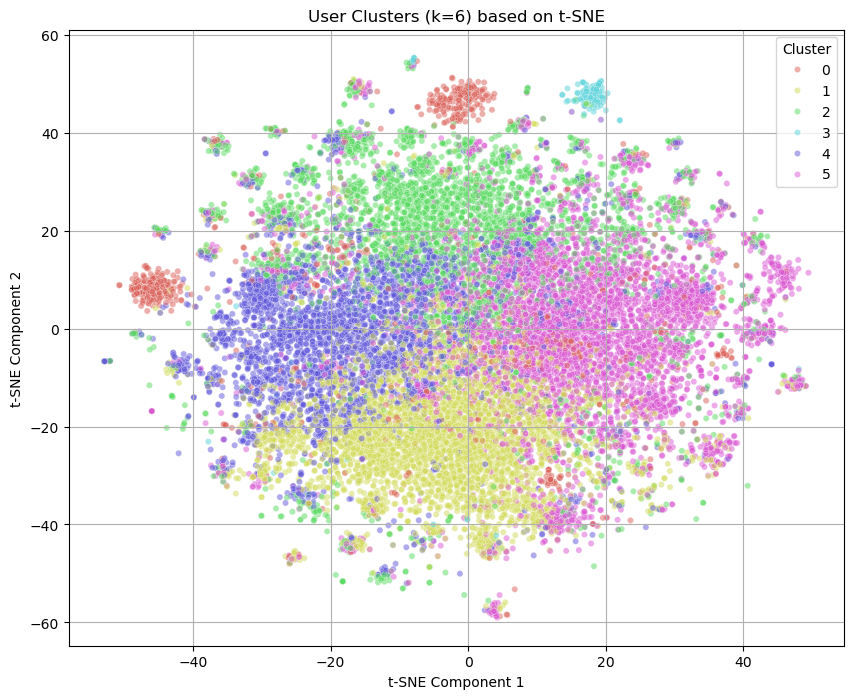


Cluster assignments head:


,pid,cluster
pid,,
alqt150211047,alqt150211047,1
alqt150211119,alqt150211119,4
alqt150211143,alqt150211143,1
alqt150211144,alqt150211144,5
alqt150211157,alqt150211157,2


In [ ]:
# --- Visualize Clusters using t-SNE ---

# Apply t-SNE for visualization (on scaled data)
# t-SNE is computationally intensive, especially on large datasets/high dimensions.
# Consider using a subset or PCA-reduced data first if it's too slow.
# Common perplexity values are between 5 and 50.
print("\nApplying t-SNE for visualization (this might take a while)...")
tsne = TSNE(n_components=2, perplexity=50, n_iter=1000, random_state=42)
features_tsne = tsne.fit_transform(features_scaled) 
print("Done.")

color_palette = sns.color_palette("hls", 6)

# Visualize clusters using the two t-SNE components
print("\nVisualizing clusters using first two t-SNE components:")
plt.figure(figsize=(10, 8))
sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=cluster_labels, 
                palette=color_palette, alpha=0.5, s=20) # Adjusted alpha/size for potentially dense plots
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title(f'User Clusters (k={chosen_k}) based on t-SNE')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

# Display the first few rows of the cluster assignments
print("\nCluster assignments head:")
display(clusters_df.head())

# You can now use 'clusters_df' to analyze the characteristics of each cluster
# For example, merge it back with user_features_df or original food_df
# user_features_with_clusters = user_features_df.join(clusters_df['cluster'])
# display(user_features_with_clusters.groupby('cluster').mean()) # Analyze mean features per cluster


Visualizing clusters using first two t-SNE components:


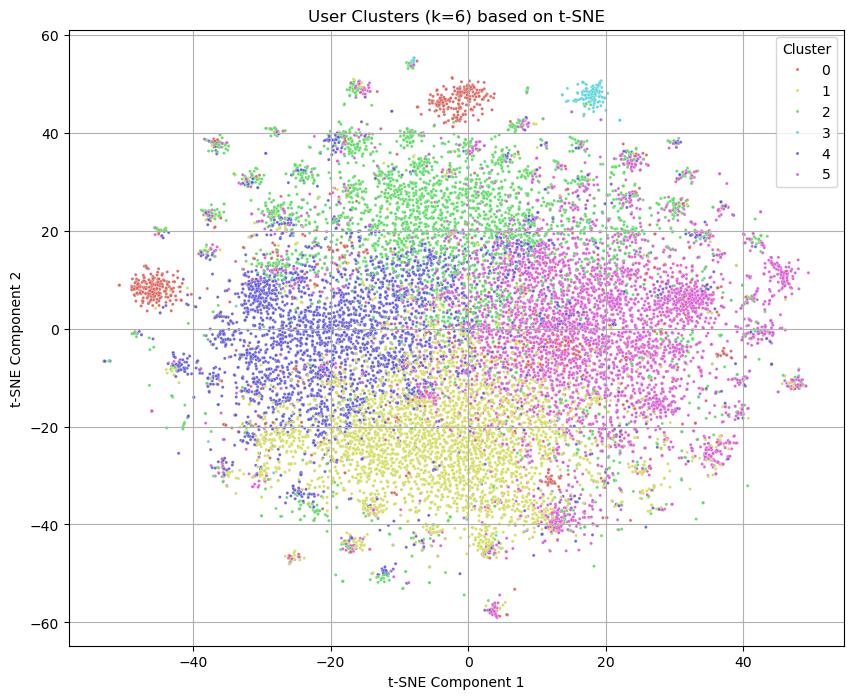

In [ ]:
# Visualize clusters using the two t-SNE components
print("\nVisualizing clusters using first two t-SNE components:")
plt.figure(figsize=(10, 8))
sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=cluster_labels, 
                palette=color_palette, alpha=0.9, s=5) # Adjusted alpha/size for potentially dense plots
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title(f'User Clusters (k={chosen_k}) based on t-SNE')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


Applying t-SNE for visualization (this might take a while)...


/Users/vince/miniforge3/envs/ds/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Done.

Visualizing clusters using first two t-SNE components:


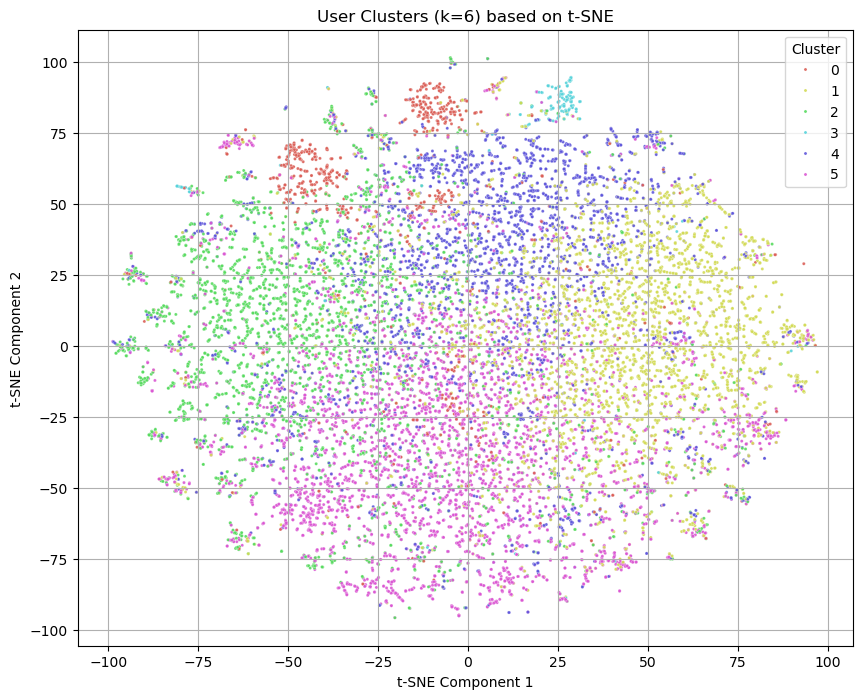

In [ ]:
# --- Visualize Clusters using t-SNE ---

# Apply t-SNE for visualization (on scaled data)
# t-SNE is computationally intensive, especially on large datasets/high dimensions.
# Consider using a subset or PCA-reduced data first if it's too slow.
# Common perplexity values are between 5 and 50.
print("\nApplying t-SNE for visualization (this might take a while)...")
tsne = TSNE(n_components=2, perplexity=5, n_iter=1000, random_state=42)
features_tsne = tsne.fit_transform(features_scaled) 
print("Done.")

color_palette = sns.color_palette("hls", 6)

# Visualize clusters using the two t-SNE components
print("\nVisualizing clusters using first two t-SNE components:")
plt.figure(figsize=(10, 8))
sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=cluster_labels, 
                palette=color_palette, alpha=0.9, s=5) # Adjusted alpha/size for potentially dense plots
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title(f'User Clusters (k={chosen_k}) based on t-SNE')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()



Applying t-SNE for visualization (this might take a while)...


/Users/vince/miniforge3/envs/ds/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Done.

Visualizing clusters using first two t-SNE components:


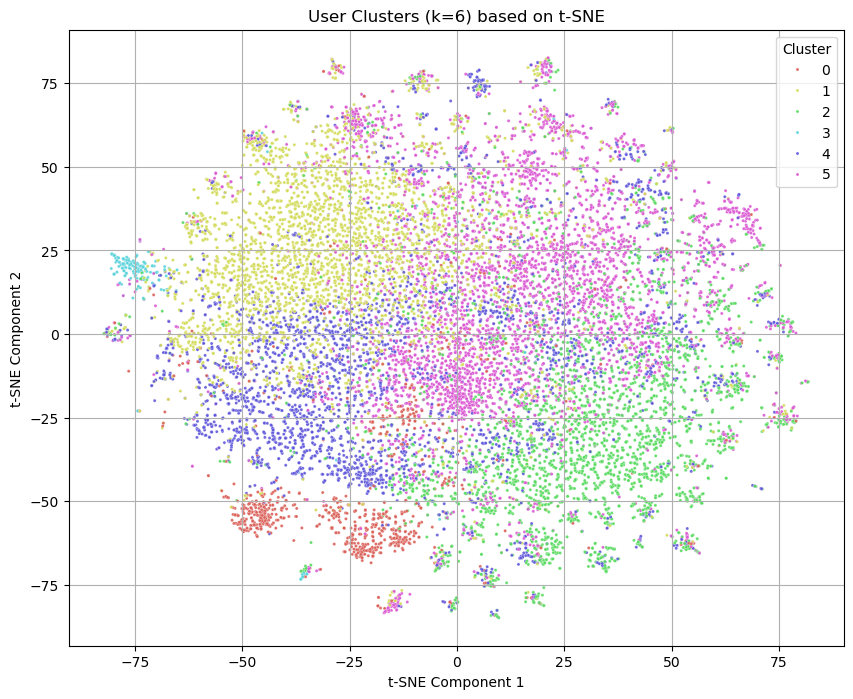

In [ ]:
# --- Visualize Clusters using t-SNE ---

# Apply t-SNE for visualization (on scaled data)
# t-SNE is computationally intensive, especially on large datasets/high dimensions.
# Consider using a subset or PCA-reduced data first if it's too slow.
# Common perplexity values are between 5 and 50.
print("\nApplying t-SNE for visualization (this might take a while)...")
tsne = TSNE(n_components=2, perplexity=15, n_iter=1000, random_state=42)
features_tsne = tsne.fit_transform(features_scaled) 
print("Done.")

color_palette = sns.color_palette("hls", 6)

# Visualize clusters using the two t-SNE components
print("\nVisualizing clusters using first two t-SNE components:")
plt.figure(figsize=(10, 8))
sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=cluster_labels, 
                palette=color_palette, alpha=0.9, s=5) # Adjusted alpha/size for potentially dense plots
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title(f'User Clusters (k={chosen_k}) based on t-SNE')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()



Applying t-SNE for visualization (this might take a while)...


/Users/vince/miniforge3/envs/ds/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Done.

Visualizing clusters using first two t-SNE components:


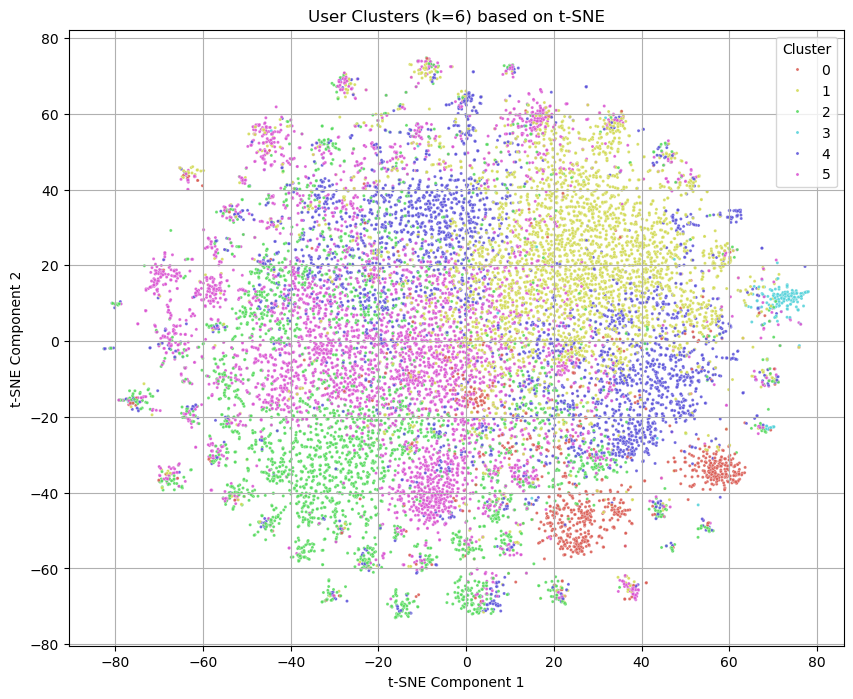

In [ ]:
# --- Visualize Clusters using t-SNE ---

# Apply t-SNE for visualization (on scaled data)
# t-SNE is computationally intensive, especially on large datasets/high dimensions.
# Consider using a subset or PCA-reduced data first if it's too slow.
# Common perplexity values are between 5 and 50.
print("\nApplying t-SNE for visualization (this might take a while)...")
tsne = TSNE(n_components=2, perplexity=20, n_iter=1000, random_state=42)
features_tsne = tsne.fit_transform(features_scaled) 
print("Done.")

color_palette = sns.color_palette("hls", 6)

# Visualize clusters using the two t-SNE components
print("\nVisualizing clusters using first two t-SNE components:")
plt.figure(figsize=(10, 8))
sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=cluster_labels, 
                palette=color_palette, alpha=0.9, s=5) # Adjusted alpha/size for potentially dense plots
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title(f'User Clusters (k={chosen_k}) based on t-SNE')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()



Applying t-SNE for visualization (this might take a while)...


/Users/vince/miniforge3/envs/ds/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Done.

Visualizing clusters using first two t-SNE components:


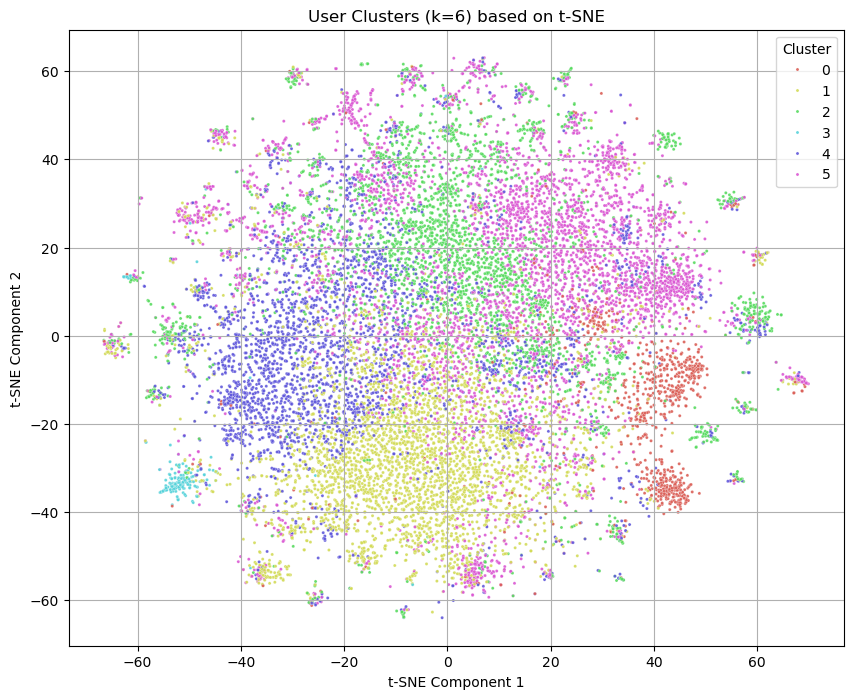

In [ ]:
# --- Visualize Clusters using t-SNE ---

# Apply t-SNE for visualization (on scaled data)
# t-SNE is computationally intensive, especially on large datasets/high dimensions.
# Consider using a subset or PCA-reduced data first if it's too slow.
# Common perplexity values are between 5 and 50.
print("\nApplying t-SNE for visualization (this might take a while)...")
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
features_tsne = tsne.fit_transform(features_scaled) 
print("Done.")

color_palette = sns.color_palette("hls", 6)

# Visualize clusters using the two t-SNE components
print("\nVisualizing clusters using first two t-SNE components:")
plt.figure(figsize=(10, 8))
sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=cluster_labels, 
                palette=color_palette, alpha=0.9, s=5) # Adjusted alpha/size for potentially dense plots
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title(f'User Clusters (k={chosen_k}) based on t-SNE')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()



Applying t-SNE for visualization (this might take a while)...


/Users/vince/miniforge3/envs/ds/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Done.

Visualizing clusters using first two t-SNE components:


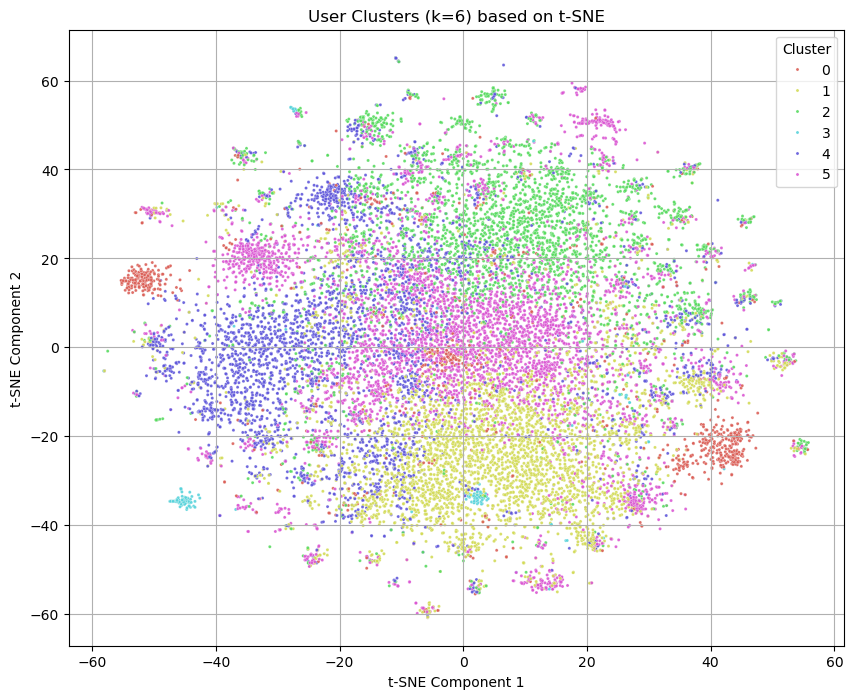

In [ ]:
# --- Visualize Clusters using t-SNE ---

# Apply t-SNE for visualization (on scaled data)
# t-SNE is computationally intensive, especially on large datasets/high dimensions.
# Consider using a subset or PCA-reduced data first if it's too slow.
# Common perplexity values are between 5 and 50.
print("\nApplying t-SNE for visualization (this might take a while)...")
tsne = TSNE(n_components=2, perplexity=40, n_iter=1000, random_state=42)
features_tsne = tsne.fit_transform(features_scaled) 
print("Done.")

color_palette = sns.color_palette("hls", 6)

# Visualize clusters using the two t-SNE components
print("\nVisualizing clusters using first two t-SNE components:")
plt.figure(figsize=(10, 8))
sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=cluster_labels, 
                palette=color_palette, alpha=0.9, s=5) # Adjusted alpha/size for potentially dense plots
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title(f'User Clusters (k={chosen_k}) based on t-SNE')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()



Applying t-SNE for visualization (this might take a while)...


/Users/vince/miniforge3/envs/ds/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Done.

Visualizing clusters using first two t-SNE components:


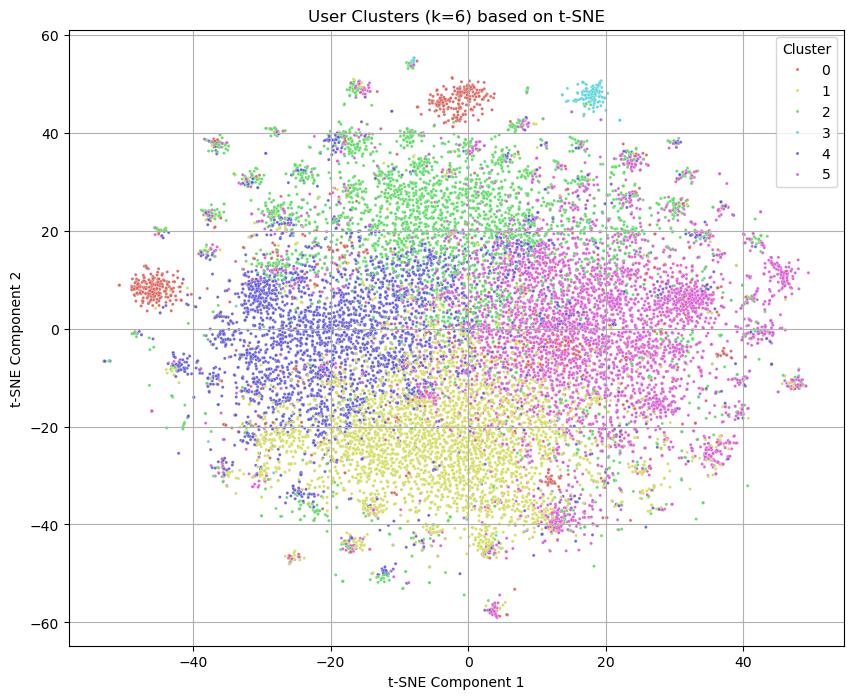

In [ ]:
# --- Visualize Clusters using t-SNE ---

# Apply t-SNE for visualization (on scaled data)
# t-SNE is computationally intensive, especially on large datasets/high dimensions.
# Consider using a subset or PCA-reduced data first if it's too slow.
# Common perplexity values are between 5 and 50.
print("\nApplying t-SNE for visualization (this might take a while)...")
tsne = TSNE(n_components=2, perplexity=50, n_iter=1000, random_state=42)
features_tsne = tsne.fit_transform(features_scaled) 
print("Done.")

color_palette = sns.color_palette("hls", 6)

# Visualize clusters using the two t-SNE components
print("\nVisualizing clusters using first two t-SNE components:")
plt.figure(figsize=(10, 8))
sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=cluster_labels, 
                palette=color_palette, alpha=0.9, s=5) # Adjusted alpha/size for potentially dense plots
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title(f'User Clusters (k={chosen_k}) based on t-SNE')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()



Visualizing clusters using first two t-SNE components:


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_90570/2442249996.py:6: UserWarning: The palette list has more values (10) than needed (6), which may not be intended.
  sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=cluster_labels,


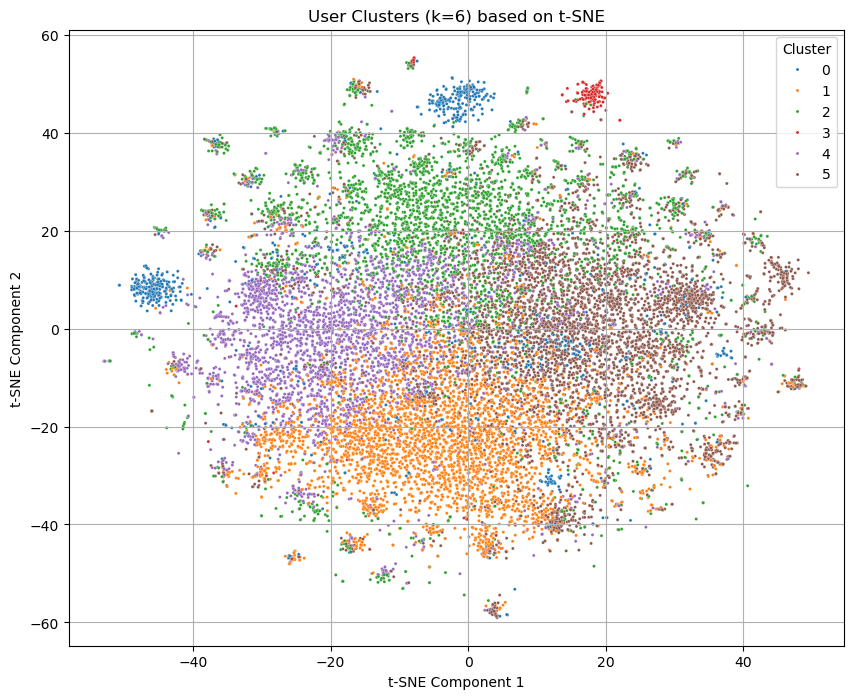

In [ ]:
color_palette = sns.color_palette("tab10")

# Visualize clusters using the two t-SNE components
print("\nVisualizing clusters using first two t-SNE components:")
plt.figure(figsize=(10, 8))
sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=cluster_labels, 
                palette=color_palette, alpha=1.0, s=5) # Adjusted alpha/size for potentially dense plots
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title(f'User Clusters (k={chosen_k}) based on t-SNE')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

In [ ]:
demo_df = pd.read_csv('data/user_demographics.csv')
demo_df

,gender,age,working_hours,age_group,pid
0,female,44.0,Flexible Schedule,Between 40 and 60,alqt150211047
1,female,29.0,Regular Work Hours Between 8AM-5PM,Under 40,alqt150211119
2,male,19.0,Regular Work Hours Between 8AM-5PM,Under 40,alqt150211143
3,male,21.0,Regular Work Hours Between 8AM-5PM,Under 40,alqt150211144
4,male,60.0,Regular Work Hours Between 8AM-5PM,Between 40 and 60,alqt150211157
...,...,...,...,...,...
21001,female,51.0,Unknown,Between 40 and 60,alqt230542245394
21002,male,35.0,Unknown,Under 40,alqt230845254234
21003,male,38.0,Unknown,Under 40,alqt230856254132
21004,female,44.0,Unknown,Between 40 and 60,alqt230857254072


In [ ]:
demo_df = demo_df[demo_df['pid'].isin(eligible['pid'])]

In [ ]:
demo_df['working_hours'].value_counts()

working_hours
Regular Work Hours Between 8AM-5PM    6793
Flexible Schedule                     5309
Long Work Hours                       2307
Unknown                               1708
Rotating Shift                         531
Morning Shift                          349
Evening Shift                          173
Night Shift                             58
Name: count, dtype: int64


Visualizing clusters using first two t-SNE components:


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_90570/3468609123.py:6: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=demo_df['gender'],


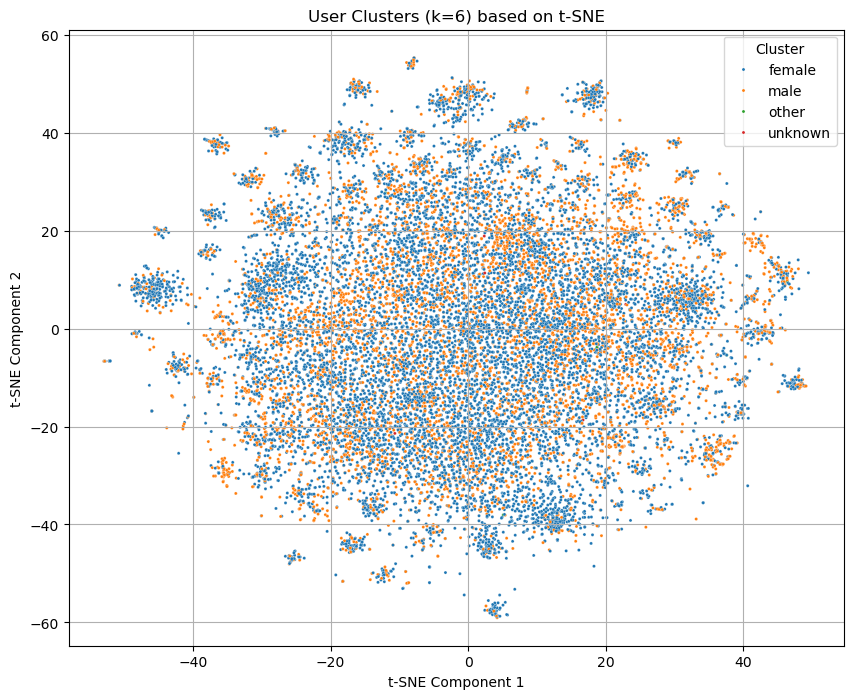

In [ ]:
color_palette = sns.color_palette("tab10")

# Visualize clusters using the two t-SNE components
print("\nVisualizing clusters using first two t-SNE components:")
plt.figure(figsize=(10, 8))
sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=demo_df['gender'], 
                palette=color_palette, alpha=1.0, s=5) # Adjusted alpha/size for potentially dense plots
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title(f'User Clusters (k={chosen_k}) based on t-SNE')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


Visualizing clusters using first two t-SNE components:


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_90570/192228728.py:6: UserWarning: The palette list has more values (10) than needed (8), which may not be intended.
  sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=demo_df['working_hours'],


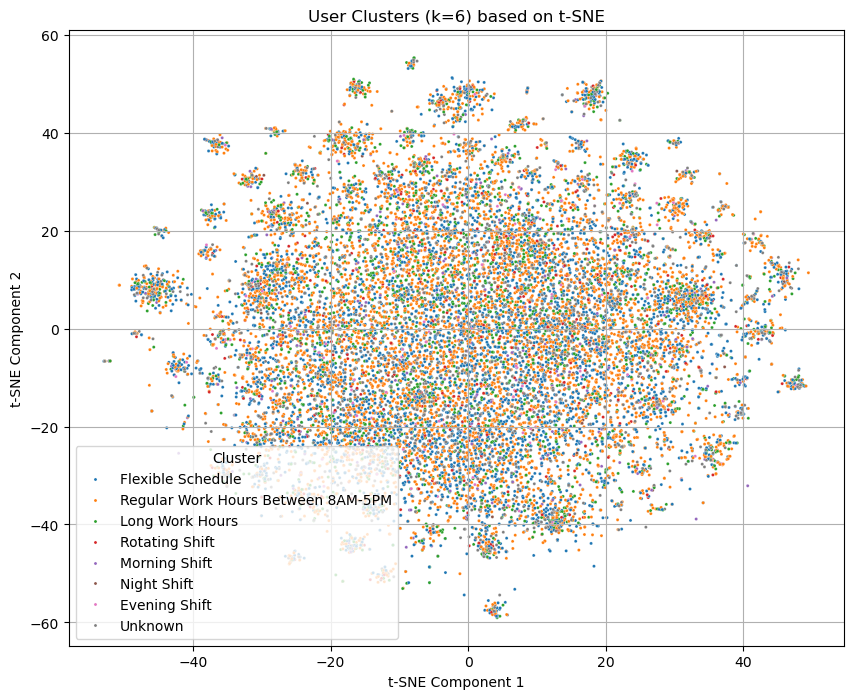

In [ ]:
color_palette = sns.color_palette("tab10")

# Visualize clusters using the two t-SNE components
print("\nVisualizing clusters using first two t-SNE components:")
plt.figure(figsize=(10, 8))
sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=demo_df['working_hours'], 
                palette=color_palette, alpha=1.0, s=5) # Adjusted alpha/size for potentially dense plots
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title(f'User Clusters (k={chosen_k}) based on t-SNE')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

In [ ]:
demo_df

,gender,age,working_hours,age_group,pid
0,female,44.0,Flexible Schedule,Between 40 and 60,alqt150211047
1,female,29.0,Regular Work Hours Between 8AM-5PM,Under 40,alqt150211119
2,male,19.0,Regular Work Hours Between 8AM-5PM,Under 40,alqt150211143
3,male,21.0,Regular Work Hours Between 8AM-5PM,Under 40,alqt150211144
4,male,60.0,Regular Work Hours Between 8AM-5PM,Between 40 and 60,alqt150211157
...,...,...,...,...,...
20997,male,32.0,Unknown,Under 40,alqt230434241004
20998,female,30.0,Unknown,Under 40,alqt230438241283
20999,female,54.0,Unknown,Between 40 and 60,alqt230453243867
21001,female,51.0,Unknown,Between 40 and 60,alqt230542245394



Visualizing clusters using first two t-SNE components:


/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_90570/3804503074.py:6: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=demo_df['age_group'],


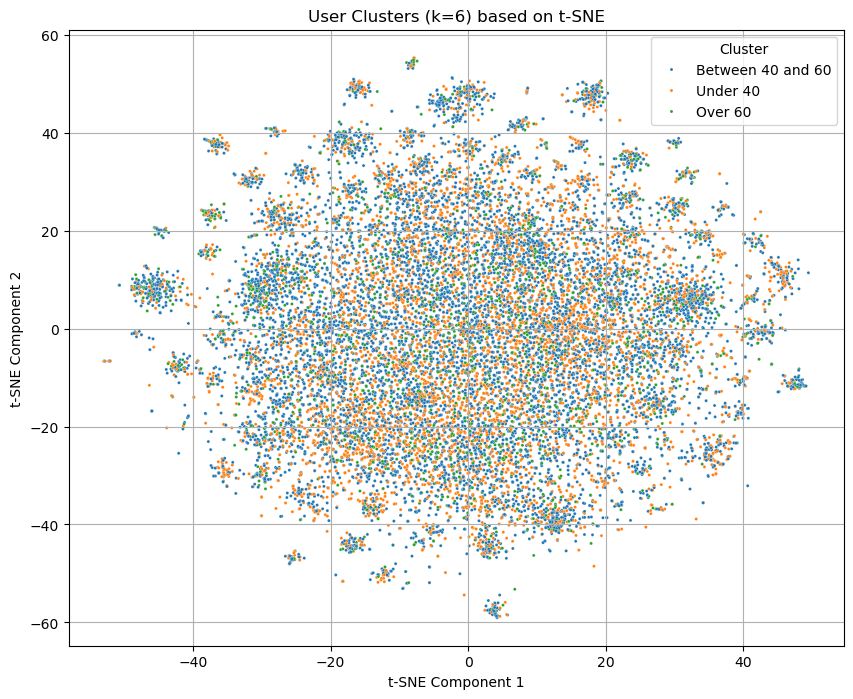

In [ ]:
color_palette = sns.color_palette("tab10")

# Visualize clusters using the two t-SNE components
print("\nVisualizing clusters using first two t-SNE components:")
plt.figure(figsize=(10, 8))
sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=demo_df['age_group'], 
                palette=color_palette, alpha=1.0, s=5) # Adjusted alpha/size for potentially dense plots
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title(f'User Clusters (k={chosen_k}) based on t-SNE')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

In [ ]:
demo_df['cluster'] = cluster_labels

/var/folders/dv/lndb9rrs2kv2v5g8cyfyx0wr0000gn/T/ipykernel_90570/152525225.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  demo_df['cluster'] = cluster_labels


In [ ]:
demo_df

,gender,age,working_hours,age_group,pid,cluster
0,female,44.0,Flexible Schedule,Between 40 and 60,alqt150211047,1
1,female,29.0,Regular Work Hours Between 8AM-5PM,Under 40,alqt150211119,4
2,male,19.0,Regular Work Hours Between 8AM-5PM,Under 40,alqt150211143,1
3,male,21.0,Regular Work Hours Between 8AM-5PM,Under 40,alqt150211144,5
4,male,60.0,Regular Work Hours Between 8AM-5PM,Between 40 and 60,alqt150211157,2
...,...,...,...,...,...,...
20997,male,32.0,Unknown,Under 40,alqt230434241004,5
20998,female,30.0,Unknown,Under 40,alqt230438241283,5
20999,female,54.0,Unknown,Between 40 and 60,alqt230453243867,5
21001,female,51.0,Unknown,Between 40 and 60,alqt230542245394,1


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_demographics_by_cluster(demo_df):
    """
    Analyze demographic distributions by cluster.
    
    Parameters:
    -----------
    demo_df : pandas.DataFrame
        DataFrame containing demographic data with 'cluster' column
        
    Returns:
    --------
    dict
        Dictionary containing analysis results
    """
    results = {}
    
    # Get unique clusters
    clusters = sorted(demo_df['cluster'].unique())
    
    # 1. Gender distribution by cluster
    gender_by_cluster = {}
    for cluster in clusters:
        cluster_data = demo_df[demo_df['cluster'] == cluster]
        gender_counts = cluster_data['gender'].value_counts()
        gender_percentages = (gender_counts / len(cluster_data) * 100).round(2)
        
        gender_by_cluster[cluster] = {
            'counts': gender_counts.to_dict(),
            'percentages': gender_percentages.to_dict(),
            'total': len(cluster_data)
        }
    
    # 2. Age group distribution by cluster
    age_group_by_cluster = {}
    for cluster in clusters:
        cluster_data = demo_df[demo_df['cluster'] == cluster]
        age_group_counts = cluster_data['age_group'].value_counts()
        age_group_percentages = (age_group_counts / len(cluster_data) * 100).round(2)
        
        age_group_by_cluster[cluster] = {
            'counts': age_group_counts.to_dict(),
            'percentages': age_group_percentages.to_dict(),
            'total': len(cluster_data)
        }
    
    # 3. Working hours distribution by cluster
    working_hours_by_cluster = {}
    for cluster in clusters:
        cluster_data = demo_df[demo_df['cluster'] == cluster]
        working_hours_counts = cluster_data['working_hours'].value_counts()
        working_hours_percentages = (working_hours_counts / len(cluster_data) * 100).round(2)
        
        working_hours_by_cluster[cluster] = {
            'counts': working_hours_counts.to_dict(),
            'percentages': working_hours_percentages.to_dict(),
            'total': len(cluster_data)
        }
    
    # 4. Age statistics by cluster
    age_stats_by_cluster = {}
    for cluster in clusters:
        cluster_data = demo_df[demo_df['cluster'] == cluster]
        age_stats = {
            'mean': cluster_data['age'].mean().round(2),
            'median': cluster_data['age'].median(),
            'min': cluster_data['age'].min(),
            'max': cluster_data['age'].max(),
            'std': cluster_data['age'].std().round(2),
            'count': len(cluster_data)
        }
        
        age_stats_by_cluster[cluster] = age_stats
    
    # Store all results
    results = {
        'gender': gender_by_cluster,
        'age_group': age_group_by_cluster,
        'working_hours': working_hours_by_cluster,
        'age_stats': age_stats_by_cluster,
        'clusters': clusters
    }
    
    return results


results = analyze_demographics_by_cluster(demo_df)


In [ ]:

def print_demographic_summary(results):
    """
    Print a formatted summary of demographic results by cluster.
    
    Parameters:
    -----------
    results : dict
        Results dictionary from analyze_demographics_by_cluster
    """
    print("\n===== DEMOGRAPHIC SUMMARY BY CLUSTER =====")
    
    for cluster in results['clusters']:
        print(f"\n----- CLUSTER {cluster} -----")
        print(f"Total members: {results['gender'][cluster]['total']}")
        
        print("\nGENDER DISTRIBUTION:")
        for gender, percentage in results['gender'][cluster]['percentages'].items():
            count = results['gender'][cluster]['counts'][gender]
            print(f"  {gender}: {count} ({percentage}%)")
        
        print("\nAGE GROUP DISTRIBUTION:")
        for age_group, percentage in results['age_group'][cluster]['percentages'].items():
            count = results['age_group'][cluster]['counts'][age_group]
            print(f"  {age_group}: {count} ({percentage}%)")
        
        print("\nWORKING HOURS DISTRIBUTION:")
        for hours, percentage in results['working_hours'][cluster]['percentages'].items():
            count = results['working_hours'][cluster]['counts'][hours]
            print(f"  {hours}: {count} ({percentage}%)")
        
        print("\nAGE STATISTICS:")
        age_stats = results['age_stats'][cluster]
        print(f"  Mean: {age_stats['mean']}")
        print(f"  Median: {age_stats['median']}")
        print(f"  Range: {age_stats['min']} - {age_stats['max']}")
        print(f"  Standard Deviation: {age_stats['std']}")

print_demographic_summary(results)


===== DEMOGRAPHIC SUMMARY BY CLUSTER =====

----- CLUSTER 0 -----
Total members: 1009

GENDER DISTRIBUTION:
  female: 727 (72.05%)
  male: 280 (27.75%)
  other: 1 (0.1%)
  unknown: 1 (0.1%)

AGE GROUP DISTRIBUTION:
  Between 40 and 60: 590 (58.47%)
  Under 40: 289 (28.64%)
  Over 60: 130 (12.88%)

WORKING HOURS DISTRIBUTION:
  Regular Work Hours Between 8AM-5PM: 358 (35.48%)
  Flexible Schedule: 351 (34.79%)
  Long Work Hours: 138 (13.68%)
  Unknown: 101 (10.01%)
  Rotating Shift: 31 (3.07%)
  Morning Shift: 15 (1.49%)
  Evening Shift: 10 (0.99%)
  Night Shift: 5 (0.5%)

AGE STATISTICS:
  Mean: 46.97
  Median: 47.0
  Range: 18.0 - 79.0
  Standard Deviation: 11.8

----- CLUSTER 1 -----
Total members: 4022

GENDER DISTRIBUTION:
  female: 2852 (70.91%)
  male: 1160 (28.84%)
  other: 5 (0.12%)
  unknown: 1 (0.02%)

AGE GROUP DISTRIBUTION:
  Between 40 and 60: 1918 (47.69%)
  Under 40: 1621 (40.3%)
  Over 60: 479 (11.91%)

WORKING HOURS DISTRIBUTION:
  Regular Work Hours Between 8AM-5PM: 1

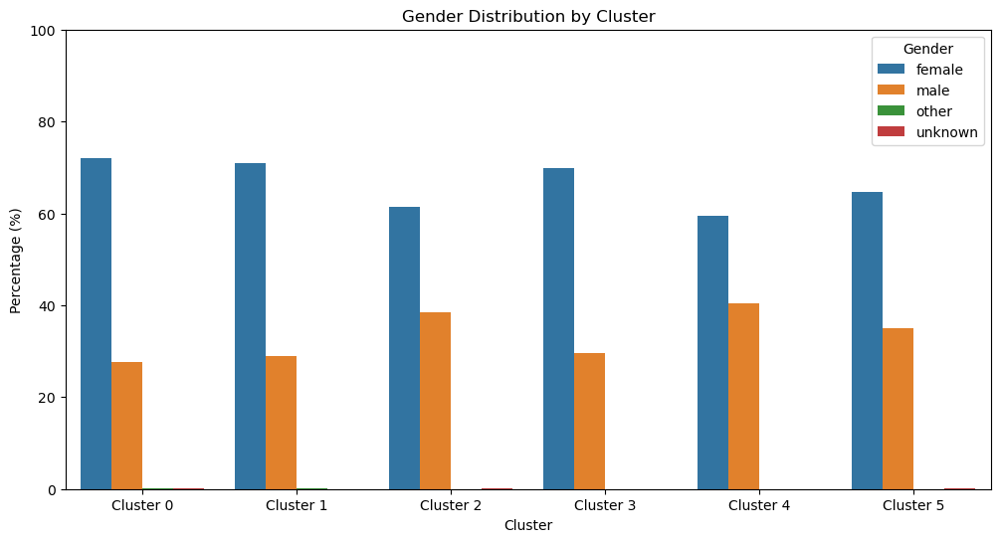

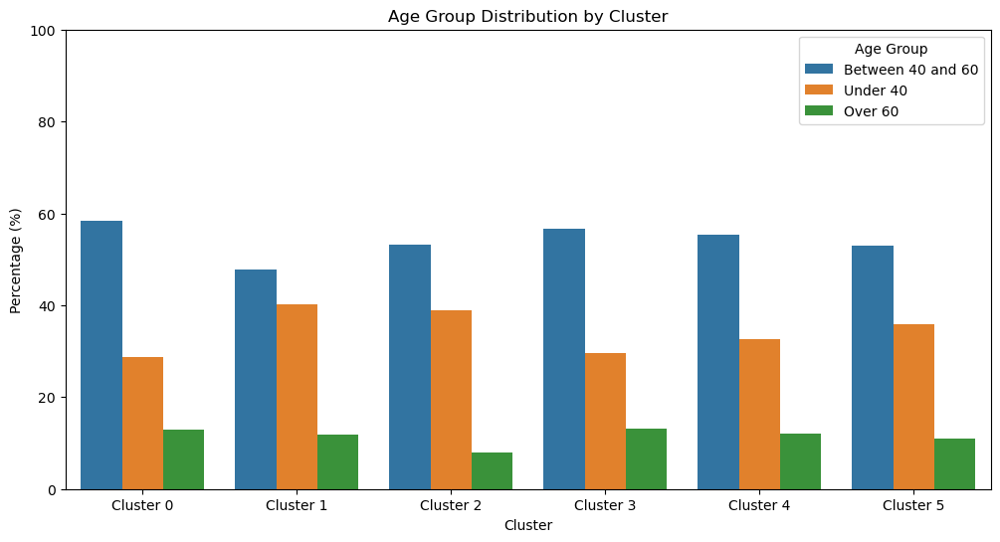

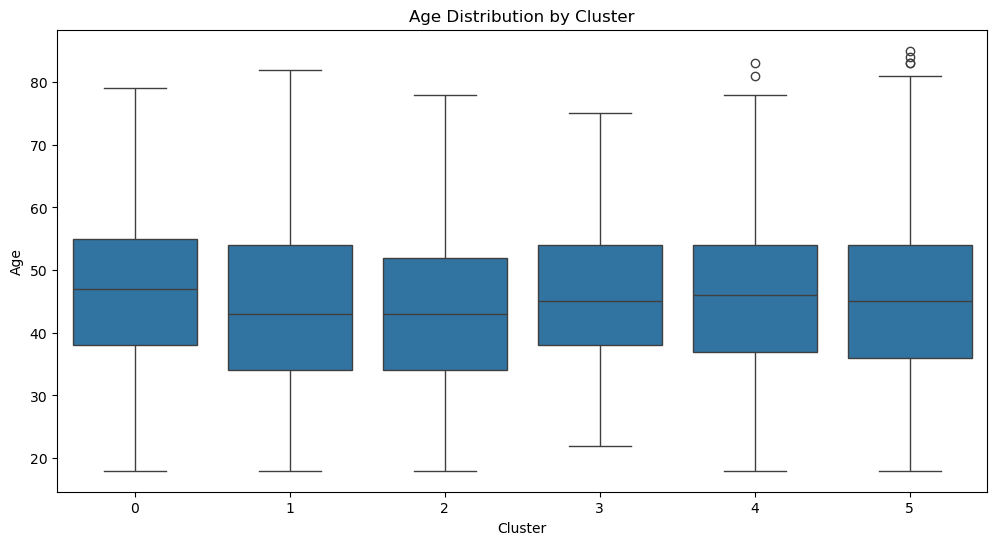

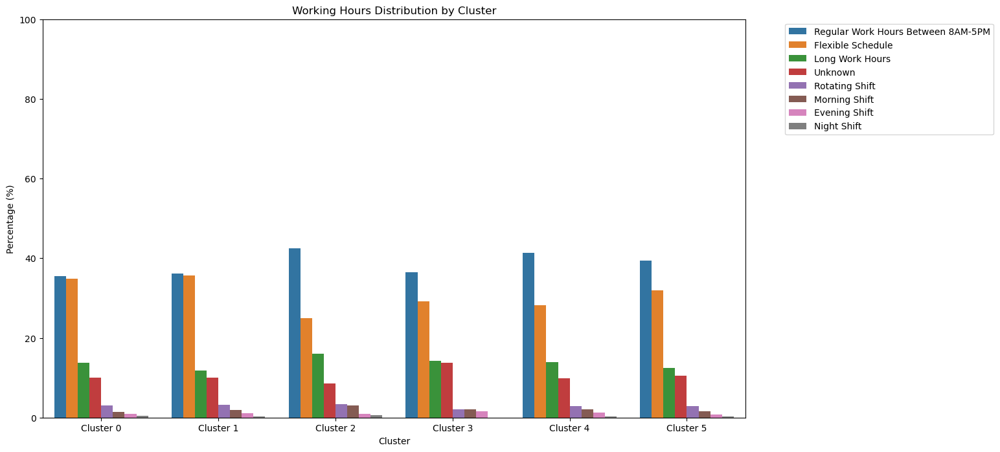

In [ ]:

def visualize_demographics(demo_df, results):
    """
    Create visualizations of demographic distributions by cluster.
    
    Parameters:
    -----------
    demo_df : pandas.DataFrame
        Original demographic DataFrame
    results : dict
        Results dictionary from analyze_demographics_by_cluster
        
    Returns:
    --------
    list
        List of matplotlib figures
    """
    figures = []
    
    # 1. Gender distribution
    plt.figure(figsize=(12, 6))
    cluster_labels = [f"Cluster {c}" for c in results['clusters']]
    
    # Prepare data for grouped bar chart
    gender_data = []
    for cluster in results['clusters']:
        for gender, percentage in results['gender'][cluster]['percentages'].items():
            gender_data.append({
                'Cluster': f"Cluster {cluster}",
                'Gender': gender,
                'Percentage': percentage
            })
    
    gender_df = pd.DataFrame(gender_data)
    
    # Plot gender distribution
    gender_plot = sns.barplot(x='Cluster', y='Percentage', hue='Gender', data=gender_df)
    plt.title('Gender Distribution by Cluster')
    plt.ylabel('Percentage (%)')
    plt.ylim(0, 100)
    figures.append(plt.gcf())
    
    # 2. Age group distribution
    plt.figure(figsize=(12, 6))
    
    # Prepare data for grouped bar chart
    age_group_data = []
    for cluster in results['clusters']:
        for age_group, percentage in results['age_group'][cluster]['percentages'].items():
            age_group_data.append({
                'Cluster': f"Cluster {cluster}",
                'Age Group': age_group,
                'Percentage': percentage
            })
    
    age_group_df = pd.DataFrame(age_group_data)
    
    # Plot age group distribution
    age_group_plot = sns.barplot(x='Cluster', y='Percentage', hue='Age Group', data=age_group_df)
    plt.title('Age Group Distribution by Cluster')
    plt.ylabel('Percentage (%)')
    plt.ylim(0, 100)
    figures.append(plt.gcf())
    
    # 3. Age distribution boxplots
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='cluster', y='age', data=demo_df)
    plt.title('Age Distribution by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel('Age')
    figures.append(plt.gcf())
    
    # 4. Working hours distribution
    plt.figure(figsize=(14, 8))
    
    # Prepare data for grouped bar chart
    working_hours_data = []
    for cluster in results['clusters']:
        for hours, percentage in results['working_hours'][cluster]['percentages'].items():
            working_hours_data.append({
                'Cluster': f"Cluster {cluster}",
                'Working Hours': hours,
                'Percentage': percentage
            })
    
    hours_df = pd.DataFrame(working_hours_data)
    
    # Plot working hours distribution
    hours_plot = sns.barplot(x='Cluster', y='Percentage', hue='Working Hours', data=hours_df)
    plt.title('Working Hours Distribution by Cluster')
    plt.ylabel('Percentage (%)')
    plt.ylim(0, 100)
    plt.xticks(rotation=0)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    figures.append(plt.gcf())
    
    return figures

figures = visualize_demographics(demo_df, results)